# Phase 4 - Data Preparation:
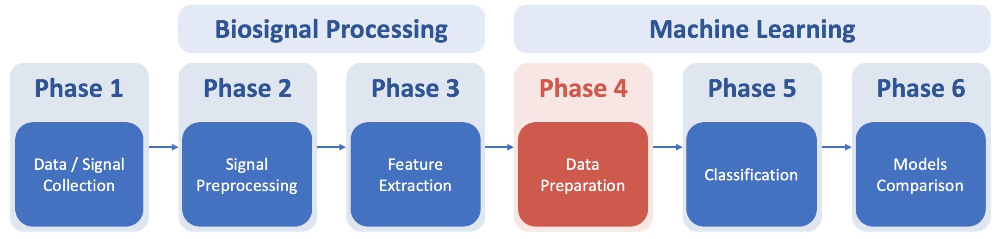
### Objective:
1. Applying Exploratory Data Analysis in order to understand the dataset and figure out, which feature has to be corrected in Feature Engineering.
2. Applying different techniques of Feature Engineering.
3. Applying Feature Selection method in order to filter, which features are considered for Machine Learning Model.

### Notes:
- The dataset is imported from data directory, which has been extracted from Phonocardiogram signals in Phase 3 (Feature Extraction).
- All the functions and variables, which are used in this file, are imported from helpers.py file from the data_preparation package in the same repository.

In [39]:
from helpers import *

import importlib
import helpers
importlib.reload(helpers)
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from imblearn.over_sampling import SMOTE


# Importing constant.py from the main project directory:
import sys
sys.path.insert(0, '/Users/mohammedlajam/Documents/GitHub/pcg-classification')
import constants as c

# 1. Exploratory Data Analysis - EDA:
- Missing values
- Distribution
- Outliers
- Probability Distribution
- Feature Correlation with output Target.

In [40]:
# Loading the dataset:
DATASET = pd.read_csv(f'{c.FEATURE_EXTRACTION_PATH}/tabular/denormalized/extracted_features_v3.csv')

## 1.1. Initial Scanning:

In [41]:
DATASET.describe()

,ds_max,ds_min,ds_mean,ds_median,ds_std,energy,power,ae_max,ae_min,ae_mean,ae_median,ae_std,rm_max,rm_min,rm_mean,rm_median,rm_std,zcr,zcr_max,zcr_min,zcr_mean,zcr_median,zcr_std,peak_amplitude,peak_frequency,ber_max,ber_min,ber_mean,ber_median,ber_std,sc_max,sc_min,sc_mean,sc_median,sc_std,sb_max,sb_min,sb_mean,sb_median,sb_std,mfcc_max,mfcc_min,mfcc_mean,mfcc_median,mfcc_std,delta_1_max,delta_1_min,delta_1_mean,delta_1_median,delta_1_std,delta_2_max,delta_2_min,delta_2_mean,delta_2_median,delta_2_std,ca_max,ca_min,ca_mean,ca_median,ca_std,cd_max,cd_min,cd_mean,cd_median,cd_std,class
count,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,1.260900e+04,1.260900e+04,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,1.260900e+04,12609.000000,1.260900e+04,1.260900e+04,1.260900e+04,1.260900e+04,1.260900e+04,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000,12609.000000
mean,13330.137935,-13561.085142,0.181102,2.659301,2176.938632,3.466547e+10,6.933095e+06,13330.137935,585.125775,8306.591456,8647.894976,3321.601606,3183.986093,686.811079,2026.912789,2076.719523,650.178986,0.080279,3183.986093,686.811079,2026.912789,2076.719523,650.178986,1.606494e+06,31.847873,7.198462e+15,7.931025e+03,1.589731e+14,5.955474e+12,8.628432e+14,76.207899,35.632148,45.367679,44.381313,6.987775,85.613226,17.624162,25.224879,22.376873,11.718232,742.116408,-46.655370,73.252413,6.379345,164.643275,9.871828,-16.532849,-0.083017,0.066619,4.535252,17.617317,-6.929836,0.207441,-0.410510,5.006270,18632.945054,-18951.205677,0.243250,3.814293,112.952023,882.306884,-855.880198,0.002303,-0.032164,112.952023,-0.516219
std,8269.467379,8264.017975,10.341138,41.391333,1481.249427,5.840642e+10,1.168128e+07,8269.467379,1747.598304,5199.292421,5835.277038,2385.875673,2150.652147,668.721847,1390.780071,1473.205238,503.289831,0.024104,2150.652147,668.721847,1390.780071,1473.205238,503.289831,1.523616e+06,15.244705,3.173499e+16,5.475162e+04,4.615469e+14,3.764422e+12,3.588251e+15,20.527235,8.103188,8.302808,8.570515,3.015390,24.216829,3.024676,2.636720,2.591949,5.065238,102.626762,10.916605,5.972266,3.193501,16.813809,4.597826,9.895426,0.372089,0.251242,1.926643,7.886774,2.510077,0.263449,0.270865,2.186167,11588.740997,11576.897784,15.060312,59.260455,73.750878,583.211283,569.574214,0.113293,0.743650,73.750878,0.856491
min,225.150814,-52197.143994,-92.821500,-717.417986,40.382235,8.153626e+06,1.630725e+03,225.150814,-28014.292672,103.985367,12.104912,59.072065,101.627739,0.004615,29.527471,2.973564,10.102571,0.020600,101.627739,0.004615,29.527471,2.973564,10.102571,3.069934e+04,9.403762,7.342521e+12,8.456271e+00,1.229489e+12,7.386638e+11,1.494041e+12,27.177467,8.894693,15.524996,10.147123,1.555780,26.033744,1.898919,12.814469,3.385614,1.268607,362.906246,-72.038846,42.435028,-3.343009,91.370803,-0.253339,-56.769502,-4.947805,-2.966925,0.209840,0.068096,-22.683168,-2.789225,-1.565780,0.214262,317.830786,-73726.137807,-131.844829,-1147.920941,2.417832,9.143034,-7089.782207,-1.449620,-15.976256,2.417832,-1.000000
25%,6645.748284,-19238.416103,-4.031019,-8.124997,1087.079591,5.908884e+09,1.181777e+06,6645.748284,6.381299,4064.842894,4009.466193,1509.868946,1544.995545,273.898599,1012.791942,1006.427519,278.617063,0.063200,1544.995545,273.898599,1012.791942,1006.427519,278.617063,6.988014e+05,20.608243,6.875998e+14,2.868582e+02,3.497698e+13,3.637538e+12,1.009308e+14,61.133889,31.212360,41.076506,39.871357,4.889985,

In [42]:
ExploratoryDataAnalysisTabular(dataset=DATASET).extract_initial_analysis()

Number of Subjects: 12609
Number of Features: 67
Number of missing values: 0
Classes: [ 1 -1]
Number of subjects per class:
 -1    9559
 1    3050
Name: class, dtype: int64


## 1.2. Distribution, Outliers and Probability Distribution:
For each Feature, the following is applied:
- Histogram
- Box and Whisker plot
- Q-Q Plot

In [43]:
# Creating a list contains all the feature names:
FEATURES = [feature for feature in DATASET.columns if feature not in ['signal_id', 'class']]

In [44]:
DESCRIPTIVE_STAT = ['ds_max', 'ds_min', 'ds_mean', 'ds_median', 'ds_std']
ENERGY_POWER = ['power', 'energy']
AMPLITUDE_ENVELOPE = ['ae_max', 'ae_min', 'ae_mean', 'ae_median', 'ae_std']
ROOT_MEAN_SQUARE_ENERGY = ['rm_max', 'rm_min', 'rm_mean', 'rm_median', 'rm_std']
ZERO_CROSSING_RATE = ['zcr', 'zcr_max', 'zcr_min', 'zcr_mean', 'zcr_median', 'zcr_std']
SPECTRUM_FEATURES = ['peak_amplitude', 'peak_frequency']
BAND_ENERGY_RATIO = ['ber_max', 'ber_min', 'ber_mean', 'ber_median', 'ber_std']
SPECTRAL_CENTROID = ['sc_max', 'sc_min', 'sc_mean', 'sc_median', 'sc_std']
SPECTRAL_BANDWIDTH = ['sb_max', 'sb_min', 'sb_mean', 'sb_median', 'sb_std']
MFCCS = ['mfcc_max', 'mfcc_min', 'mfcc_mean', 'mfcc_median', 'mfcc_std']
DELTA_1 = ['delta_1_max', 'delta_1_min', 'delta_1_mean', 'delta_1_median', 'delta_1_std']
DELTA_2 = ['delta_2_max', 'delta_2_min', 'delta_2_mean', 'delta_2_median', 'delta_2_std']
DISCRETE_WAVELET = ['ca_max', 'ca_min', 'ca_mean', 'ca_median', 'ca_std', 'cd_max', 'cd_min', 'cd_mean', 'cd_median', 'cd_std']

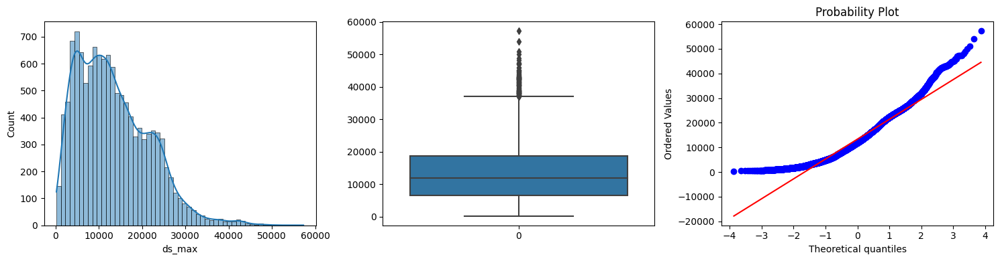

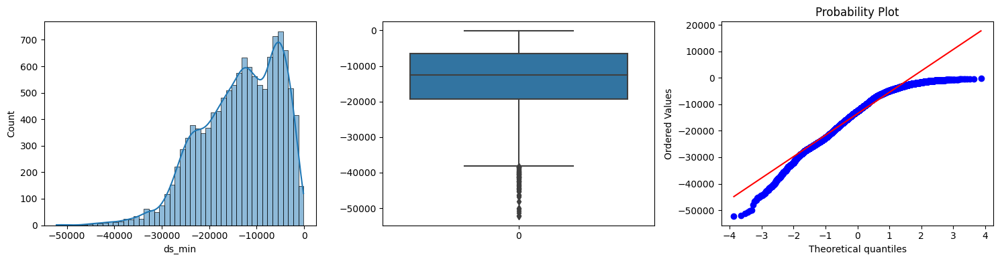

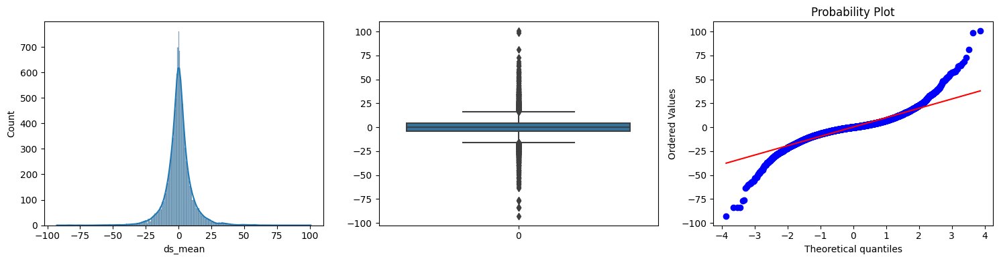

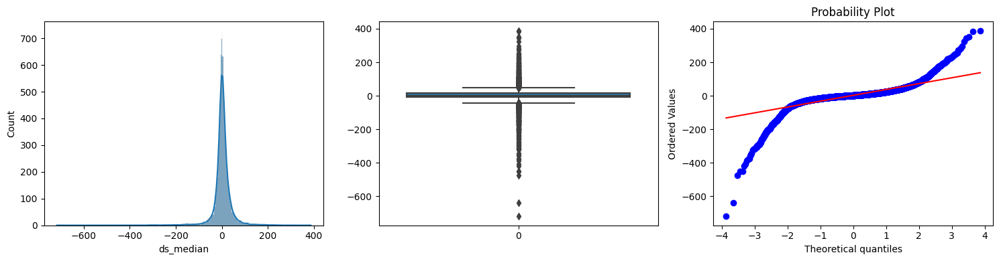

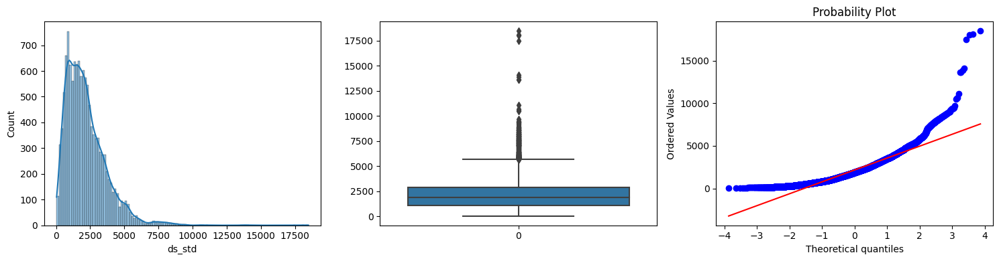

...

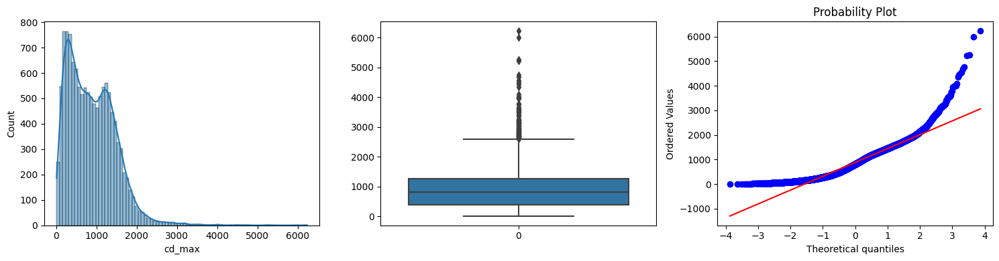

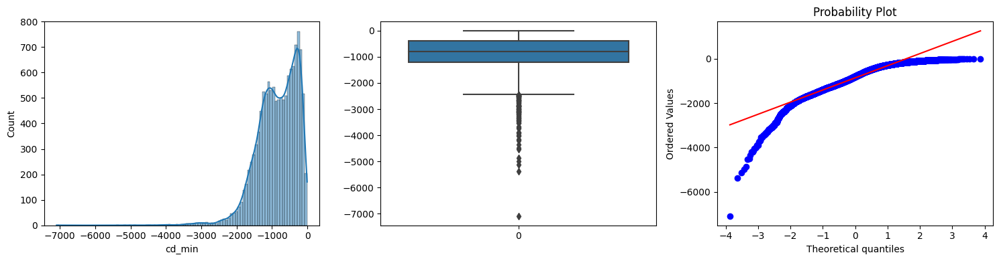

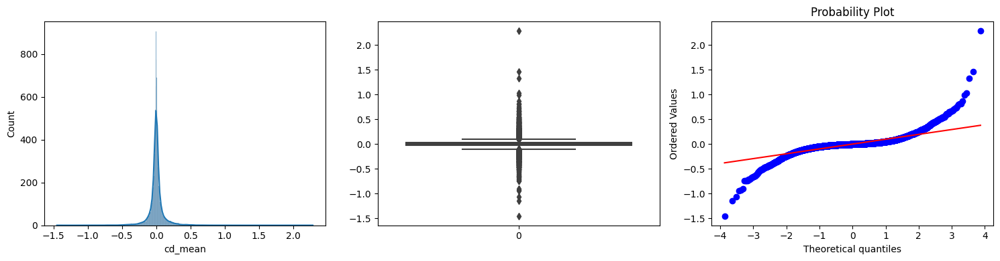

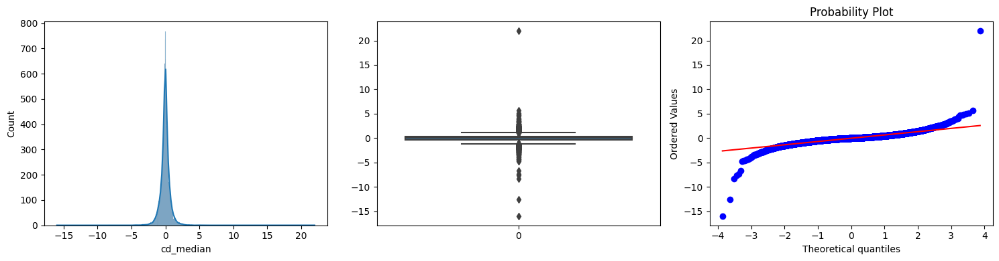

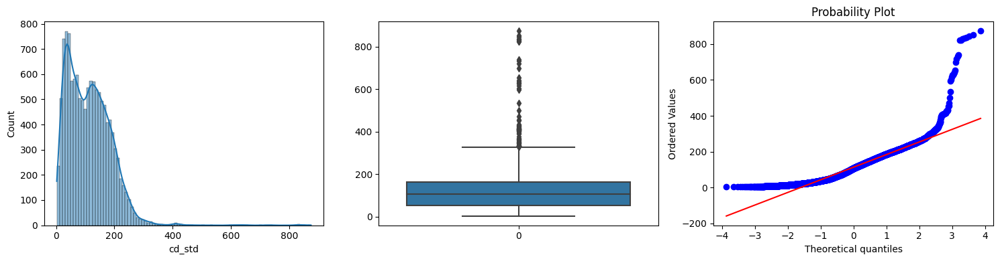

In [45]:
# Visualizing Histogram, Box and Whisker Plot and Q-Q Plot:
for feature in FEATURES:
    ExploratoryDataAnalysisTabular(dataset=DATASET).visualize_feature(feature=feature)

### Observation:
- Total of 12609 Subjects with 65 Features
- No Missing Values
- All values are Continuous Nummeric Values
- Data are not normalized.
- Imbalanced Dataset (9559 and 3050 for Negative and Positive respectively)
- All of the features have Skewness.

# 2. Feature Engineering:
Based on Exploratory Data Analysis, the following is applied:
- Splitting Datasets into Train and Test sets in order to reduce the Data-Leakage and Model Over-Fitting.
- Normalization the features in both (train and test sets).
- Feature Scaling for both (train and test sets) in order to transform the Skewness into Normal Distribution.
- Balancing Dataset in order to avoid any bias during training the Machine Learning Model.

__Note:__
- In this Notebook, all techniques are applied based on Holdout Cross-Validation.
- But in data-preparation.py,  all techniques are applied based on Stratified K-Fold Cross Validation.

## 2.1. Cross-Validation:
### 2.1.1. Group Stratified K-Fold Cross-Validation:
- In this section, Stratified K-Fold Cross-Validation is applied to generate 6 Folds.
- One each Fold, all the Feature Engineering techniques are applied separately on Train and Test sets.

In [46]:
# Generating indices for each fold in a list for train and test sets:
TRAIN_INDICES, TEST_INDICES = FeatureEngineeringTabular(dataset=DATASET).create_cross_validation(n_folds=c.N_FOLDS,
                                                                                          rand_state=c.RANDOM_STATE)

In [47]:
# Train set:
X_TRAIN_F1, Y_TRAIN_F1 = FeatureEngineeringTabular(dataset=DATASET).create_dataframe_from_indices(indices_list=TRAIN_INDICES,
                                                                                                  index=0)
X_TRAIN_F2, Y_TRAIN_F2 = FeatureEngineeringTabular(dataset=DATASET).create_dataframe_from_indices(indices_list=TRAIN_INDICES,
                                                                                                  index=1)
X_TRAIN_F3, Y_TRAIN_F3 = FeatureEngineeringTabular(dataset=DATASET).create_dataframe_from_indices(indices_list=TRAIN_INDICES,
                                                                                                  index=2)
X_TRAIN_F4, Y_TRAIN_F4 = FeatureEngineeringTabular(dataset=DATASET).create_dataframe_from_indices(indices_list=TRAIN_INDICES,
                                                                                                  index=3)
X_TRAIN_F5, Y_TRAIN_F5 = FeatureEngineeringTabular(dataset=DATASET).create_dataframe_from_indices(indices_list=TRAIN_INDICES,
                                                                                                  index=4)
X_TRAIN_F6, Y_TRAIN_F6 = FeatureEngineeringTabular(dataset=DATASET).create_dataframe_from_indices(indices_list=TRAIN_INDICES,
                                                                                                  index=5)

# Test set:
X_TEST_F1, Y_TEST_F1 = FeatureEngineeringTabular(dataset=DATASET).create_dataframe_from_indices(indices_list=TEST_INDICES,
                                                                                                index=0)
X_TEST_F2, Y_TEST_F2 = FeatureEngineeringTabular(dataset=DATASET).create_dataframe_from_indices(indices_list=TEST_INDICES,
                                                                                                index=1)
X_TEST_F3, Y_TEST_F3 = FeatureEngineeringTabular(dataset=DATASET).create_dataframe_from_indices(indices_list=TEST_INDICES,
                                                                                                index=2)
X_TEST_F4, Y_TEST_F4 = FeatureEngineeringTabular(dataset=DATASET).create_dataframe_from_indices(indices_list=TEST_INDICES,
                                                                                                index=3)
X_TEST_F5, Y_TEST_F5 = FeatureEngineeringTabular(dataset=DATASET).create_dataframe_from_indices(indices_list=TEST_INDICES,
                                                                                                index=4)
X_TEST_F6, Y_TEST_F6 = FeatureEngineeringTabular(dataset=DATASET).create_dataframe_from_indices(indices_list=TEST_INDICES,
                                                                                                index=5)

In [48]:
X_TRAIN_F1.head(5)

,ds_max,ds_min,ds_mean,ds_median,ds_std,energy,power,ae_max,ae_min,ae_mean,ae_median,ae_std,rm_max,rm_min,rm_mean,rm_median,rm_std,zcr,zcr_max,zcr_min,zcr_mean,zcr_median,zcr_std,peak_amplitude,peak_frequency,ber_max,ber_min,ber_mean,ber_median,ber_std,sc_max,sc_min,sc_mean,sc_median,sc_std,sb_max,sb_min,sb_mean,sb_median,sb_std,mfcc_max,mfcc_min,mfcc_mean,mfcc_median,mfcc_std,delta_1_max,delta_1_min,delta_1_mean,delta_1_median,delta_1_std,delta_2_max,delta_2_min,delta_2_mean,delta_2_median,delta_2_std,ca_max,ca_min,ca_mean,ca_median,ca_std,cd_max,cd_min,cd_mean,cd_median,cd_std
0,6116.374124,-3159.395363,-2.619558,0.906077,649.143758,2.106972e+09,421394.481262,6116.374124,211.397425,3327.798897,4376.943476,1891.523627,913.185518,277.229829,625.956183,617.070400,151.040348,0.0566,913.185518,277.229829,625.956183,617.070400,151.040348,497474.184845,31.212485,1.512723e+15,1028.787072,5.431613e+13,8.053442e+12,1.935188e+14,60.373517,29.574760,38.280575,36.441858,5.805631,88.533757,18.063438,23.627219,21.236205,9.598706,583.744718,-46.264440,66.878247,6.570279,135.418974,7.246593,-8.708306,0.059407,0.155300,2.970460,13.879429,-4.906559,0.359436,0.197549,3.573774,8639.391584,-4414.624206,-3.689667,-1.148264,29.234891,306.526648,-333.007216,-0.007935,0.155543,29.234891
1,5357.292406,-3620.298771,3.577782,9.911908,678.349755,2.300856e+09,460171.190775,5357.292406,182.517729,3111.671281,4157.453378,1614.662905,914.721447,190.638557,653.000157,655.111737,163.413345,0.0514,914.721447,190.638557,653.000157,655.111737,163.413345,530665.193934,29.211685,6.015081e+14,577.845815,4.819763e+13,8.264480e+12,1.061896e+14,68.275737,26.309297,37.073291,35.459136,6.670883,98.620897,16.923853,24.503428,20.336001,14.837365,629.080845,-38.201446,68.174129,4.625973,140.256117,9.559465,-20.988684,0.014943,0.494873,5.180553,19.335067,-7.101587,0.268559,-0.348668,5.634390,7483.208614,-4969.907789,5.365539,13.863005,25.909164,203.300642,-247.257055,0.003716,-0.223154,25.909164
2,5791.537719,-3206.719136,2.481484,13.516915,682.539483,2.329332e+09,465866.303015,5791.537719,130.035919,3231.998096,3685.619639,1234.611066,1012.807142,306.131912,662.014667,641.475433,120.127581,0.0508,1012.807142,306.131912,662.014667,641.475433,120.127581,451649.640679,31.412565,9.850395e+14,1933.727264,4.766258e+13,5.001518e+12,1.494190e+14,55.201699,28.128106,38.153700,35.802397,6.282715,85.385961,17.870900,24.129772,21.166692,10.625663,606.050950,-44.778890,67.869160,7.159512,140.234759,8.930436,-17.521079,0.080575,0.623200,4.567705,16.908089,-6.786070,0.223642,-0.125789,4.986215,8183.456543,-4532.536162,3.628802,18.992574,29.391352,279.404736,-299.005950,0.005592,-0.424013,29.391352
3,5087.225548,-2785.511292,-1.417862,-3.281152,623.230580,1.942092e+09,388418.366714,5087.225548,129.893049,2726.392088,2303.360890,1377.112018,874.237527,248.473323,600.395701,588.046884,146.517735,0.0508,874.237527,248.473323,600.395701,588.046884,146.517735,391564.563312,23.009204,2.471203e+15,1150.945013,4.827978e+13,3.912591e+12,2.776296e+14,58.509530,25.656983,37.052571,34.424920,6.707536,86.559386,18.105035,23.933654,20.866824,10.425509,615.735186,-43.934323,67.764531,6.877054,138.524472,8.187542,-19.260219,-0.133488,0.076273,4.591115,14.927089,-6.185174,0.221446,-0.226436,4.707223,7188.114121,-3788.764138,-2.205668,-5.124782,25.032336,255.349455,-303.384302,-0.011148,0.035573,25.032336
4,6615.592958,-3485.282551,2.709498,16.779679,744.010659,2.767796e+09,553559.202467,6615.592958,430.219369,3367.241205,2353.514947,2077.566695,1110.363518,233.609381,687.052878,716.141350,219.907696,0.0562,1110.363518,233.609381,687.052878,716.141350,219.907696,471325.784928,30.212085,3.755145e+15,577.855108,8.975511e+13,8.330861e+12,4.263422e+14,80.203749,29.012383,37.188018,35.057771,7.948633,85.405989,17.006719,22.959736,20.136690,11.228284,646.625699,-37.892495,67.865540,3.817275,142.613416,7.227497,-15.743345,0.083697,0.148721,4.001408,19.905367,-7.153510,0.271351,-0.277801,5.258888,9341.471916,-4785.

In [49]:
X_TRAIN_F2.head(5)

,ds_max,ds_min,ds_mean,ds_median,ds_std,energy,power,ae_max,ae_min,ae_mean,ae_median,ae_std,rm_max,rm_min,rm_mean,rm_median,rm_std,zcr,zcr_max,zcr_min,zcr_mean,zcr_median,zcr_std,peak_amplitude,peak_frequency,ber_max,ber_min,ber_mean,ber_median,ber_std,sc_max,sc_min,sc_mean,sc_median,sc_std,sb_max,sb_min,sb_mean,sb_median,sb_std,mfcc_max,mfcc_min,mfcc_mean,mfcc_median,mfcc_std,delta_1_max,delta_1_min,delta_1_mean,delta_1_median,delta_1_std,delta_2_max,delta_2_min,delta_2_mean,delta_2_median,delta_2_std,ca_max,ca_min,ca_mean,ca_median,ca_std,cd_max,cd_min,cd_mean,cd_median,cd_std
0,3322.356133,-1852.463706,-3.637957,-12.246283,395.910789,7.837929e+08,1.567586e+05,3322.356133,416.984082,1701.696551,1604.322877,744.269694,559.852530,218.651574,380.141015,379.276671,76.815701,0.0666,559.852530,218.651574,380.141015,379.276671,76.815701,3.531136e+05,10.604242,6.218391e+14,745.872649,3.683061e+13,5.706200e+12,9.596845e+13,64.401767,30.450401,42.851300,42.242409,5.858999,86.938018,19.360575,28.037489,24.733371,12.711961,644.316039,-44.340399,66.058262,6.446122,138.295343,7.316039,-20.244221,-0.291128,0.093924,4.804950,24.457182,-9.247382,0.441952,-0.394636,6.651397,4671.565612,-2545.576468,-5.079028,-18.708271,20.858059,107.143003,-125.057387,-0.051720,0.154071,20.858059
1,2568.879036,-1821.095625,3.010134,-2.588887,391.504669,7.664248e+08,1.532850e+05,2568.879036,440.525615,1711.405230,1686.463898,529.021342,526.229659,198.768187,377.292975,363.642209,71.952617,0.0686,526.229659,198.768187,377.292975,363.642209,71.952617,2.786338e+05,10.404162,1.178515e+15,1417.613662,4.050147e+13,3.655267e+12,1.524082e+14,59.936367,33.179738,43.729313,44.244151,4.899791,76.939683,21.092815,27.408711,24.296214,11.148177,669.514376,-47.008804,65.389084,7.985458,138.589114,11.590643,-30.174031,-0.267371,0.265695,6.895695,25.082894,-8.219902,0.693702,0.080625,7.236234,3627.999301,-2492.288518,4.649242,-1.569078,21.553232,129.934887,-145.808451,0.007335,-0.142023,21.553232
2,2510.328327,-2293.225256,-0.628169,-2.308329,386.498075,7.469058e+08,1.493812e+05,2510.328327,141.626863,1542.743690,1641.159517,610.894897,592.337462,125.486096,371.410277,375.758894,95.444738,0.0688,592.337462,125.486096,371.410277,375.758894,95.444738,2.773990e+05,10.204082,5.373070e+14,2395.123422,3.488292e+13,6.836790e+12,9.175836e+13,49.720432,29.059780,42.030691,42.147559,4.496656,74.745619,15.951640,26.510619,25.015944,9.886521,548.673989,-48.157724,64.760818,10.130126,130.243266,7.502796,-17.207950,-0.334953,-0.220762,4.119396,14.217345,-7.029297,0.339110,0.220667,4.570399,3476.120725,-3237.889642,-0.812084,-4.098851,19.959373,138.594658,-130.481679,-0.006132,0.065316,19.959373
3,2056.701990,-2514.016276,-1.050733,1.778290,393.500048,7.742170e+08,1.548434e+05,2056.701990,237.510407,1356.994715,1376.052720,426.949192,513.308862,158.967954,381.955381,383.540263,65.307482,0.0696,513.308862,158.967954,381.955381,383.540263,65.307482,2.147095e+05,31.012405,3.390547e+14,548.404184,1.844151e+13,5.038648e+12,4.628713e+13,72.310935,32.586221,44.972789,45.364087,6.087114,96.536381,18.704619,27.664437,24.527831,12.270377,597.262261,-50.582500,64.650728,6.912477,135.434245,8.024151,-21.693482,-0.157304,0.213177,5.025974,22.893426,-8.111502,0.248741,-0.635567,6.256041,2906.381190,-3548.076095,-1.620771,1.234204,23.423210,177.418330,-160.342937,-0.010723,0.115423,23.423210
4,16592.788351,-16941.352522,-1.622181,11.686774,2526.784482,3.192321e+10,6.384642e+06,16592.788351,424.510706,10622.372066,11004.067136,4408.705674,3103.847300,453.245000,2400.788837,2785.168836,735.423763,0.0626,3103.847300,453.245000,2400.788837,2785.168836,735.423763,1.447741e+06,32.813125,5.547229e+15,9035.139193,1.090629e+14,6.618391e+12,6.196247e+14,50.634364,32.904259,40.801602,39.686089,3.816925,59.307776,13.639462,19.962970,18.680946,6.973793,643.268263,-42.322758,74.007809,0.798987,162.180742,4.054504,-8.230236,-0.182717,0.094574,2.093291,5.619828,-3.614507,0.020147,-0.285412,2.235091,23450.147189,-23932.144

### 2.1.2. Holdout Cross-Validation:
- In this section Holdout Cross-Validation is applied only for demonistration purpose.
- In data-preparation.py, Stratified K-Fold Cross Validation is applied.

In [50]:
X_TRAIN, X_TEST, Y_TRAIN, Y_TEST = FeatureEngineeringTabular(dataset=DATASET).split_dataset(test_size=c.TEST_SIZE, 
                                                                                            rand_state=c.RANDOM_STATE)

In [51]:
print(f'Shape of X_TRAIN:{X_TRAIN.shape}')
print(f'Shape of X_TRAIN:{Y_TRAIN.shape}')
print(f'Shape of X_TRAIN:{X_TEST.shape}')
print(f'Shape of X_TRAIN:{Y_TEST.shape}')

Shape of X_TRAIN:(10087, 65)
Shape of X_TRAIN:(10087,)
Shape of X_TRAIN:(2522, 65)
Shape of X_TRAIN:(2522,)


## 2.2. Feature Scaling:
### 2.2.1. Gaussian Transformation:
- Applying Gaussian Transformation in order to correct the Skewness of the feature to a Normal Distribution.
- If skewness value lies above +1 or below -1, data is highly skewed. If it lies between +0.5 to -0.5, it is moderately skewed. If the value is 0, then the data is symmetric.
- There are 4 methods of Gaussian Transformation.
- Each method is applied on every feature to check, which Gaussian Transformation method is suitable for converting the skewed feature to Normal Distribution.
- Additionally, Missing values are checked one everytime the Gassuan Transformation is applied. This is because in some cases, Gaussian Transformation creates NaN values. And if so, Missing Values are handled.

__Gaussian Transformation Mehtods:__
1. Logarithmic Transformation
2. Square Root Transformation
3. Cube Root Transformation
4. Exponential Transformation

__Note:__
- All methods in this section are applied on the Main Dataset to figure out which gaussian transformation technique is suitable for each feature.
- But in data-preparation.py, all these techniques are applied on Train sets only for each Fold of the Cross-Validation.
- With Right Skewed Features, it is recommended to use Cube root transformation, Square root transformation and Logarithm transformation.
- With Left Skewed Features, it is recommended to use square , cube root and logarithmic.

In [52]:
# Create lists inclusing all transformed features for X_TRAIN and X_TEST:
X_TRAIN_TRANSFORMED_FEATURES = []
X_TEST_TRANSFORMED_FEATURES = []

### 1. ds_max:
- __Method used:__ cube_root:

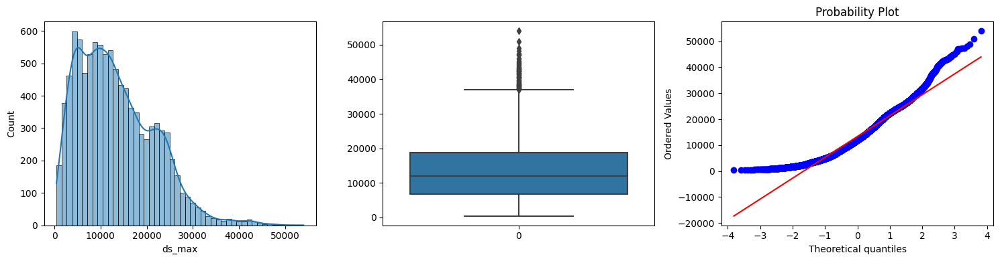

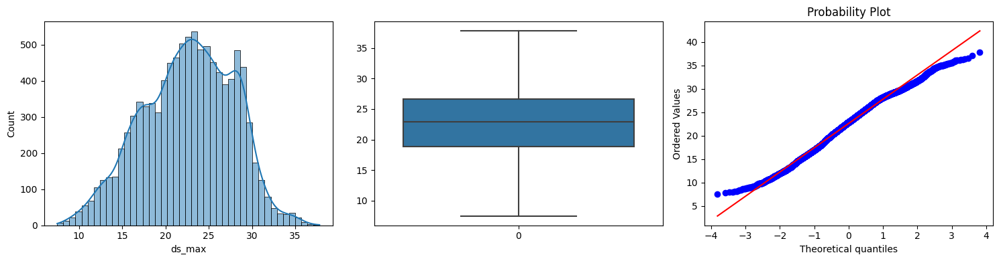

In [53]:
# Applyig Gaussian Transformation:
DS_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ds_max', 
                                                                                              trans_method='cube_root')

# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ds_max')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DS_MAX_TRANSFORMED).visualize_feature(feature='ds_max')

In [54]:
# Counting Outliers:
DS_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ds_max')
DS_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DS_MAX_TRANSFORMED).count_outliers('ds_max')
print(f'Number of outliers before Gaussian Transformation: {DS_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DS_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DS_MAX_TRANSFORMED['ds_max'].skew()}")
print(f'Number of missing values: {DS_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 112
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: -0.20635581794143407
Number of missing values: 0


In [55]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DS_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ds_max', 
                                                                                                      trans_method='cube_root')
X_TEST_DS_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ds_max', 
                                                                                                    trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DS_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DS_MAX_TRANSFORMED)

### 2. ds_min:
- __Method used:__ cube_root:

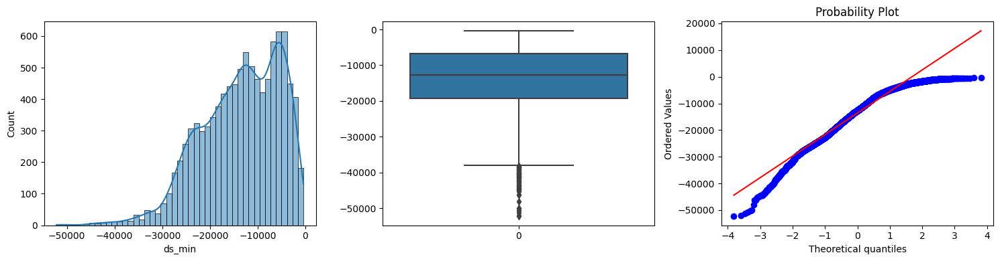

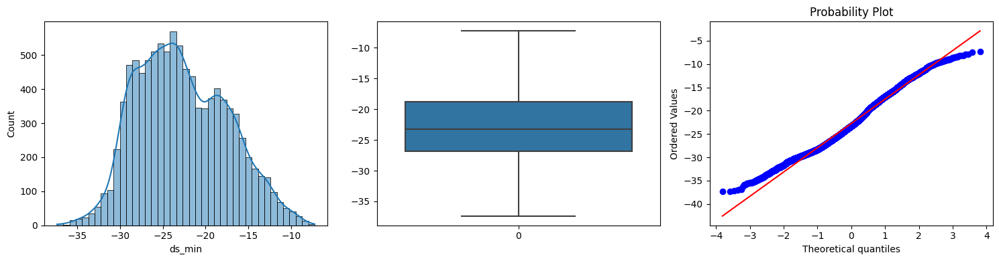

In [56]:
# Applyig Gaussian Transformation:
DS_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ds_min', 
                                                                                              trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ds_min')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DS_MIN_TRANSFORMED).visualize_feature(feature='ds_min')

In [57]:
# Counting Outliers:
DS_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ds_min')
DS_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DS_MIN_TRANSFORMED).count_outliers('ds_min')
print(f'Number of outliers before Gaussian Transformation: {DS_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DS_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DS_MIN_TRANSFORMED['ds_min'].skew()}")
print(f'Number of missing values: {DS_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 64
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: 0.283469628579202
Number of missing values: 0


In [58]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DS_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ds_min', 
                                                                                                      trans_method='cube_root')
X_TEST_DS_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ds_min', 
                                                                                                    trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DS_MIN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DS_MIN_TRANSFORMED)

### 3. ds_mean:
- __Method used:__ cube_root:

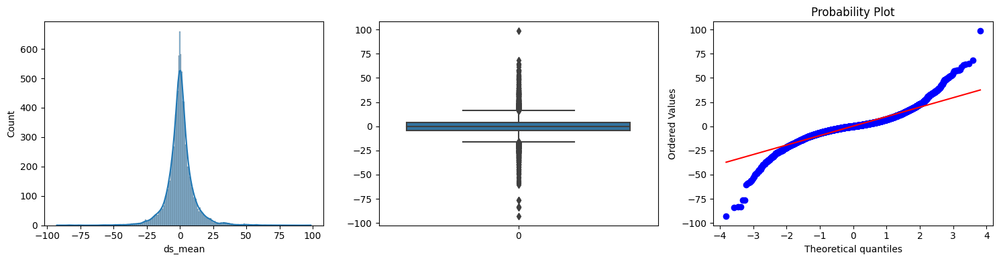

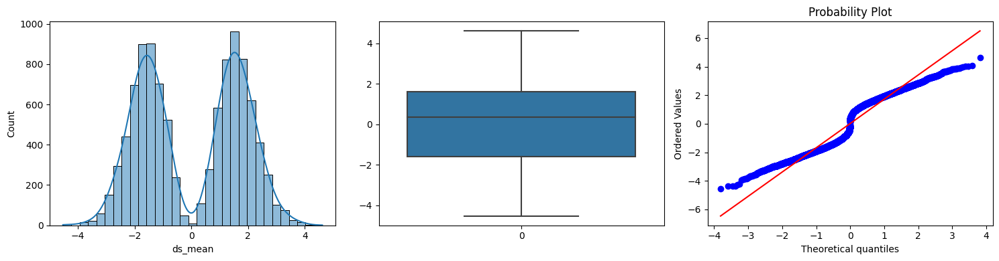

In [59]:
# Applyig Gaussian Transformation:
DS_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ds_mean', 
                                                                                        trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ds_mean')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DS_MEAN_TRANSFORMED).visualize_feature(feature='ds_mean')

In [60]:
# Counting Outliers:
DS_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ds_mean')
DS_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DS_MEAN_TRANSFORMED).count_outliers('ds_mean')
print(f'Number of outliers before Gaussian Transformation: {DS_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DS_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DS_MEAN_TRANSFORMED['ds_mean'].skew()}")
print(f'Number of missing values: {DS_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 936
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: -0.005748784405137982
Number of missing values: 0


In [61]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DS_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ds_mean', 
                                                                                               trans_method='cube_root')
X_TEST_DS_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ds_mean', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DS_MEAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DS_MEAN_TRANSFORMED)

### 4. ds_median:
- __Method used:__ cube_root:

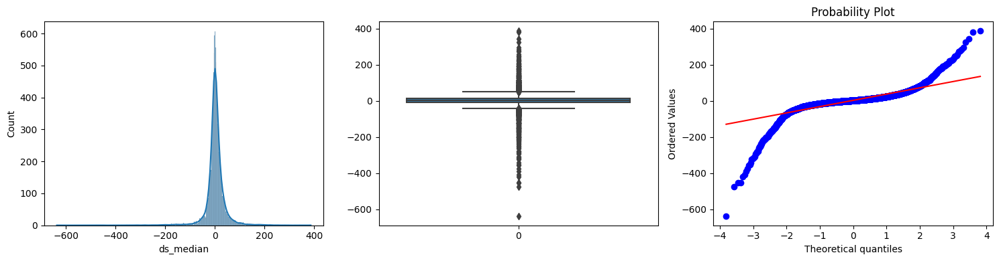

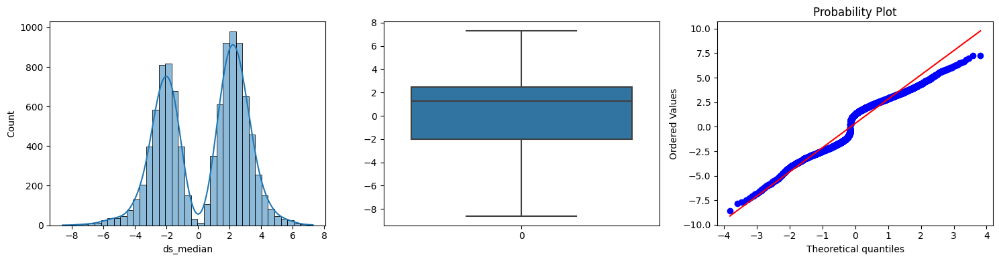

In [64]:
# Applyig Gaussian Transformation:
DS_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ds_median', 
                                                                                        trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ds_median')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DS_MEDIAN_TRANSFORMED).visualize_feature(feature='ds_median')

In [66]:
# Counting Outliers:
DS_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ds_median')
DS_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DS_MEDIAN_TRANSFORMED).count_outliers('ds_median')
print(f'Number of outliers before Gaussian Transformation: {DS_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DS_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DS_MEDIAN_TRANSFORMED['ds_median'].skew()}")
print(f'Number of missing values: {DS_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 1076
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: -0.21958337564737343
Number of missing values: 0


In [67]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DS_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ds_median', 
                                                                                               trans_method='cube_root')
X_TEST_DS_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ds_median', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DS_MEDIAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DS_MEDIAN_TRANSFORMED)

### 5. ds_std:
- __Method used:__ cube_root:

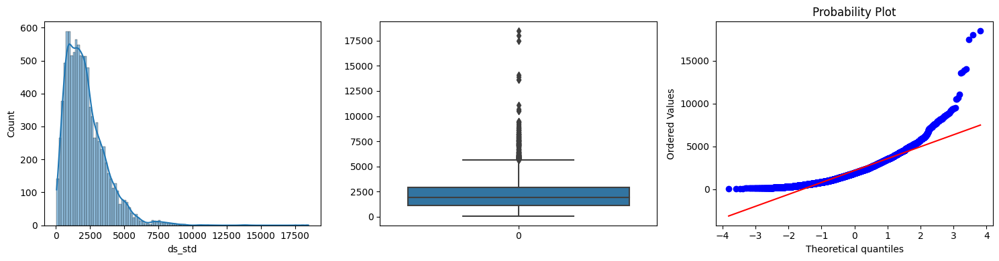

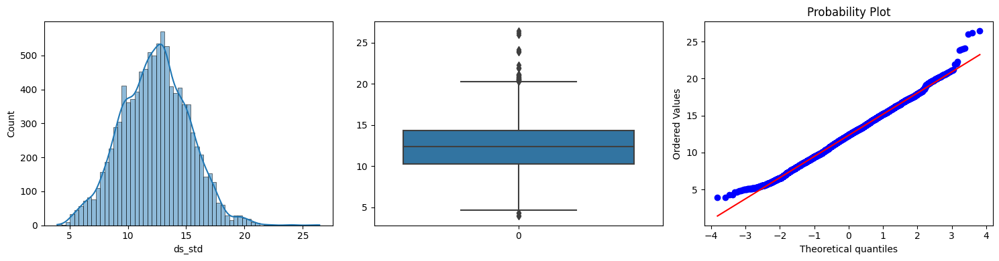

In [68]:
# Applyig Gaussian Transformation:
DS_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ds_std', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ds_std')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DS_STD_TRANSFORMED).visualize_feature(feature='ds_std')

In [69]:
# Counting Outliers:
DS_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ds_std')
DS_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DS_STD_TRANSFORMED).count_outliers('ds_std')
print(f'Number of outliers before Gaussian Transformation: {DS_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DS_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DS_STD_TRANSFORMED['ds_std'].skew()}")
print(f'Number of missing values: {DS_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 246
Number of outliers after Gaussian Transformation: 42
Outlier Coefficient: 0.0890401245669591
Number of missing values: 0


In [71]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DS_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ds_std', 
                                                                                               trans_method='cube_root')
X_TEST_DS_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ds_std', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DS_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DS_STD_TRANSFORMED)

### 6. energy:
- __Method used:__ cube_root:

In [72]:
# Applyig Gaussian Transformation:
ENERGY_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='energy', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabularTabular(dataset=X_TRAIN).visualize_feature(feature='energy')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=ENERGY_TRANSFORMED).visualize_feature(feature='energy')

NameError: name 'ExploratoryDataAnalysisTabularTabular' is not defined

In [ ]:
# Counting Outliers:
ENERGY_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('energy')
ENERGY_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=ENERGY_TRANSFORMED).count_outliers('energy')
print(f'Number of outliers before Gaussian Transformation: {ENERGY_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {ENERGY_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {ENERGY_TRANSFORMED['energy'].skew()}")
print(f'Number of missing values: {ENERGY_TRANSFORMED.isna().sum().sum()}')

In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_ENERGY_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='energy', 
                                                                                               trans_method='cube_root')
X_TEST_ENERGY_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='energy', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_ENERGY_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_ENERGY_TRANSFORMED)

### 7. power:
- __Method used:__ cube_root:

In [ ]:
# Applyig Gaussian Transformation:
POWER_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='power', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='power')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=POWER_TRANSFORMED).visualize_feature(feature='power')

In [ ]:
# Counting Outliers:
POWER_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('power')
POWER_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=POWER_TRANSFORMED).count_outliers('power')
print(f'Number of outliers before Gaussian Transformation: {POWER_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {POWER_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {POWER_TRANSFORMED['power'].skew()}")
print(f'Number of missing values: {POWER_TRANSFORMED.isna().sum().sum()}')

In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_POWER_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='power', 
                                                                                               trans_method='cube_root')
X_TEST_POWER_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='power', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_POWER_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_POWER_TRANSFORMED)

### 8. ae_max:
- __Method used:__ cube_root:

In [ ]:
# Applyig Gaussian Transformation:
AE_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ae_max', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ae_max')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=AE_MAX_TRANSFORMED).visualize_feature(feature='ae_max')

In [ ]:
# Counting Outliers:
AE_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ae_max')
AE_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=AE_MAX_TRANSFORMED).count_outliers('ae_max')
print(f'Number of outliers before Gaussian Transformation: {AE_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {AE_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {AE_MAX_TRANSFORMED['ae_max'].skew()}")
print(f'Number of missing values: {AE_MAX_TRANSFORMED.isna().sum().sum()}')

In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_AE_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ae_max', 
                                                                                               trans_method='cube_root')
X_TEST_AE_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ae_max', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_AE_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_AE_MAX_TRANSFORMED)

### 9. ae_min:
- __Method used:__ cube_root:

In [ ]:
# Applyig Gaussian Transformation:
AE_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ae_min', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ae_min')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=AE_MIN_TRANSFORMED).visualize_feature(feature='ae_min')

In [ ]:
# Counting Outliers:
AE_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ae_min')
AE_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=AE_MIN_TRANSFORMED).count_outliers('ae_min')
print(f'Number of outliers before Gaussian Transformation: {AE_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {AE_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {AE_MIN_TRANSFORMED['ae_min'].skew()}")
print(f'Number of missing values: {AE_MIN_TRANSFORMED.isna().sum().sum()}')

In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_AE_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ae_min', 
                                                                                               trans_method='cube_root')
X_TEST_AE_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ae_min', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_AE_MIN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_AE_MIN_TRANSFORMED)

### 10. ae_mean:
- __Method used:__ cube_root:

In [ ]:
# Applyig Gaussian Transformation:
AE_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ae_mean', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysis(dataset=X_TRAIN).visualize_feature(feature='ae_mean')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabularTabular(dataset=AE_MEAN_TRANSFORMED).visualize_feature(feature='ae_mean')

In [ ]:
# Counting Outliers:
AE_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ae_mean')
AE_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=AE_MEAN_TRANSFORMED).count_outliers('ae_mean')
print(f'Number of outliers before Gaussian Transformation: {AE_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {AE_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {AE_MEAN_TRANSFORMED['ae_mean'].skew()}")
print(f'Number of missing values: {AE_MEAN_TRANSFORMED.isna().sum().sum()}')

In [73]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_AE_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ae_mean', 
                                                                                               trans_method='cube_root')
X_TEST_AE_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ae_mean', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_AE_MEAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_AE_MEAN_TRANSFORMED)

### 11. ae_median:
- __Method used:__ cube_root:

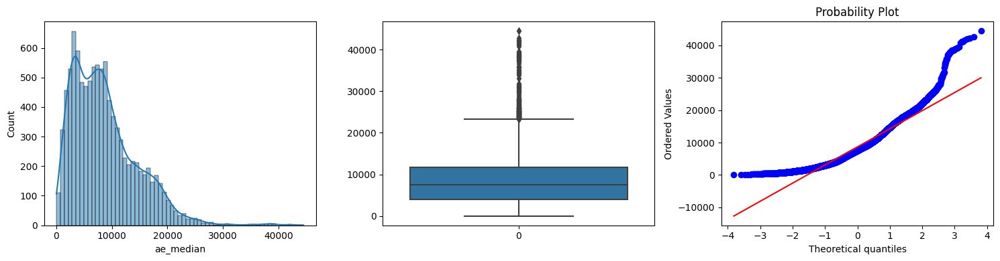

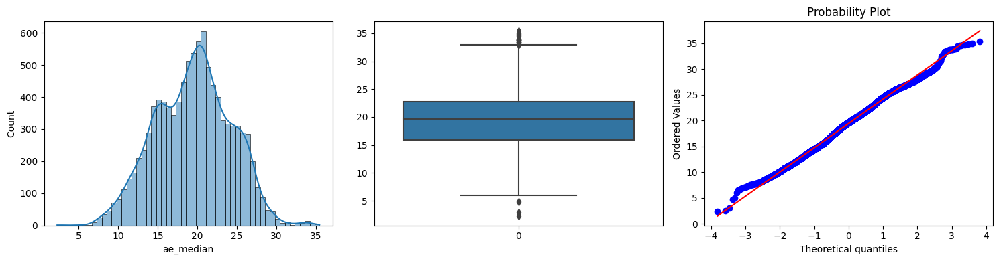

In [74]:
# Applyig Gaussian Transformation:
AE_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ae_median', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ae_median')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=AE_MEDIAN_TRANSFORMED).visualize_feature(feature='ae_median')

In [75]:
# Counting Outliers:
AE_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ae_median')
AE_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=AE_MEDIAN_TRANSFORMED).count_outliers('ae_median')
print(f'Number of outliers before Gaussian Transformation: {AE_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {AE_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {AE_MEDIAN_TRANSFORMED['ae_median'].skew()}")
print(f'Number of missing values: {AE_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 163
Number of outliers after Gaussian Transformation: 35
Outlier Coefficient: -0.05197183820264295
Number of missing values: 0


In [76]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_AE_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ae_median', 
                                                                                               trans_method='cube_root')
X_TEST_AE_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ae_median', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_AE_MEDIAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_AE_MEDIAN_TRANSFORMED)

### 12. ae_std:
- __Method used:__ cube_root:

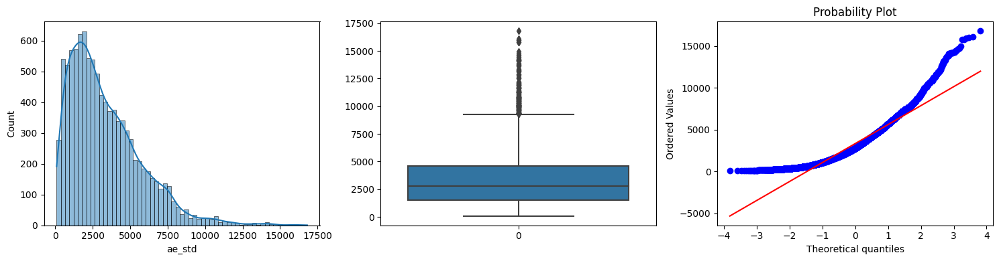

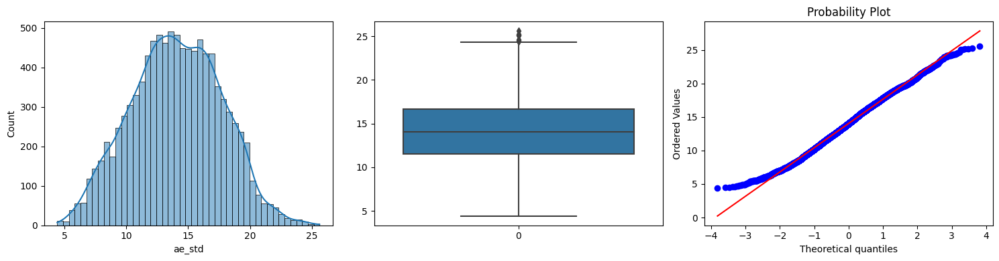

In [77]:
# Applyig Gaussian Transformation:
AE_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ae_std', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ae_std')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=AE_STD_TRANSFORMED).visualize_feature(feature='ae_std')

In [78]:
# Counting Outliers:
AE_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ae_std')
AE_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=AE_STD_TRANSFORMED).count_outliers('ae_std')
print(f'Number of outliers before Gaussian Transformation: {AE_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {AE_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {AE_STD_TRANSFORMED['ae_std'].skew()}")
print(f'Number of missing values: {AE_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 222
Number of outliers after Gaussian Transformation: 10
Outlier Coefficient: -0.0008396029271769154
Number of missing values: 0


In [79]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_AE_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ae_std', 
                                                                                               trans_method='cube_root')
X_TEST_AE_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ae_std', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_AE_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_AE_STD_TRANSFORMED)

### 13. rm_max:
- __Applied Method:__ cube_root:

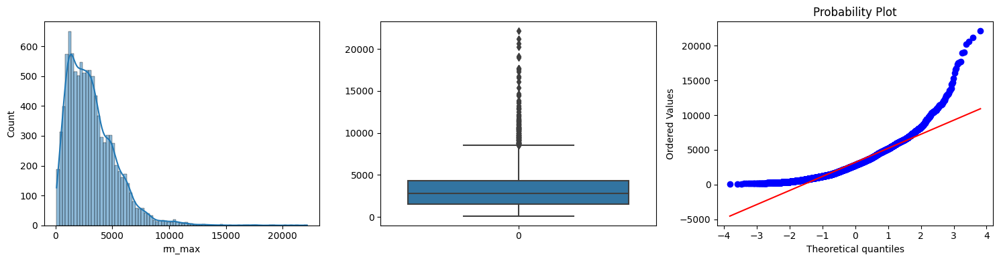

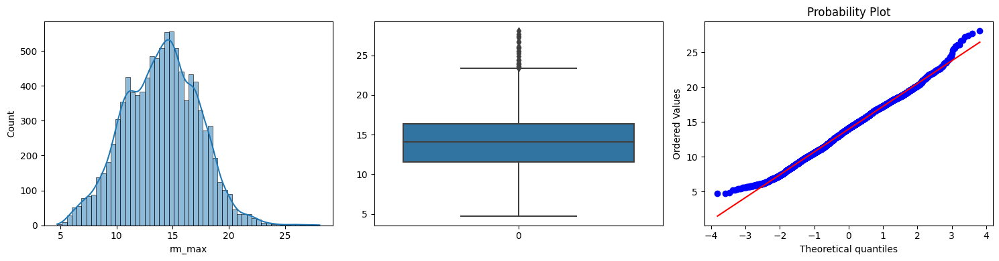

In [80]:
# Applyig Gaussian Transformation:
RM_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='rm_max', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='rm_max')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=RM_MAX_TRANSFORMED).visualize_feature(feature='rm_max')

In [81]:
# Counting Outliers:
RM_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('rm_max')
RM_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=RM_MAX_TRANSFORMED).count_outliers('rm_max')
print(f'Number of outliers before Gaussian Transformation: {RM_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {RM_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {RM_MAX_TRANSFORMED['rm_max'].skew()}")
print(f'Number of missing values: {RM_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 198
Number of outliers after Gaussian Transformation: 28
Outlier Coefficient: 0.02095629105095917
Number of missing values: 0


In [82]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_RM_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='rm_max', 
                                                                                               trans_method='cube_root')
X_TEST_RM_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='rm_max', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_RM_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_RM_MAX_TRANSFORMED)

### 14. rm_min:
- __Applied Method:__ cube_root:

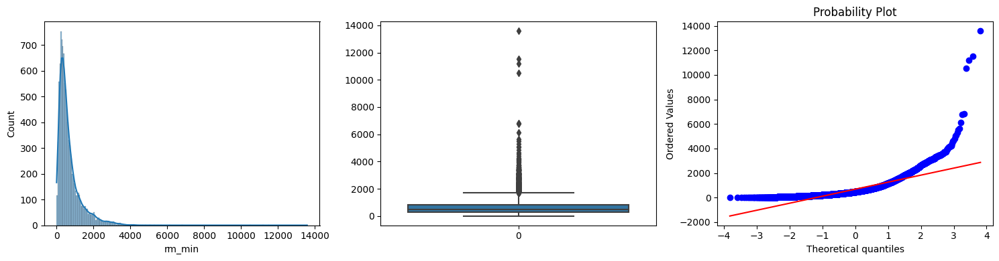

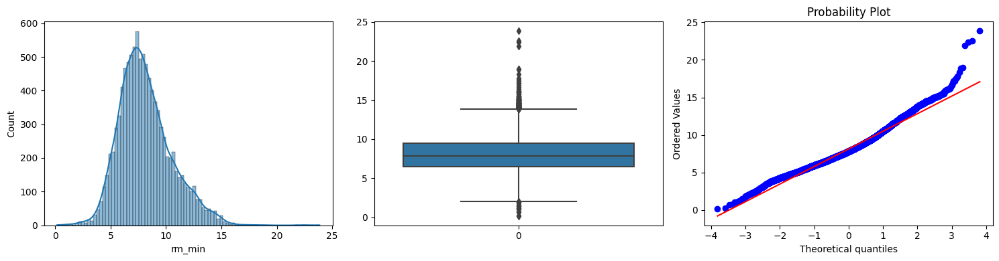

In [83]:
# Applyig Gaussian Transformation:
RM_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='rm_min', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='rm_min')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=RM_MIN_TRANSFORMED).visualize_feature(feature='rm_min')

In [84]:
# Counting Outliers:
RM_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('rm_min')
RM_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=RM_MIN_TRANSFORMED).count_outliers('rm_min')
print(f'Number of outliers before Gaussian Transformation: {RM_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {RM_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {RM_MIN_TRANSFORMED['rm_min'].skew()}")
print(f'Number of missing values: {RM_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 778
Number of outliers after Gaussian Transformation: 231
Outlier Coefficient: 0.6797941972673075
Number of missing values: 0


In [85]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_RM_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='rm_min', 
                                                                                               trans_method='cube_root')
X_TEST_RM_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='rm_min', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_RM_MIN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_RM_MIN_TRANSFORMED)

### 15. rm_mean:
- __Applied Method:__ cube_root:

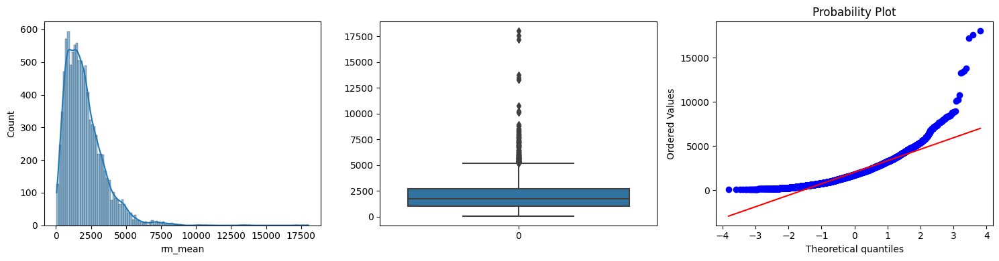

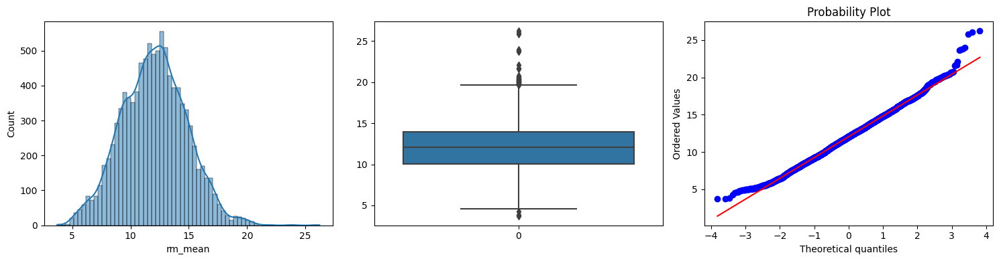

In [86]:
# Applyig Gaussian Transformation:
RM_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='rm_mean', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='rm_mean')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=RM_MEAN_TRANSFORMED).visualize_feature(feature='rm_mean')

In [87]:
# Counting Outliers:
RM_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('rm_mean')
RM_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=RM_MEAN_TRANSFORMED).count_outliers('rm_mean')
print(f'Number of outliers before Gaussian Transformation: {RM_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {RM_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {RM_MEAN_TRANSFORMED['rm_mean'].skew()}")
print(f'Number of missing values: {RM_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 282
Number of outliers after Gaussian Transformation: 59
Outlier Coefficient: 0.12451263072071359
Number of missing values: 0


In [88]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_RM_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='rm_mean', 
                                                                                               trans_method='cube_root')
X_TEST_RM_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='rm_mean', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_RM_MEAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_RM_MEAN_TRANSFORMED)

### 16. rm_median:
- __Applied Method:__ cube_root:

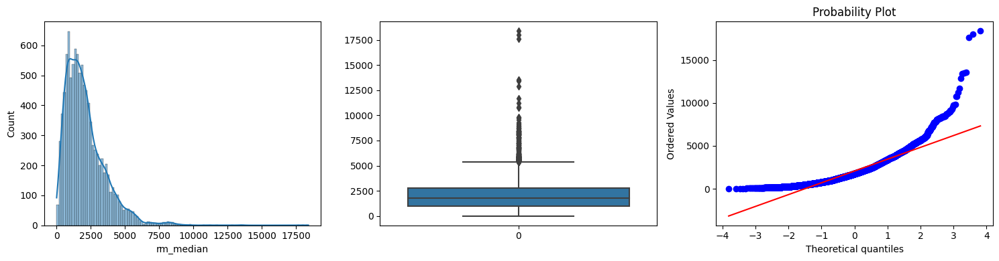

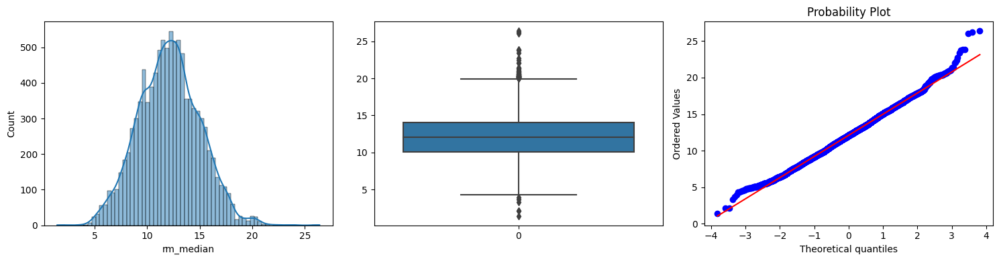

In [89]:
# Applyig Gaussian Transformation:
RM_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='rm_median', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='rm_median')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=RM_MEDIAN_TRANSFORMED).visualize_feature(feature='rm_median')

In [90]:
# Counting Outliers:
RM_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('rm_median')
RM_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=RM_MEDIAN_TRANSFORMED).count_outliers('rm_median')
print(f'Number of outliers before Gaussian Transformation: {RM_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {RM_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {RM_MEDIAN_TRANSFORMED['rm_median'].skew()}")
print(f'Number of missing values: {RM_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 315
Number of outliers after Gaussian Transformation: 73
Outlier Coefficient: 0.1441072311327366
Number of missing values: 0


In [91]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_RM_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='rm_median', 
                                                                                               trans_method='cube_root')
X_TEST_RM_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='rm_median', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_RM_MEDIAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_RM_MEDIAN_TRANSFORMED)

### 17. rm_std:
- __Applied Method:__ cube_root:

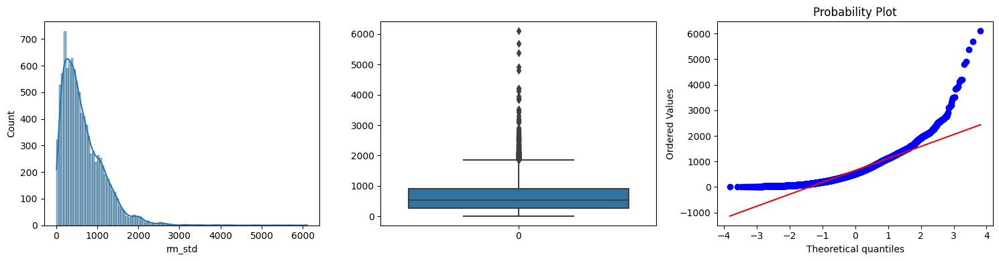

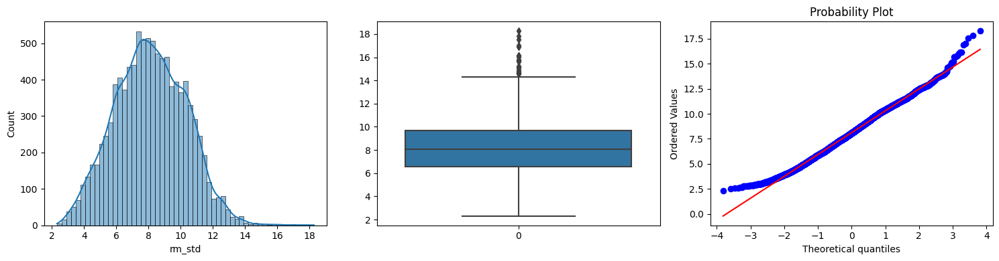

In [92]:
# Applyig Gaussian Transformation:
RM_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='rm_std', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='rm_std')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=RM_STD_TRANSFORMED).visualize_feature(feature='rm_std')

In [93]:
# Counting Outliers:
RM_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('rm_std')
RM_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=RM_STD_TRANSFORMED).count_outliers('rm_std')
print(f'Number of outliers before Gaussian Transformation: {RM_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {RM_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {RM_STD_TRANSFORMED['rm_std'].skew()}")
print(f'Number of missing values: {RM_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 266
Number of outliers after Gaussian Transformation: 23
Outlier Coefficient: 0.09385490970763614
Number of missing values: 0


In [94]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_RM_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='rm_std', 
                                                                                               trans_method='cube_root')
X_TEST_RM_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='rm_std', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_RM_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_RM_STD_TRANSFORMED)

### 18. zcr:
- __Applied Method:__ exponential

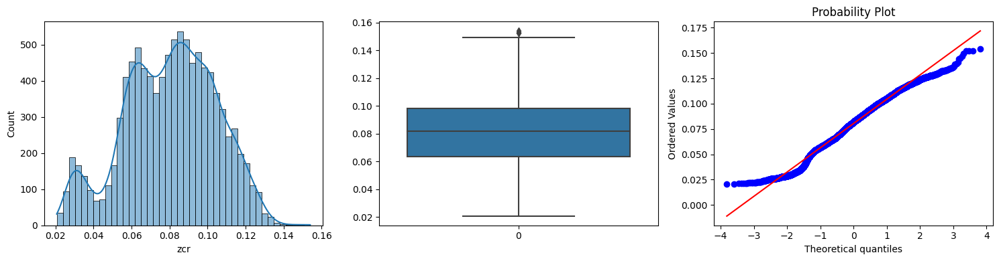

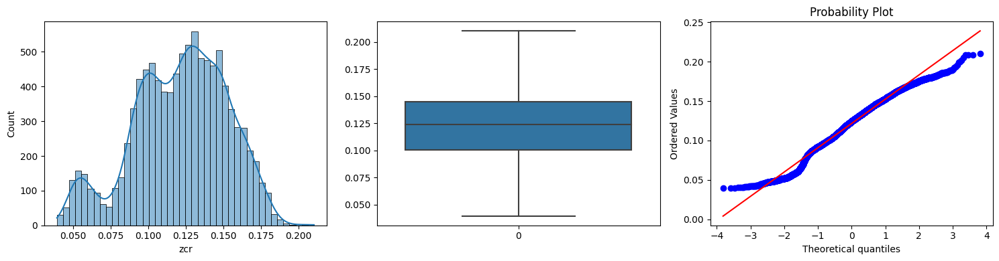

In [95]:
# Applyig Gaussian Transformation:
ZCR_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='zcr', 
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='zcr')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=ZCR_TRANSFORMED).visualize_feature(feature='zcr')

In [96]:
# Counting Outliers:
ZCR_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('zcr')
ZCR_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=ZCR_TRANSFORMED).count_outliers('zcr')
print(f'Number of outliers before Gaussian Transformation: {ZCR_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {ZCR_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {ZCR_TRANSFORMED['zcr'].skew()}")
print(f'Number of missing values: {ZCR_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 4
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: -0.35574984681113486
Number of missing values: 0


In [97]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_ZCR_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='zcr', 
                                                                                               trans_method='exponential')
X_TEST_ZCR_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='zcr', 
                                                                                             trans_method='exponential')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_ZCR_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_ZCR_TRANSFORMED)

### 19. zcr_max:
- __Applied Method:__ cube_root:

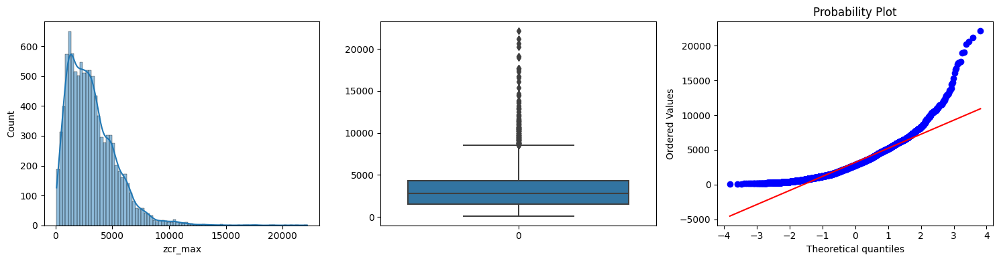

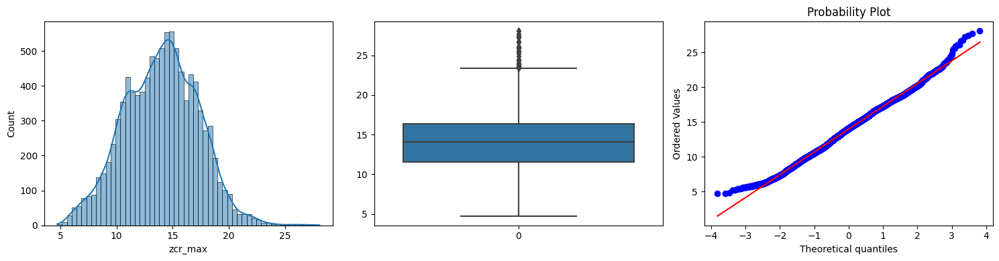

In [98]:
# Applyig Gaussian Transformation:
ZCR_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='zcr_max', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='zcr_max')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=ZCR_MAX_TRANSFORMED).visualize_feature(feature='zcr_max')

In [99]:
# Counting Outliers:
ZCR_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('zcr_max')
ZCR_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=ZCR_MAX_TRANSFORMED).count_outliers('zcr_max')
print(f'Number of outliers before Gaussian Transformation: {ZCR_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {ZCR_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {ZCR_MAX_TRANSFORMED['zcr_max'].skew()}")
print(f'Number of missing values: {ZCR_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 198
Number of outliers after Gaussian Transformation: 28
Outlier Coefficient: 0.02095629105095917
Number of missing values: 0


In [100]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_ZCR_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='zcr_max', 
                                                                                               trans_method='cube_root')
X_TEST_ZCR_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='zcr_max', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_ZCR_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_ZCR_MAX_TRANSFORMED)

### 20. zcr_min:
- log

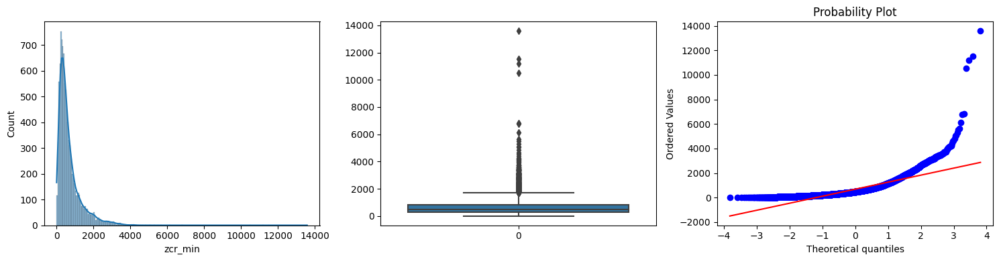

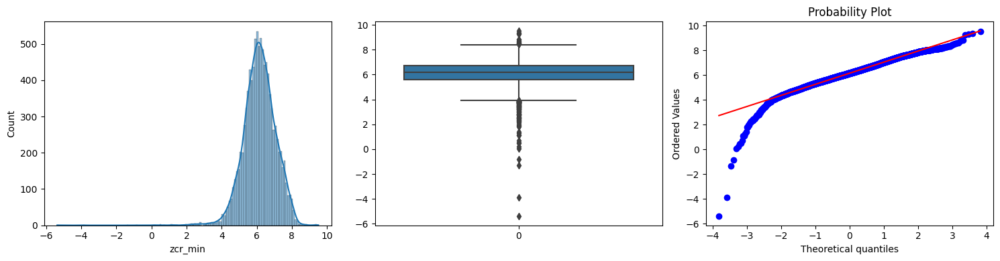

In [101]:
# Applyig Gaussian Transformation:
ZCR_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='zcr_min', 
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='zcr_min')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=ZCR_MIN_TRANSFORMED).visualize_feature(feature='zcr_min')

In [102]:
# Counting Outliers:
ZCR_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('zcr_min')
ZCR_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=ZCR_MIN_TRANSFORMED).count_outliers('zcr_min')
print(f'Number of outliers before Gaussian Transformation: {ZCR_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {ZCR_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {ZCR_MIN_TRANSFORMED['zcr_min'].skew()}")
print(f'Number of missing values: {ZCR_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 778
Number of outliers after Gaussian Transformation: 127
Outlier Coefficient: -0.8502496349220953
Number of missing values: 0


In [103]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_ZCR_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='zcr_min', 
                                                                                               trans_method='log')
X_TEST_ZCR_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='zcr_min', 
                                                                                             trans_method='log')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_ZCR_MIN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_ZCR_MIN_TRANSFORMED)

### 21. zcr_mean:
- __Applied Method:__ cube_root:

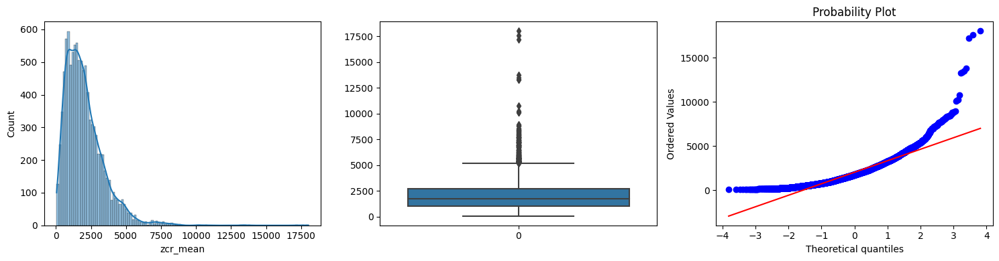

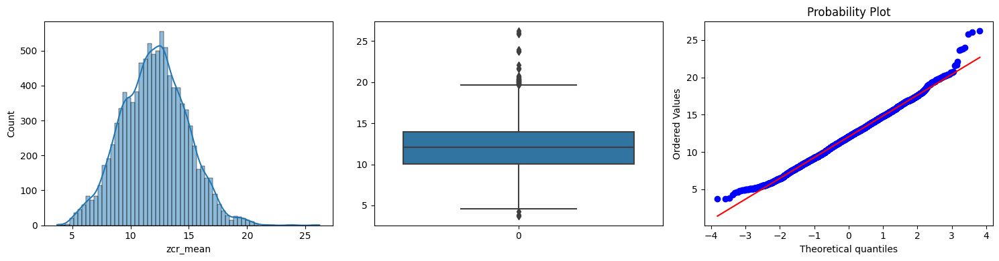

In [104]:
# Applyig Gaussian Transformation:
ZCR_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='zcr_mean', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='zcr_mean')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=ZCR_MEAN_TRANSFORMED).visualize_feature(feature='zcr_mean')

In [105]:
# Counting Outliers:
ZCR_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('zcr_mean')
ZCR_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=ZCR_MEAN_TRANSFORMED).count_outliers('zcr_mean')
print(f'Number of outliers before Gaussian Transformation: {ZCR_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {ZCR_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {ZCR_MEAN_TRANSFORMED['zcr_mean'].skew()}")
print(f'Number of missing values: {ZCR_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 282
Number of outliers after Gaussian Transformation: 59
Outlier Coefficient: 0.12451263072071359
Number of missing values: 0


In [106]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_ZCR_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='zcr_mean', 
                                                                                               trans_method='cube_root')
X_TEST_ZCR_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='zcr_mean', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_ZCR_MEAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_ZCR_MEAN_TRANSFORMED)

### 22. zcr_median:
- __Applied Method:__ cube_root:

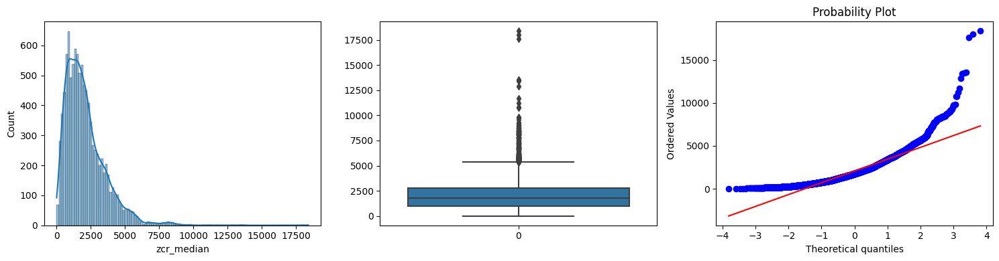

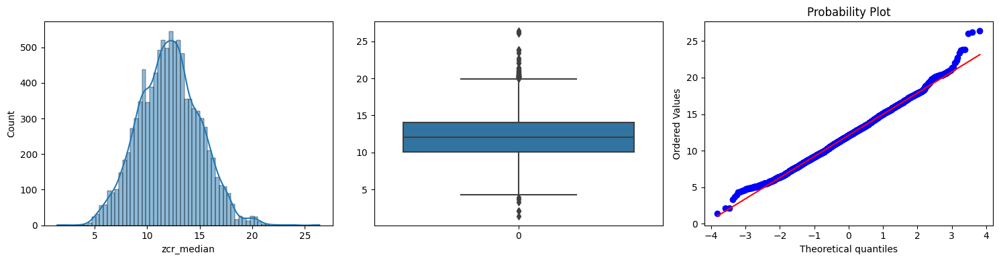

In [107]:
# Applyig Gaussian Transformation:
ZCR_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='zcr_median', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='zcr_median')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=ZCR_MEDIAN_TRANSFORMED).visualize_feature(feature='zcr_median')

In [108]:
# Counting Outliers:
ZCR_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('zcr_median')
ZCR_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=ZCR_MEDIAN_TRANSFORMED).count_outliers('zcr_median')
print(f'Number of outliers before Gaussian Transformation: {ZCR_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {ZCR_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {ZCR_MEDIAN_TRANSFORMED['zcr_median'].skew()}")
print(f'Number of missing values: {ZCR_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 315
Number of outliers after Gaussian Transformation: 73
Outlier Coefficient: 0.1441072311327366
Number of missing values: 0


In [109]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_ZCR_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='zcr_median', 
                                                                                               trans_method='cube_root')
X_TEST_ZCR_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='zcr_median', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_ZCR_MEDIAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_ZCR_MEDIAN_TRANSFORMED)

### 23. zcr_std:
- __Applied Method:__ cube_root:

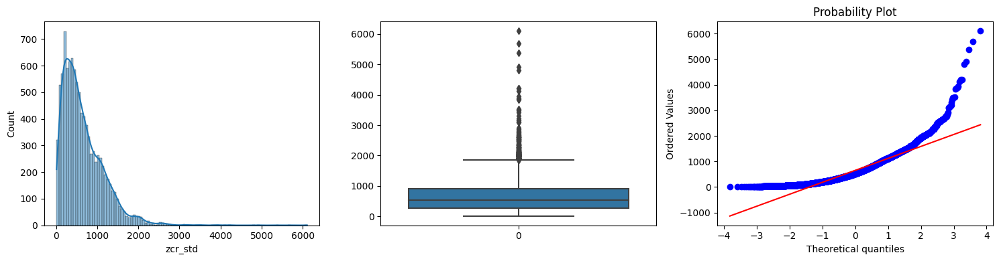

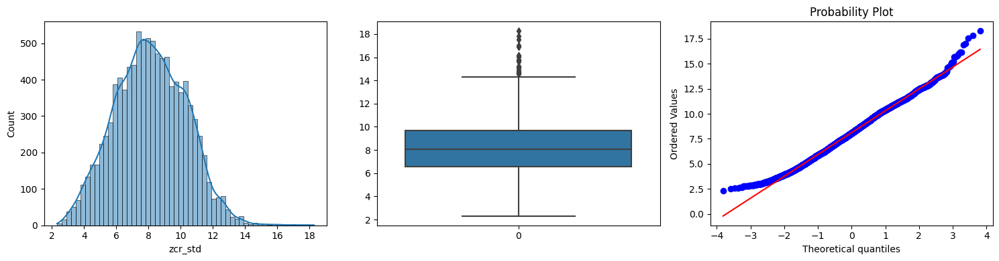

In [110]:
# Applyig Gaussian Transformation:
ZCR_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='zcr_std', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='zcr_std')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=ZCR_STD_TRANSFORMED).visualize_feature(feature='zcr_std')

In [111]:
# Counting Outliers:
ZCR_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('zcr_std')
ZCR_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=ZCR_STD_TRANSFORMED).count_outliers('zcr_std')
print(f'Number of outliers before Gaussian Transformation: {ZCR_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {ZCR_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {ZCR_STD_TRANSFORMED['zcr_std'].skew()}")
print(f'Number of missing values: {ZCR_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 266
Number of outliers after Gaussian Transformation: 23
Outlier Coefficient: 0.09385490970763614
Number of missing values: 0


In [112]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_ZCR_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='zcr_std', 
                                                                                               trans_method='cube_root')
X_TEST_ZCR_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='zcr_std', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_ZCR_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_ZCR_STD_TRANSFORMED)

### 24. peak_amplitude:
- __Applied Method:__ log:

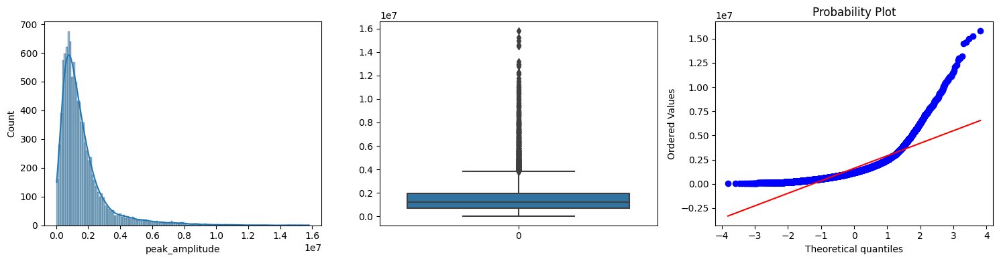

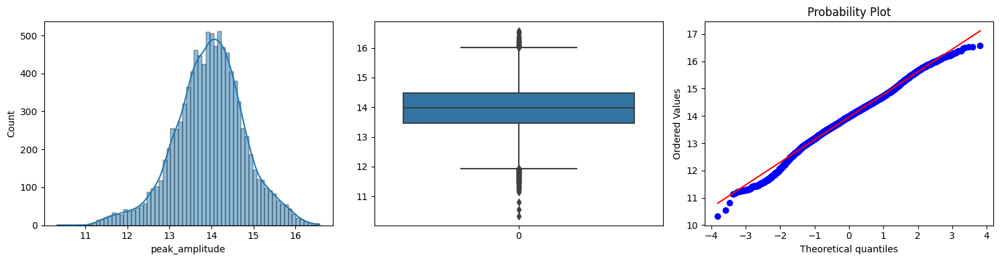

In [113]:
# Applyig Gaussian Transformation:
PEAK_AMP_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='peak_amplitude', 
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='peak_amplitude')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=PEAK_AMP_TRANSFORMED).visualize_feature(feature='peak_amplitude')

In [114]:
# Counting Outliers:
PEAK_AMP_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('peak_amplitude')
PEAK_AMP_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=PEAK_AMP_TRANSFORMED).count_outliers('peak_amplitude')
print(f'Number of outliers before Gaussian Transformation: {PEAK_AMP_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {PEAK_AMP_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {PEAK_AMP_TRANSFORMED['peak_amplitude'].skew()}")
print(f'Number of missing values: {PEAK_AMP_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 720
Number of outliers after Gaussian Transformation: 234
Outlier Coefficient: -0.21890123137006529
Number of missing values: 0


In [115]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_PEAK_AMP_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='peak_amplitude', 
                                                                                               trans_method='log')
X_TEST_PEAK_AMP_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='peak_amplitude', 
                                                                                             trans_method='log')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_PEAK_AMP_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_PEAK_AMP_TRANSFORMED)

### 25. peak_frequency:
- __Applied Method:__ log:

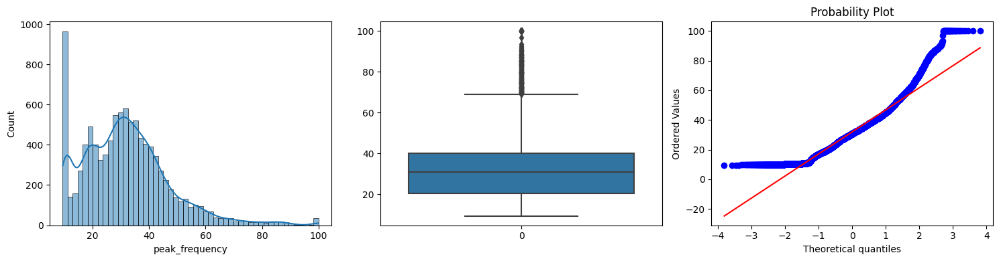

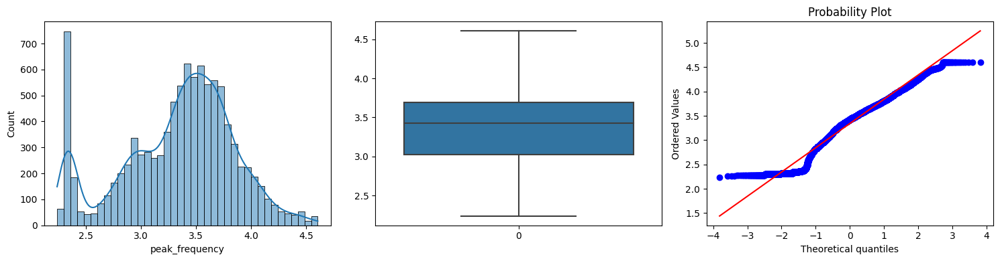

In [116]:
# Applyig Gaussian Transformation:
PEAK_FREQ_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='peak_frequency', 
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='peak_frequency')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=PEAK_FREQ_TRANSFORMED).visualize_feature(feature='peak_frequency')

In [117]:
# Counting Outliers:
PEAK_FREQ_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('peak_frequency')
PEAK_FREQ_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=PEAK_FREQ_TRANSFORMED).count_outliers('peak_frequency')
print(f'Number of outliers before Gaussian Transformation: {PEAK_FREQ_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {PEAK_FREQ_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {PEAK_FREQ_TRANSFORMED['peak_frequency'].skew()}")
print(f'Number of missing values: {PEAK_FREQ_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 250
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: -0.3995268710407533
Number of missing values: 0


In [118]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_PEAK_FREQ_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='peak_frequency', 
                                                                                               trans_method='log')
X_TEST_PEAK_FREQ_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='peak_frequency', 
                                                                                             trans_method='log')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_PEAK_FREQ_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_PEAK_FREQ_TRANSFORMED)

### 26. ber_max:
- __Applied Method:__ log:

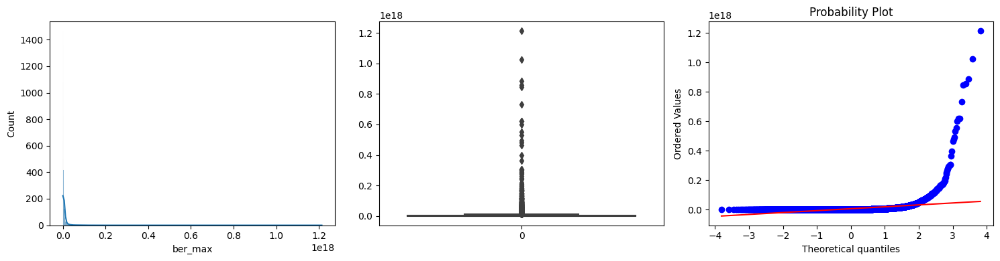

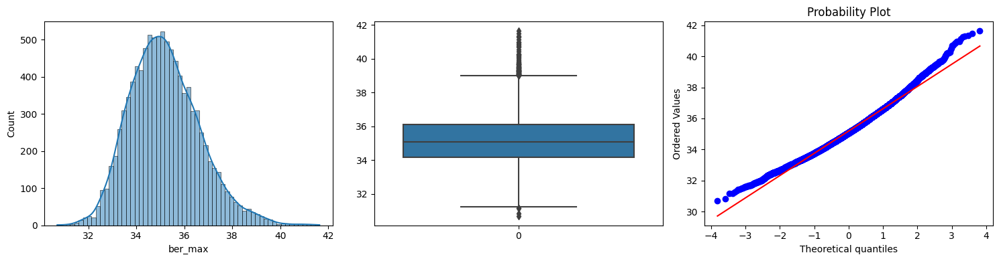

In [119]:
# Applyig Gaussian Transformation:
BER_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ber_max', 
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ber_max')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=BER_MAX_TRANSFORMED).visualize_feature(feature='ber_max')

In [120]:
# Counting Outliers:
BER_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ber_max')
BER_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=BER_MAX_TRANSFORMED).count_outliers('ber_max')
print(f'Number of outliers before Gaussian Transformation: {BER_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {BER_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {BER_MAX_TRANSFORMED['ber_max'].skew()}")
print(f'Number of missing values: {BER_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 1167
Number of outliers after Gaussian Transformation: 117
Outlier Coefficient: 0.4757473124158755
Number of missing values: 0


In [121]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_BER_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ber_max', 
                                                                                               trans_method='log')
X_TEST_BER_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ber_max', 
                                                                                             trans_method='log')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_BER_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_BER_MAX_TRANSFORMED)

### 27. ber_min:
- __Applied Method:__ log:

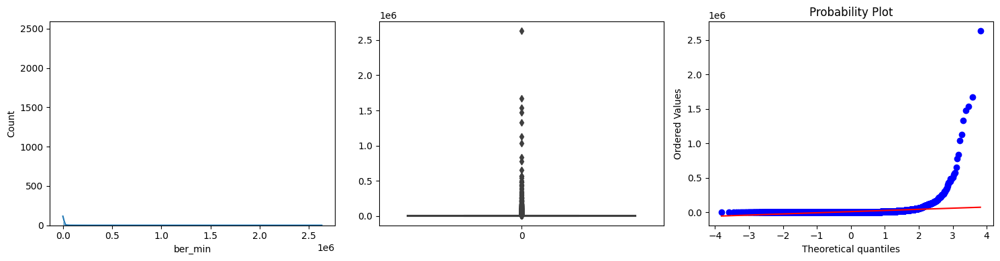

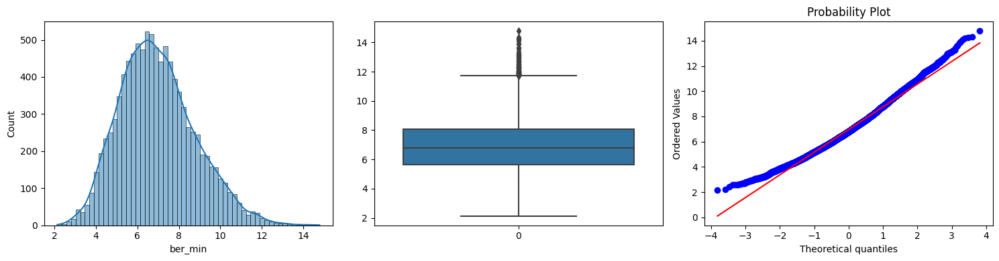

In [122]:
# Applyig Gaussian Transformation:
BER_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ber_min', 
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ber_min')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=BER_MIN_TRANSFORMED).visualize_feature(feature='ber_min')

In [123]:
# Counting Outliers:
BER_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ber_min')
BER_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=BER_MIN_TRANSFORMED).count_outliers('ber_min')
print(f'Number of outliers before Gaussian Transformation: {BER_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {BER_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {BER_MIN_TRANSFORMED['ber_min'].skew()}")
print(f'Number of missing values: {BER_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 1442
Number of outliers after Gaussian Transformation: 98
Outlier Coefficient: 0.45507003171574445
Number of missing values: 0


In [124]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_BER_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ber_min', 
                                                                                               trans_method='log')
X_TEST_BER_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ber_min', 
                                                                                             trans_method='log')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_BER_MIN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_BER_MIN_TRANSFORMED)

### 28. ber_mean:
- __Applied Method:__ log:

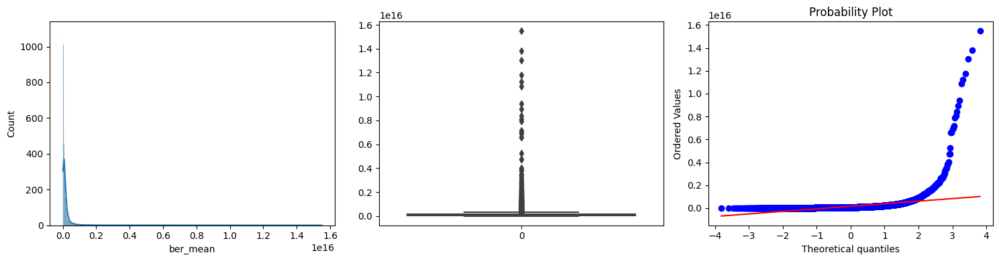

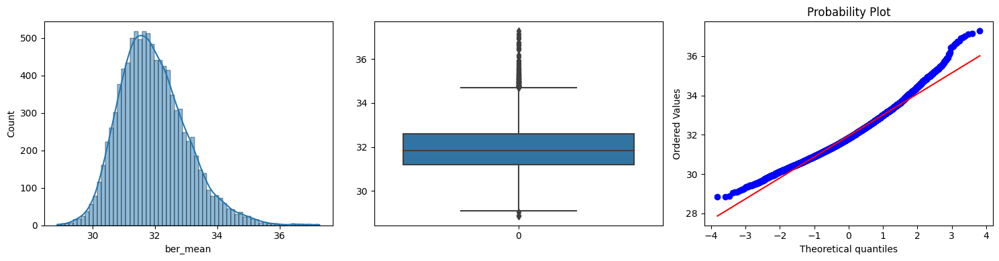

In [125]:
# Applyig Gaussian Transformation:
BER_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ber_mean', 
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ber_mean')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=BER_MEAN_TRANSFORMED).visualize_feature(feature='ber_mean')

In [126]:
# Counting Outliers:
BER_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ber_mean')
BER_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=BER_MEAN_TRANSFORMED).count_outliers('ber_mean')
print(f'Number of outliers before Gaussian Transformation: {BER_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {BER_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {BER_MEAN_TRANSFORMED['ber_mean'].skew()}")
print(f'Number of missing values: {BER_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 996
Number of outliers after Gaussian Transformation: 164
Outlier Coefficient: 0.6205550354370645
Number of missing values: 0


In [127]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_BER_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ber_mean', 
                                                                                               trans_method='log')
X_TEST_BER_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ber_mean', 
                                                                                             trans_method='log')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_BER_MEAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_BER_MEAN_TRANSFORMED)

### 29. ber_median:
- __Applied Method:__ log:

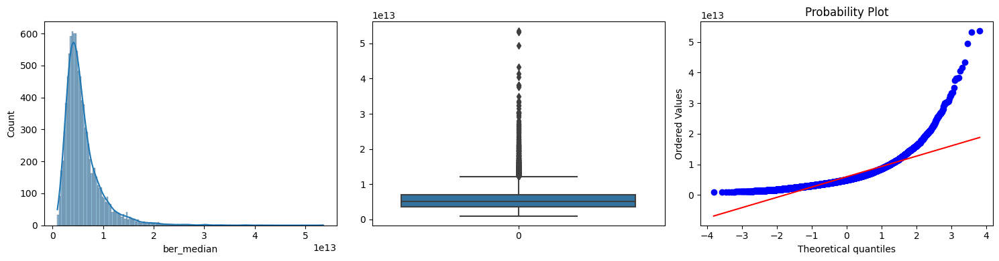

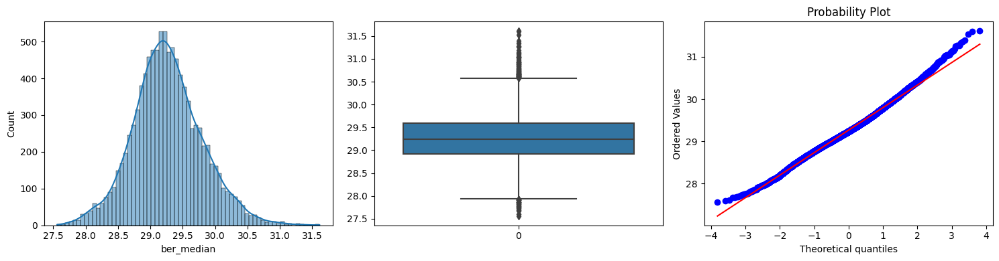

In [128]:
# Applyig Gaussian Transformation:
BER_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ber_median', 
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ber_median')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=BER_MEDIAN_TRANSFORMED).visualize_feature(feature='ber_median')

In [129]:
# Counting Outliers:
BER_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ber_median')
BER_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=BER_MEDIAN_TRANSFORMED).count_outliers('ber_median')
print(f'Number of outliers before Gaussian Transformation: {BER_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {BER_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {BER_MEDIAN_TRANSFORMED['ber_median'].skew()}")
print(f'Number of missing values: {BER_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 608
Number of outliers after Gaussian Transformation: 179
Outlier Coefficient: 0.2534971518495206
Number of missing values: 0


In [130]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_BER_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ber_median', 
                                                                                               trans_method='log')
X_TEST_BER_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ber_median', 
                                                                                             trans_method='log')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_BER_MEDIAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_BER_MEDIAN_TRANSFORMED)

### 30. ber_std:
- __Applied Method:__ log:

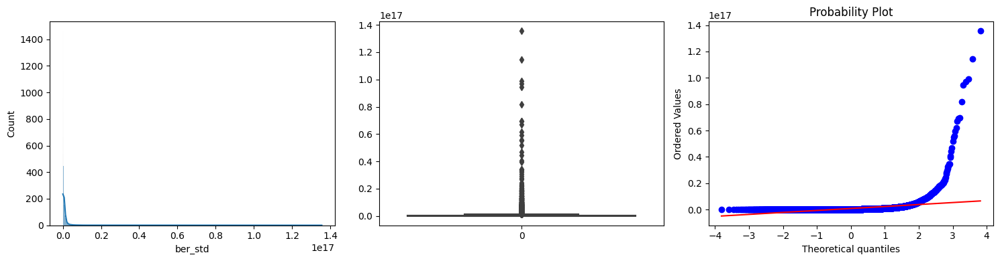

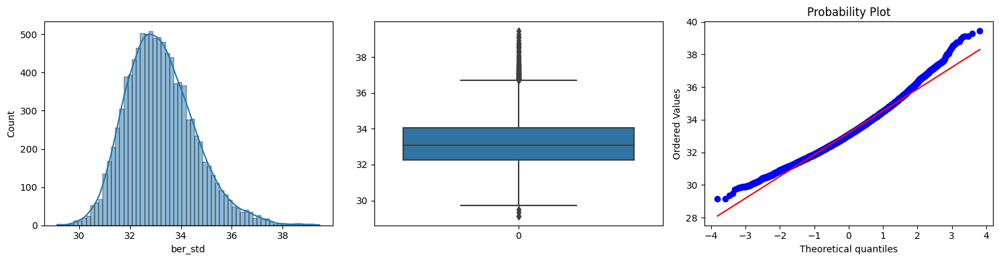

In [131]:
# Applyig Gaussian Transformation:
BER_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ber_std', 
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ber_std')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=BER_STD_TRANSFORMED).visualize_feature(feature='ber_std')

In [132]:
# Counting Outliers:
BER_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ber_std')
BER_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=BER_STD_TRANSFORMED).count_outliers('ber_std')
print(f'Number of outliers before Gaussian Transformation: {BER_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {BER_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {BER_STD_TRANSFORMED['ber_std'].skew()}")
print(f'Number of missing values: {BER_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 1139
Number of outliers after Gaussian Transformation: 138
Outlier Coefficient: 0.5464491144890784
Number of missing values: 0


In [133]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_BER_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ber_std', 
                                                                                               trans_method='log')
X_TEST_BER_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ber_std', 
                                                                                             trans_method='log')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_BER_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_BER_STD_TRANSFORMED)

### 31. sc_max:
- __Applied Method:__ log:

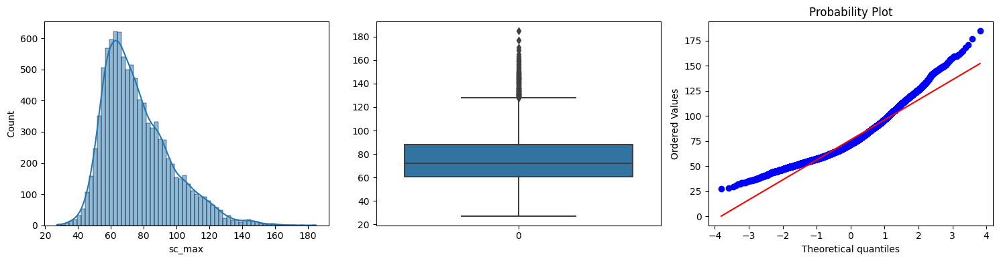

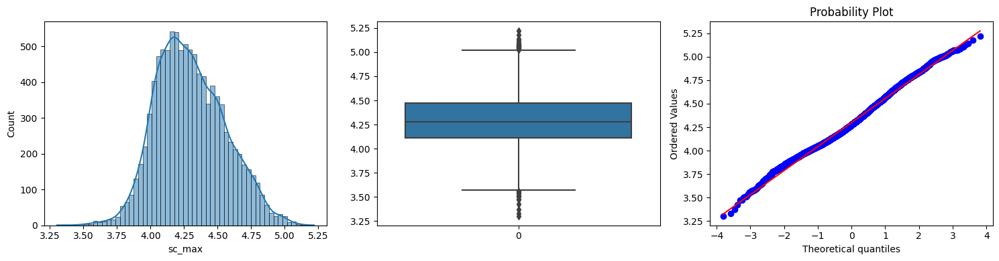

In [134]:
# Applyig Gaussian Transformation:
SC_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='sc_max', 
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='sc_max')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SC_MAX_TRANSFORMED).visualize_feature(feature='sc_max')

In [135]:
# Counting Outliers:
SC_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('sc_max')
SC_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SC_MAX_TRANSFORMED).count_outliers('sc_max')
print(f'Number of outliers before Gaussian Transformation: {SC_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SC_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SC_MAX_TRANSFORMED['sc_max'].skew()}")
print(f'Number of missing values: {SC_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 191
Number of outliers after Gaussian Transformation: 38
Outlier Coefficient: 0.28229791985326247
Number of missing values: 0


In [136]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_SC_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='sc_max', 
                                                                                               trans_method='log')
X_TEST_SC_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='sc_max', 
                                                                                             trans_method='log')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_SC_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_SC_MAX_TRANSFORMED)

### 32. sc_min:
- __Applied Method:__ No method:

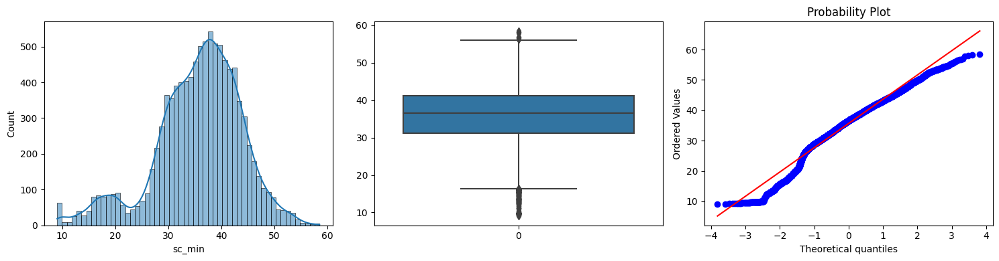

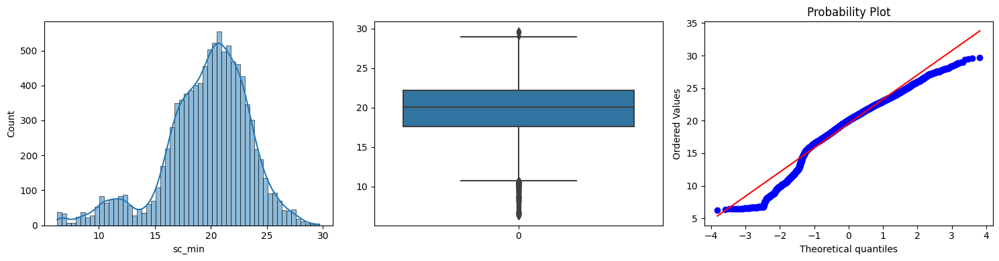

In [137]:
# Applyig Gaussian Transformation:
SC_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='sc_min', 
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='sc_min')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SC_MIN_TRANSFORMED).visualize_feature(feature='sc_min')

In [138]:
# Counting Outliers:
SC_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('sc_min')
SC_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SC_MIN_TRANSFORMED).count_outliers('sc_min')
print(f'Number of outliers before Gaussian Transformation: {SC_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SC_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SC_MIN_TRANSFORMED['sc_min'].skew()}")
print(f'Number of missing values: {SC_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 299
Number of outliers after Gaussian Transformation: 383
Outlier Coefficient: -0.8309448897423811
Number of missing values: 0


In [139]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['sc_min'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['sc_min'])

### 33. sc_mean:
- __Applied Method:__ No method:

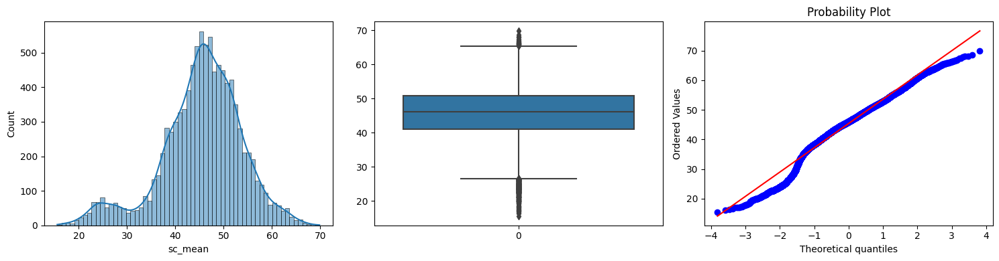

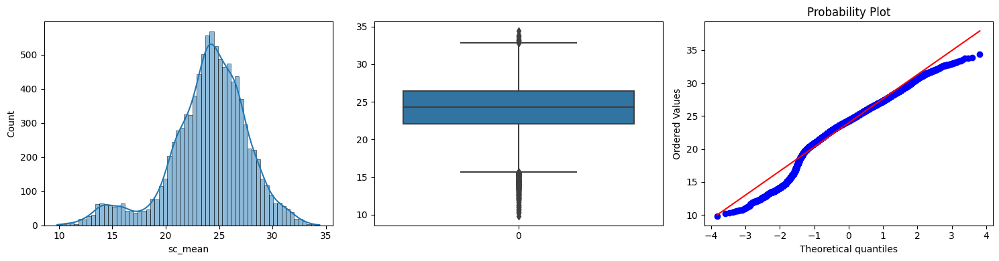

In [140]:
# Applyig Gaussian Transformation:
SC_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='sc_mean', 
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='sc_mean')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SC_MEAN_TRANSFORMED).visualize_feature(feature='sc_mean')

In [141]:
# Counting Outliers:
SC_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('sc_mean')
SC_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SC_MEAN_TRANSFORMED).count_outliers('sc_mean')
print(f'Number of outliers before Gaussian Transformation: {SC_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SC_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SC_MEAN_TRANSFORMED['sc_mean'].skew()}")
print(f'Number of missing values: {SC_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 445
Number of outliers after Gaussian Transformation: 479
Outlier Coefficient: -0.7462342143808789
Number of missing values: 0


In [142]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['sc_mean'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['sc_mean'])

### 34. sc_median:
- __Applied Method:__ No method:

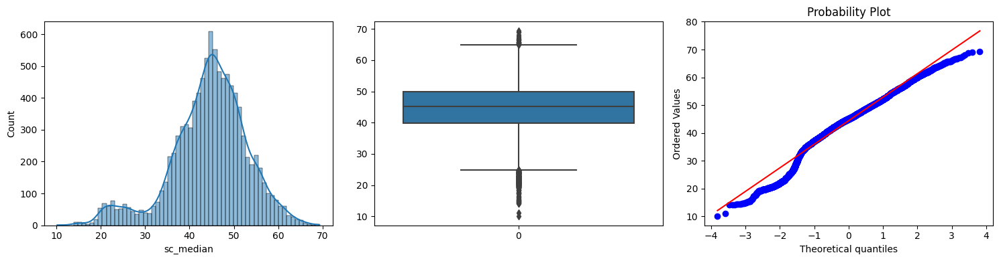

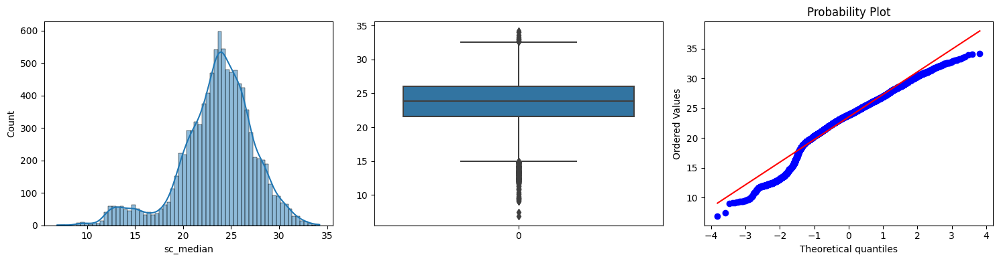

In [143]:
# Applyig Gaussian Transformation:
SC_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='sc_median', 
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='sc_median')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SC_MEDIAN_TRANSFORMED).visualize_feature(feature='sc_median')

In [144]:
# Counting Outliers:
SC_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('sc_median')
SC_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SC_MEDIAN_TRANSFORMED).count_outliers('sc_median')
print(f'Number of outliers before Gaussian Transformation: {SC_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SC_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SC_MEDIAN_TRANSFORMED['sc_median'].skew()}")
print(f'Number of missing values: {SC_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 445
Number of outliers after Gaussian Transformation: 489
Outlier Coefficient: -0.773219164583151
Number of missing values: 0


In [145]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['sc_median'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['sc_median'])

### 35. sc_std:
- __Applied Method:__ log:

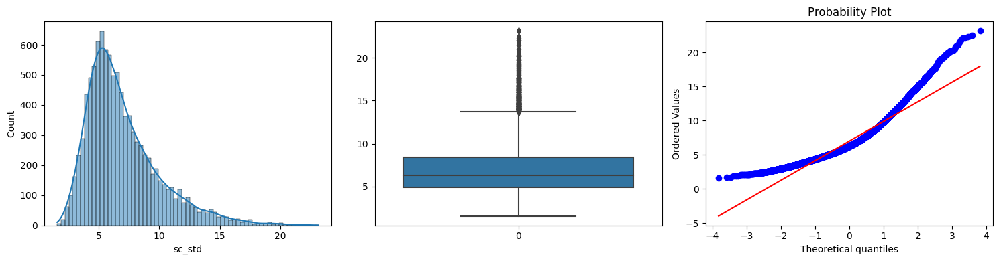

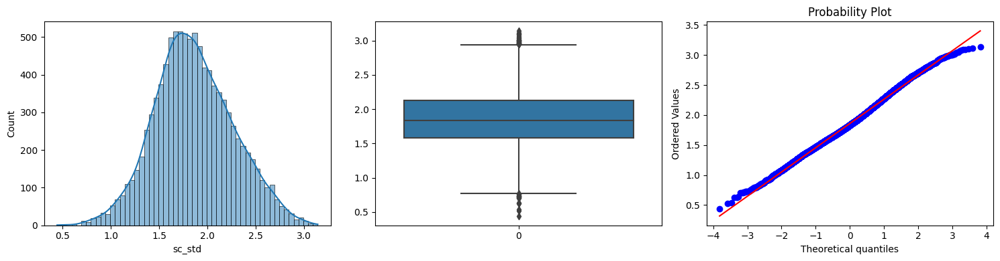

In [146]:
# Applyig Gaussian Transformation:
SC_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='sc_std', 
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='sc_std')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SC_STD_TRANSFORMED).visualize_feature(feature='sc_std')

In [147]:
# Counting Outliers:
SC_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('sc_std')
SC_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SC_STD_TRANSFORMED).count_outliers('sc_std')
print(f'Number of outliers before Gaussian Transformation: {SC_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SC_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SC_STD_TRANSFORMED['sc_std'].skew()}")
print(f'Number of missing values: {SC_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 404
Number of outliers after Gaussian Transformation: 61
Outlier Coefficient: 0.16610828905034733
Number of missing values: 0


In [148]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_SC_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='sc_std', 
                                                                                               trans_method='log')
X_TEST_SC_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='sc_std', 
                                                                                             trans_method='log')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_SC_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_SC_STD_TRANSFORMED)

### 36. sb_max:
- __Applied Method:__ Does not require:

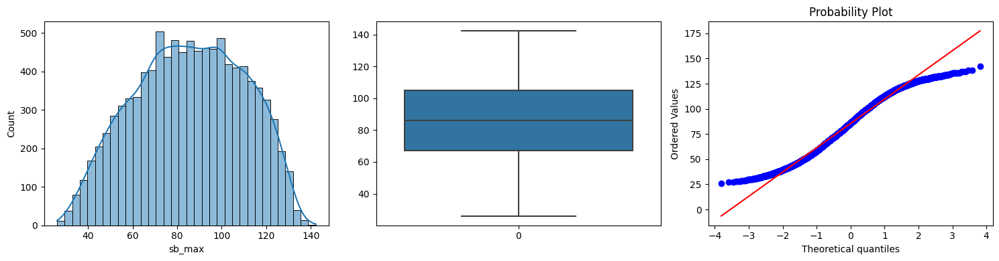

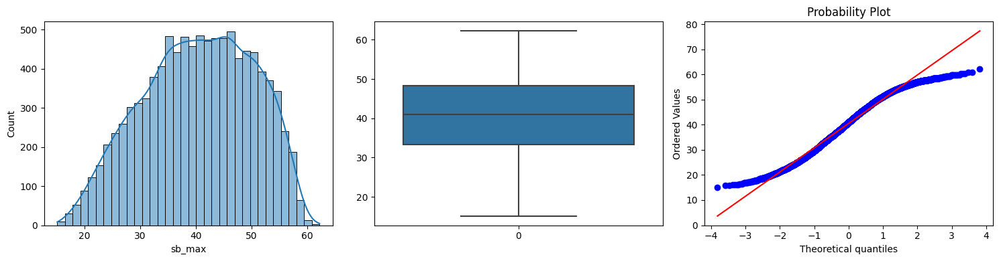

In [149]:
# Applyig Gaussian Transformation:
SB_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='sb_max', 
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='sb_max')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SB_MAX_TRANSFORMED).visualize_feature(feature='sb_max')

In [150]:
# Counting Outliers:
SB_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('sb_max')
SB_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SB_MAX_TRANSFORMED).count_outliers('sb_max')
print(f'Number of outliers before Gaussian Transformation: {SB_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SB_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SB_MAX_TRANSFORMED['sb_max'].skew()}")
print(f'Number of missing values: {SB_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 0
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: -0.19455259626562288
Number of missing values: 0


In [151]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['sb_max'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['sb_max'])

### 37. sb_min:
- __Applied Method:__ No mehtod:

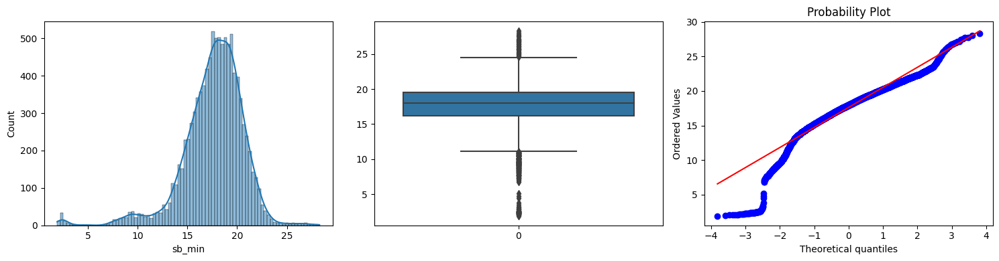

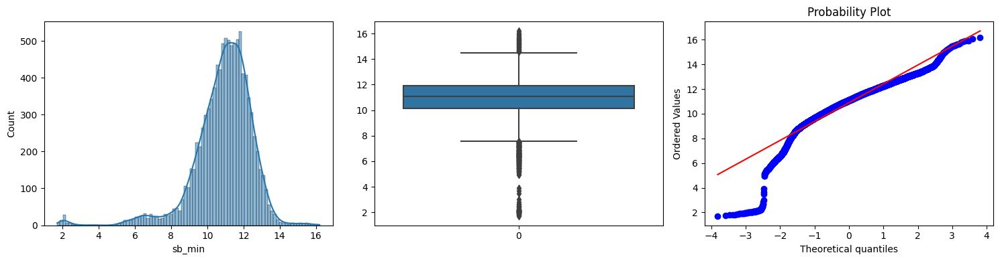

In [152]:
# Applyig Gaussian Transformation:
SB_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='sb_min', 
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='sb_min')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SB_MIN_TRANSFORMED).visualize_feature(feature='sb_min')

In [153]:
# Counting Outliers:
SB_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('sb_min')
SB_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SB_MIN_TRANSFORMED).count_outliers('sb_min')
print(f'Number of outliers before Gaussian Transformation: {SB_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SB_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SB_MIN_TRANSFORMED['sb_min'].skew()}")
print(f'Number of missing values: {SB_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 403
Number of outliers after Gaussian Transformation: 418
Outlier Coefficient: -1.5886850370912091
Number of missing values: 0


In [154]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['sb_min'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['sb_min'])

### 38. sb_mean:
- __Applied Method:__ No method:

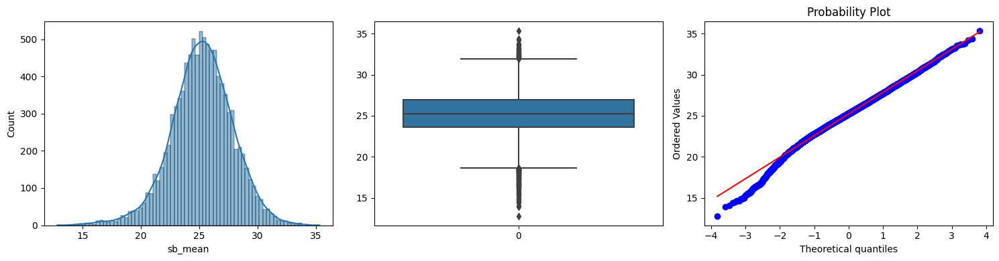

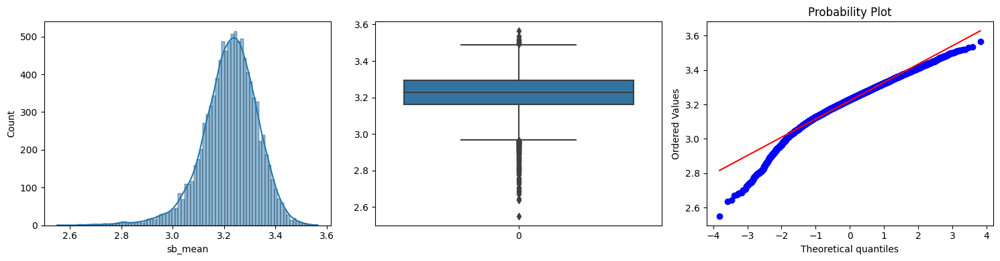

In [155]:
# Applyig Gaussian Transformation:
SB_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='sb_mean', 
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='sb_mean')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SB_MEAN_TRANSFORMED).visualize_feature(feature='sb_mean')

In [156]:
# Counting Outliers:
SB_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('sb_mean')
SB_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SB_MEAN_TRANSFORMED).count_outliers('sb_mean')
print(f'Number of outliers before Gaussian Transformation: {SB_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SB_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SB_MEAN_TRANSFORMED['sb_mean'].skew()}")
print(f'Number of missing values: {SB_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 192
Number of outliers after Gaussian Transformation: 244
Outlier Coefficient: -0.751945861208577
Number of missing values: 0


In [157]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['sb_mean'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['sb_mean'])

### 39. sb_median:
- __Applied Method:__ No method:

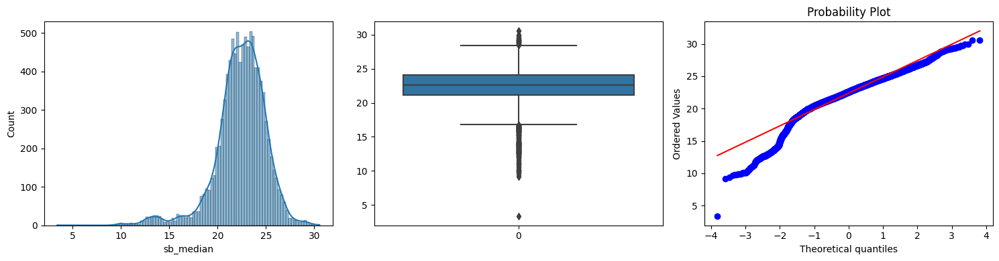

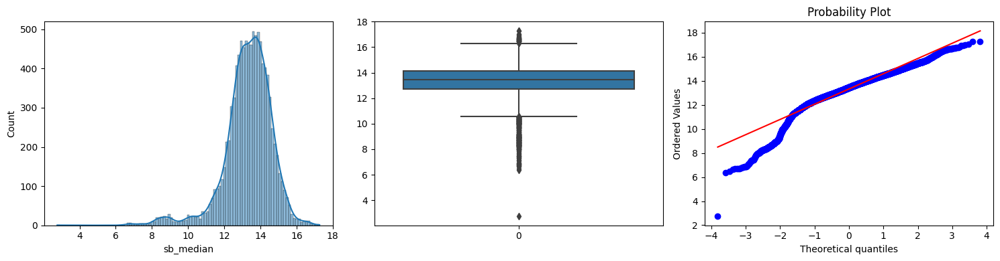

In [158]:
# Applyig Gaussian Transformation:
SB_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='sb_median', 
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='sb_median')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SB_MEDIAN_TRANSFORMED).visualize_feature(feature='sb_median')

In [159]:
# Counting Outliers:
SB_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('sb_median')
SB_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SB_MEDIAN_TRANSFORMED).count_outliers('sb_median')
print(f'Number of outliers before Gaussian Transformation: {SB_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SB_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SB_MEDIAN_TRANSFORMED['sb_median'].skew()}")
print(f'Number of missing values: {SB_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 412
Number of outliers after Gaussian Transformation: 422
Outlier Coefficient: -1.2780820581253094
Number of missing values: 0


In [160]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['sb_median'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['sb_median'])

### 40. sb_std:
- __Applied Method:__ square_root:

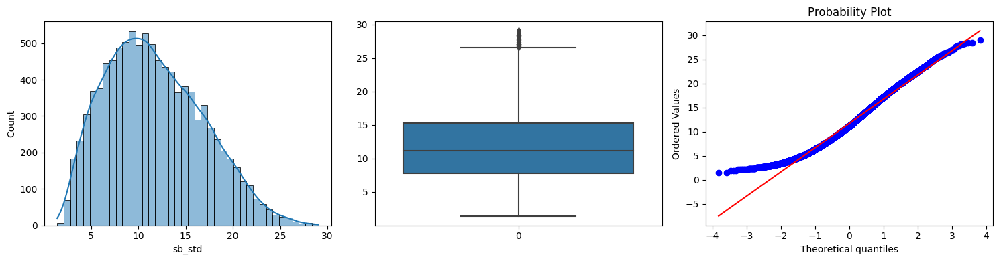

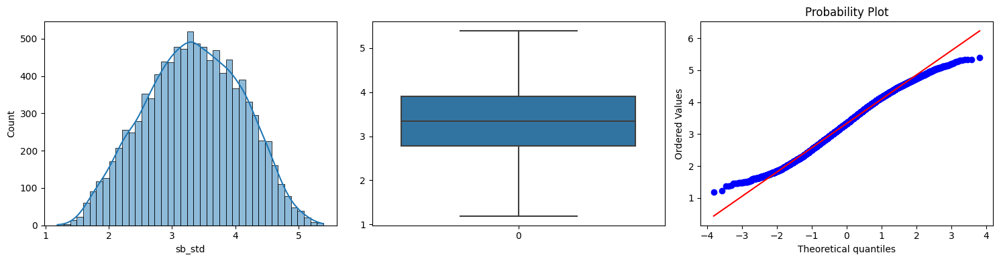

In [161]:
# Applyig Gaussian Transformation:
SB_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='sb_std', 
                                                                                       trans_method='square_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='sb_std')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SB_STD_TRANSFORMED).visualize_feature(feature='sb_std')

In [162]:
# Counting Outliers:
SB_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('sb_std')
SB_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SB_STD_TRANSFORMED).count_outliers('sb_std')
print(f'Number of outliers before Gaussian Transformation: {SB_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SB_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SB_STD_TRANSFORMED['sb_std'].skew()}")
print(f'Number of missing values: {SB_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 18
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: -0.060260793028291584
Number of missing values: 0


In [163]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_SB_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='sb_std', 
                                                                                               trans_method='square_root')
X_TEST_SB_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='sb_std', 
                                                                                             trans_method='square_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_SB_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_SB_STD_TRANSFORMED)

### 41. mfcc_max:
- __Applied Method:__ No method:

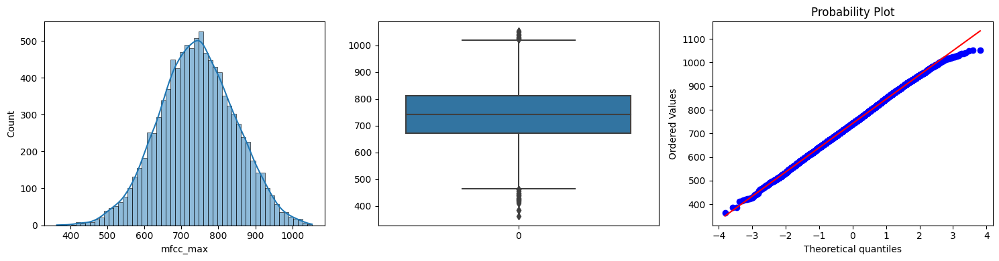

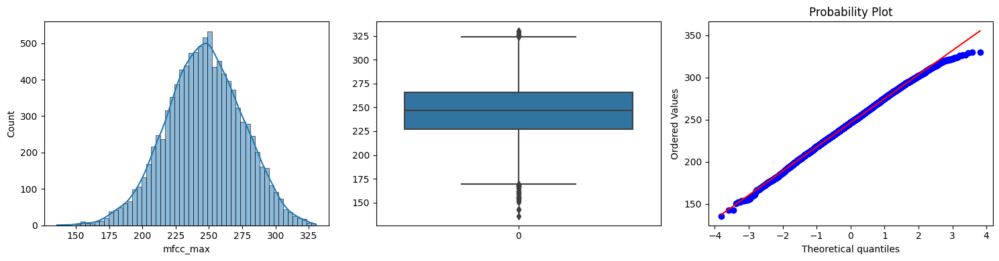

In [164]:
# Applyig Gaussian Transformation:
MFCC_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='mfcc_max', 
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='mfcc_max')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=MFCC_MAX_TRANSFORMED).visualize_feature(feature='mfcc_max')

In [165]:
# Counting Outliers:
MFCC_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('mfcc_max')
MFCC_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=MFCC_MAX_TRANSFORMED).count_outliers('mfcc_max')
print(f'Number of outliers before Gaussian Transformation: {MFCC_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {MFCC_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {MFCC_MAX_TRANSFORMED['mfcc_max'].skew()}")
print(f'Number of missing values: {MFCC_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 45
Number of outliers after Gaussian Transformation: 50
Outlier Coefficient: -0.09230876403236286
Number of missing values: 0


In [166]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_MFCC_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='mfcc_max', 
                                                                                               trans_method='exponential')
X_TEST_MFCC_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='mfcc_max', 
                                                                                             trans_method='exponential')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_MFCC_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_MFCC_MAX_TRANSFORMED)

### 42. mfcc_min:
__Applied Method:__ No method

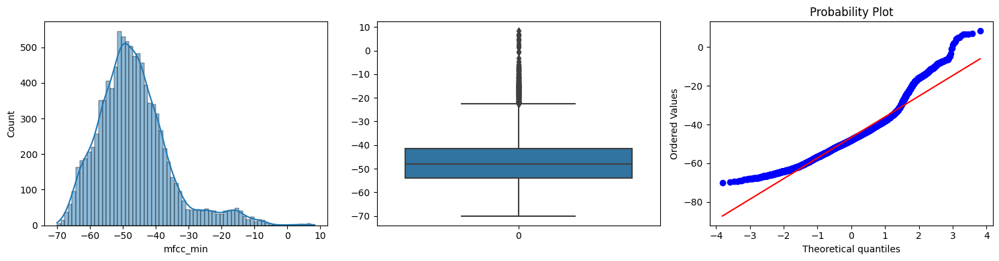

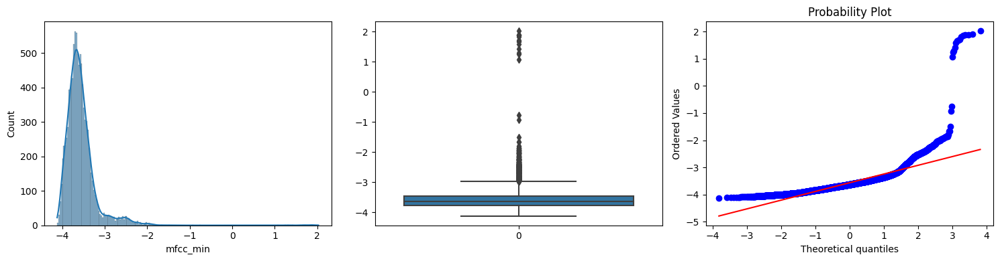

In [167]:
# Applyig Gaussian Transformation:
MFCC_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='mfcc_min', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='mfcc_min')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=MFCC_MIN_TRANSFORMED).visualize_feature(feature='mfcc_min')

In [168]:
# Counting Outliers:
MFCC_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('mfcc_min')
MFCC_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=MFCC_MIN_TRANSFORMED).count_outliers('mfcc_min')
print(f'Number of outliers before Gaussian Transformation: {MFCC_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {MFCC_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {MFCC_MIN_TRANSFORMED['mfcc_min'].skew()}")
print(f'Number of missing values: {MFCC_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 439
Number of outliers after Gaussian Transformation: 584
Outlier Coefficient: 4.806187784239767
Number of missing values: 0


In [169]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['mfcc_min'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['mfcc_min'])

### 43. mfcc_mean:
- __Applied Method:__ log:

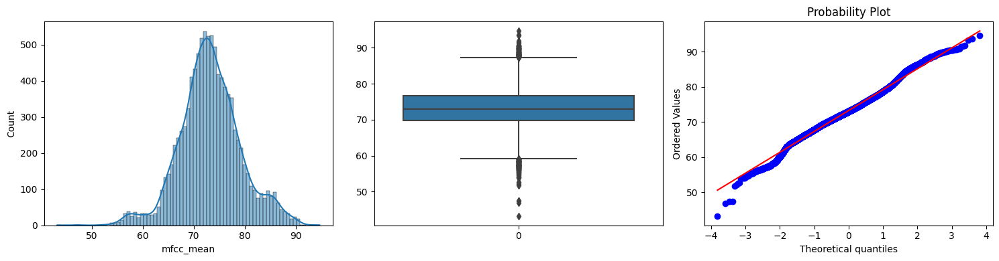

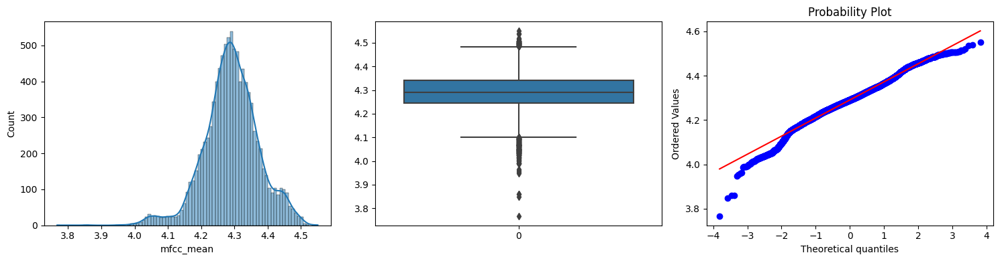

In [170]:
# Applyig Gaussian Transformation:
MFCC_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='mfcc_mean', 
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='mfcc_mean')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=MFCC_MEAN_TRANSFORMED).visualize_feature(feature='mfcc_mean')

In [171]:
# Counting Outliers:
MFCC_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('mfcc_mean')
MFCC_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=MFCC_MEAN_TRANSFORMED).count_outliers('mfcc_mean')
print(f'Number of outliers before Gaussian Transformation: {MFCC_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {MFCC_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {MFCC_MEAN_TRANSFORMED['mfcc_mean'].skew()}")
print(f'Number of missing values: {MFCC_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 336
Number of outliers after Gaussian Transformation: 315
Outlier Coefficient: -0.31661452591435296
Number of missing values: 0


In [172]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_MFCC_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='mfcc_mean', 
                                                                                               trans_method='square_root')
X_TEST_MFCC_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='mfcc_mean', 
                                                                                             trans_method='square_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_MFCC_MEAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_MFCC_MEAN_TRANSFORMED)

### 44. mfcc_median:
- __Applied Method:__ square_root:

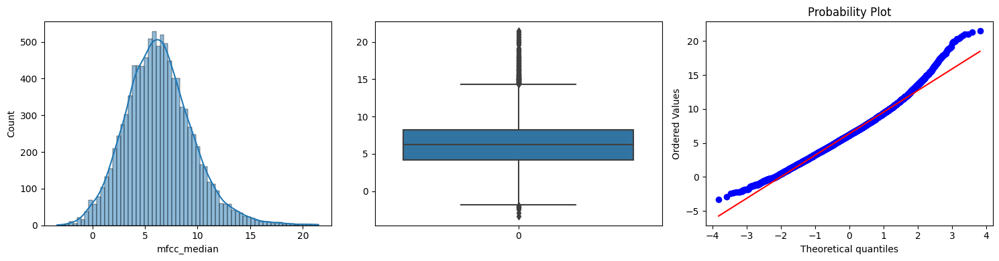

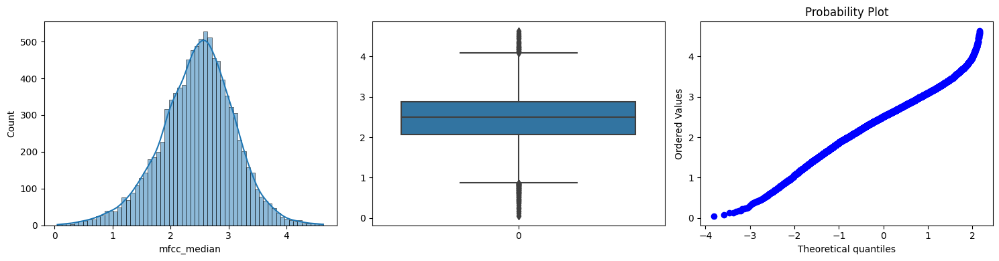

In [173]:
# Applyig Gaussian Transformation:
MFCC_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='mfcc_median', 
                                                                                       trans_method='square_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='mfcc_median')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=MFCC_MEDIAN_TRANSFORMED).visualize_feature(feature='mfcc_median')

In [176]:
# Counting Outliers:
MFCC_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('mfcc_median')
MFCC_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=MFCC_MEDIAN_TRANSFORMED).count_outliers('mfcc_median')
print(f'Number of outliers before Gaussian Transformation: {MFCC_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {MFCC_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {MFCC_MEDIAN_TRANSFORMED['mfcc_median'].skew()}")
print(f'Number of missing values: {MFCC_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 167
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: -0.2705538027982593
Number of missing values: 154


In [177]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['mfcc_median'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['mfcc_median'])

### 45. mfcc_std:
- __Applied Method:__ No method:

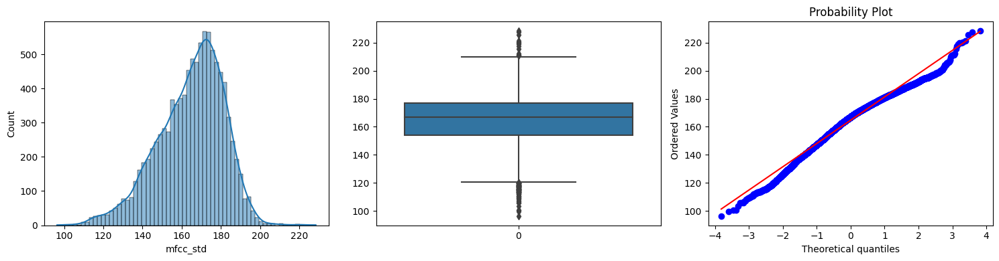

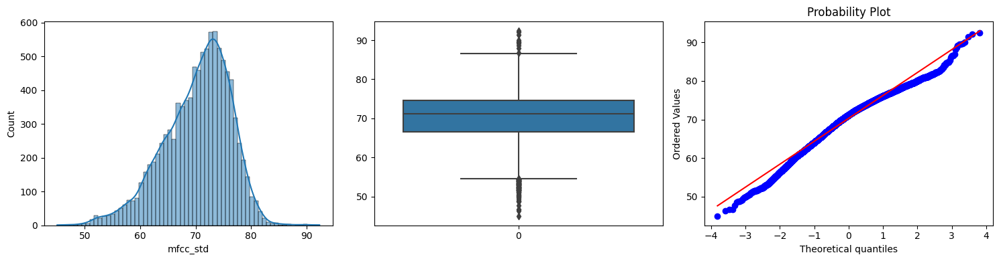

In [178]:
# Applyig Gaussian Transformation:
MFCC_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='mfcc_std', 
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='mfcc_std')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=MFCC_STD_TRANSFORMED).visualize_feature(feature='mfcc_std')

In [179]:
# Counting Outliers:
MFCC_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('mfcc_std')
MFCC_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=MFCC_STD_TRANSFORMED).count_outliers('mfcc_std')
print(f'Number of outliers before Gaussian Transformation: {MFCC_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {MFCC_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {MFCC_STD_TRANSFORMED['mfcc_std'].skew()}")
print(f'Number of missing values: {MFCC_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 139
Number of outliers after Gaussian Transformation: 152
Outlier Coefficient: -0.5943481267205707
Number of missing values: 0


In [180]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_MFCC_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='mfcc_std', 
                                                                                               trans_method='square_root')
X_TEST_MFCC_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='mfcc_std', 
                                                                                             trans_method='square_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_MFCC_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_MFCC_STD_TRANSFORMED)

### 46. delta_1_max:
- __Applied Method:__ square_root
- There is only one NaN value to be handled by replacing it with the median.

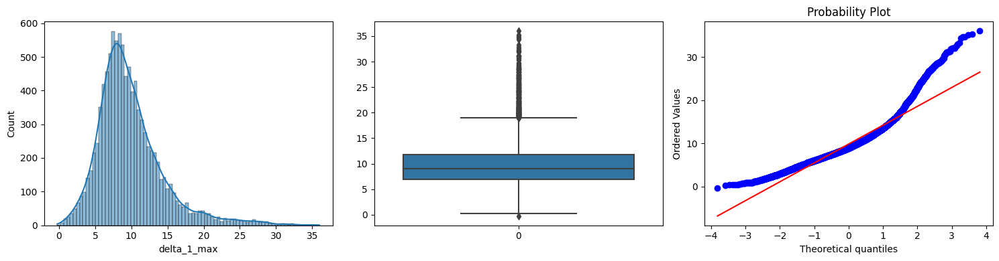

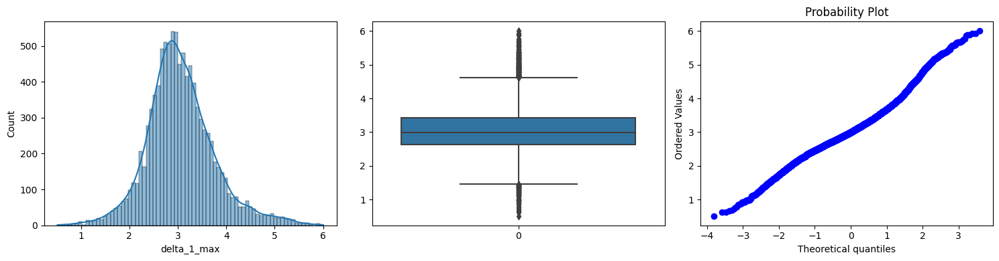

In [181]:
# Applyig Gaussian Transformation:
DELTA_1_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='delta_1_max', 
                                                                                       trans_method='square_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='delta_1_max')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_1_MAX_TRANSFORMED).visualize_feature(feature='delta_1_max')

In [182]:
# Counting Outliers:
DELTA_1_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('delta_1_max')
DELTA_1_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_1_MAX_TRANSFORMED).count_outliers('delta_1_max')
print(f'Number of outliers before Gaussian Transformation: {DELTA_1_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_1_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_1_MAX_TRANSFORMED['delta_1_max'].skew()}")
print(f'Number of missing values: {DELTA_1_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 490
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: 0.5099465013690913
Number of missing values: 1


In [183]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DELTA_1_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='delta_1_max', 
                                                                                               trans_method='square_root')
X_TEST_DELTA_1_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='delta_1_max', 
                                                                                             trans_method='square_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DELTA_1_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DELTA_1_MAX_TRANSFORMED)

### 47. delta_1_min:
- __Applied Method:__ cube_root:

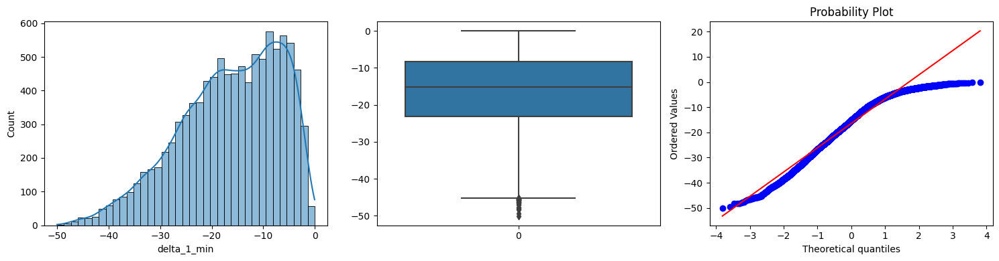

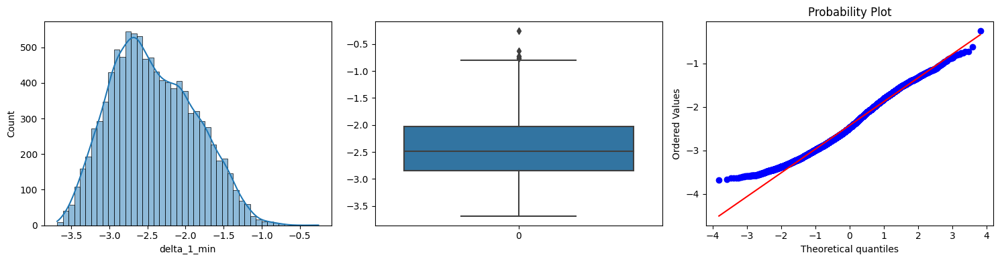

In [184]:
# Applyig Gaussian Transformation:
DELTA_1_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='delta_1_min', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='delta_1_min')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_1_MIN_TRANSFORMED).visualize_feature(feature='delta_1_min')

In [185]:
# Counting Outliers:
DELTA_1_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('delta_1_min')
DELTA_1_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_1_MIN_TRANSFORMED).count_outliers('delta_1_min')
print(f'Number of outliers before Gaussian Transformation: {DELTA_1_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_1_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_1_MIN_TRANSFORMED['delta_1_min'].skew()}")
print(f'Number of missing values: {DELTA_1_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 39
Number of outliers after Gaussian Transformation: 6
Outlier Coefficient: 0.2716864380867025
Number of missing values: 0


In [186]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DELTA_1_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='delta_1_min', 
                                                                                               trans_method='cube_root')
X_TEST_DELTA_1_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='delta_1_min', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DELTA_1_MIN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DELTA_1_MIN_TRANSFORMED)

### 48. delta_1_mean:
- __Applied Method:__ cube_root:

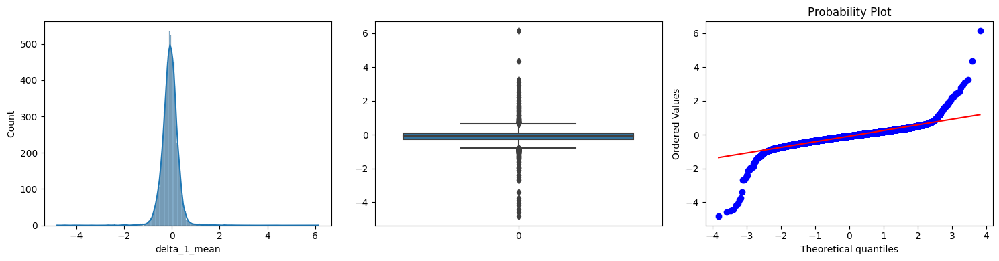

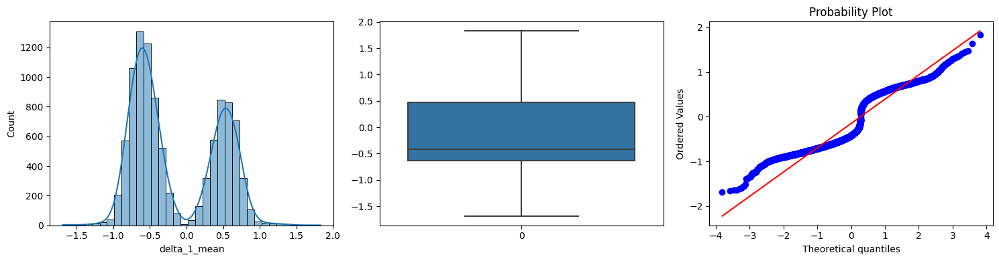

In [187]:
# Applyig Gaussian Transformation:
DELTA_1_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='delta_1_mean', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='delta_1_mean')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_1_MEAN_TRANSFORMED).visualize_feature(feature='delta_1_mean')

In [188]:
# Counting Outliers:
DELTA_1_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('delta_1_mean')
DELTA_1_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_1_MEAN_TRANSFORMED).count_outliers('delta_1_mean')
print(f'Number of outliers before Gaussian Transformation: {DELTA_1_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_1_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_1_MEAN_TRANSFORMED['delta_1_mean'].skew()}")
print(f'Number of missing values: {DELTA_1_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 285
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: 0.37865139395670405
Number of missing values: 0


In [189]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DELTA_1_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='delta_1_mean', 
                                                                                               trans_method='cube_root')
X_TEST_DELTA_1_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='delta_1_mean', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DELTA_1_MEAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DELTA_1_MEAN_TRANSFORMED)

### 49. delta_1_median:
- __Applied Method:__ cube_root:

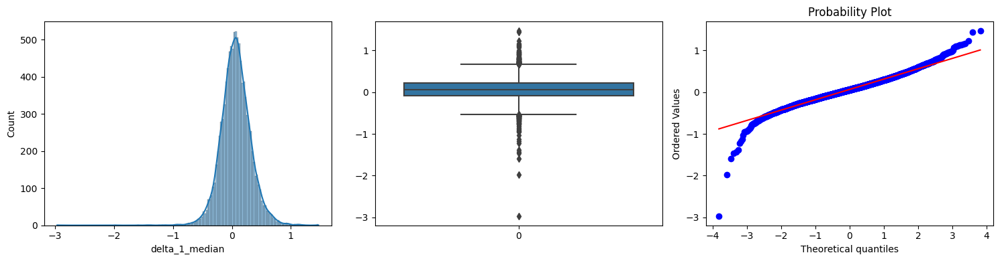

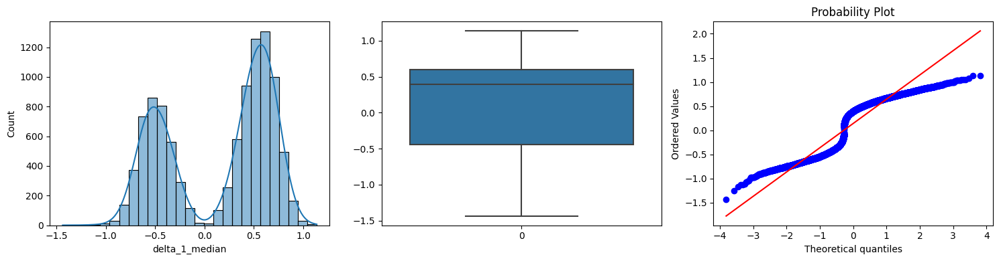

In [190]:
# Applyig Gaussian Transformation:
DELTA_1_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='delta_1_median', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='delta_1_median')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_1_MEDIAN_TRANSFORMED).visualize_feature(feature='delta_1_median')

In [191]:
# Counting Outliers:
DELTA_1_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('delta_1_median')
DELTA_1_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_1_MEDIAN_TRANSFORMED).count_outliers('delta_1_median')
print(f'Number of outliers before Gaussian Transformation: {DELTA_1_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_1_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_1_MEDIAN_TRANSFORMED['delta_1_median'].skew()}")
print(f'Number of missing values: {DELTA_1_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 238
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: -0.3826726642133164
Number of missing values: 0


In [192]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DELTA_1_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='delta_1_median', 
                                                                                               trans_method='cube_root')
X_TEST_DELTA_1_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='delta_1_median', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DELTA_1_MEDIAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DELTA_1_MEDIAN_TRANSFORMED)

### 50. delta_1_std:
- __Applied Method:__ square_root:

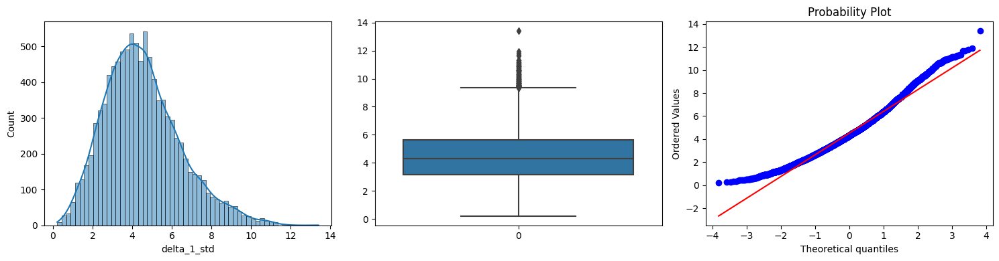

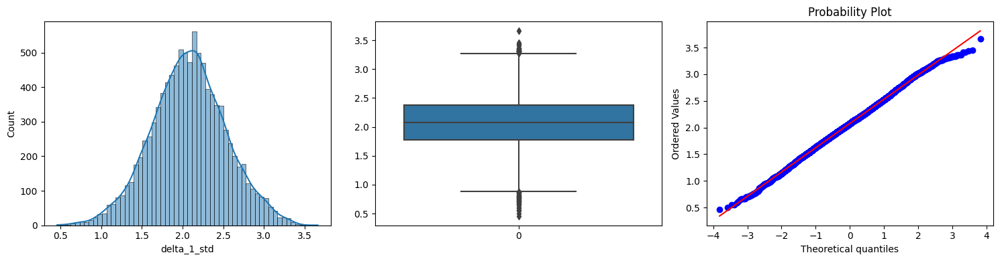

In [193]:
# Applyig Gaussian Transformation:
DELTA_1_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='delta_1_std', 
                                                                                       trans_method='square_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='delta_1_std')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_1_STD_TRANSFORMED).visualize_feature(feature='delta_1_std')

In [194]:
# Counting Outliers:
DELTA_1_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('delta_1_std')
DELTA_1_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_1_STD_TRANSFORMED).count_outliers('delta_1_std')
print(f'Number of outliers before Gaussian Transformation: {DELTA_1_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_1_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_1_STD_TRANSFORMED['delta_1_std'].skew()}")
print(f'Number of missing values: {DELTA_1_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 172
Number of outliers after Gaussian Transformation: 80
Outlier Coefficient: -0.010460525622782662
Number of missing values: 0


In [195]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DELTA_1_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='delta_1_std', 
                                                                                               trans_method='square_root')
X_TEST_DELTA_1_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='delta_1_std', 
                                                                                             trans_method='square_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DELTA_1_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DELTA_1_STD_TRANSFORMED)

### 51. delta_2_max:
- __Applied Method:__ exponential:

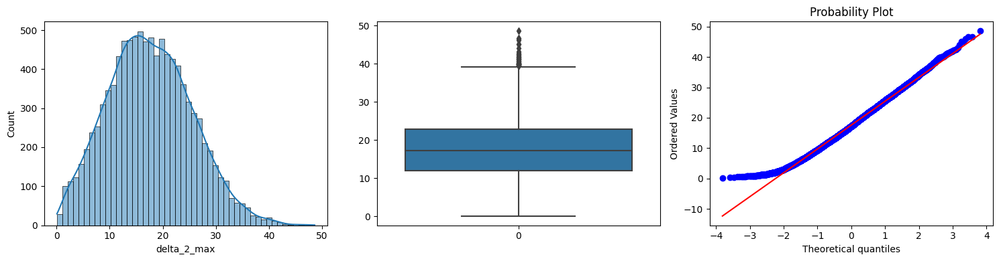

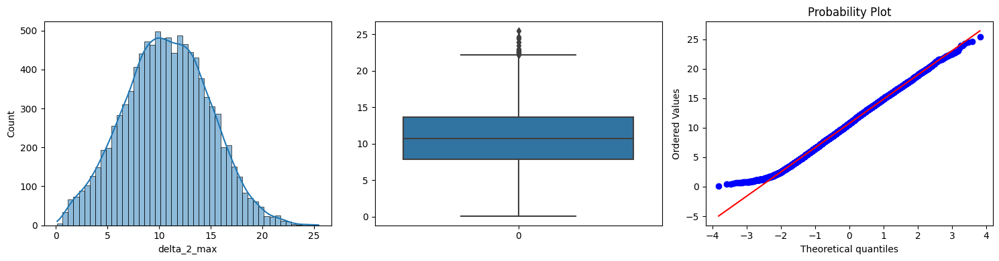

In [196]:
# Applyig Gaussian Transformation:
DELTA_2_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='delta_2_max', 
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='delta_2_max')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_2_MAX_TRANSFORMED).visualize_feature(feature='delta_2_max')

In [197]:
# Counting Outliers:
DELTA_2_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('delta_2_max')
DELTA_2_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_2_MAX_TRANSFORMED).count_outliers('delta_2_max')
print(f'Number of outliers before Gaussian Transformation: {DELTA_2_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_2_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_2_MAX_TRANSFORMED['delta_2_max'].skew()}")
print(f'Number of missing values: {DELTA_2_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 52
Number of outliers after Gaussian Transformation: 22
Outlier Coefficient: 0.0398660657919734
Number of missing values: 0


In [198]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DELTA_2_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='delta_2_max', 
                                                                                               trans_method='exponential')
X_TEST_DELTA_2_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='delta_2_max', 
                                                                                             trans_method='exponential')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DELTA_2_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DELTA_2_MAX_TRANSFORMED)

### 52. delta_2_min:
- __Applied Method:__ No method:

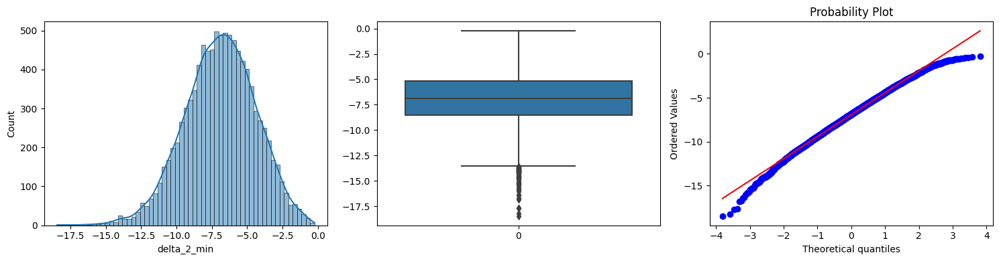

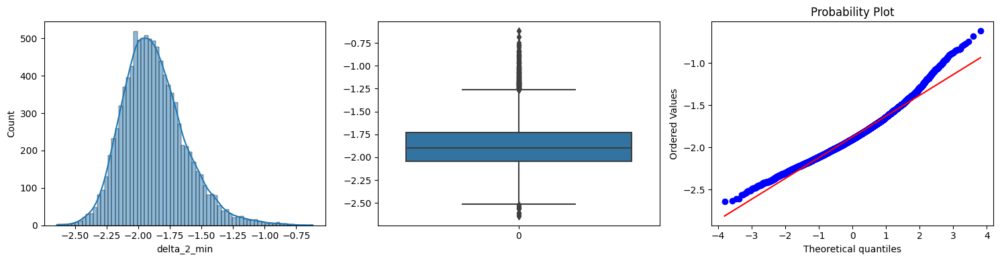

In [199]:
# Applyig Gaussian Transformation:
DELTA_2_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='delta_2_min', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='delta_2_min')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_2_MIN_TRANSFORMED).visualize_feature(feature='delta_2_min')

In [200]:
# Counting Outliers:
DELTA_2_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('delta_2_min')
DELTA_2_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_2_MIN_TRANSFORMED).count_outliers('delta_2_min')
print(f'Number of outliers before Gaussian Transformation: {DELTA_2_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_2_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_2_MIN_TRANSFORMED['delta_2_min'].skew()}")
print(f'Number of missing values: {DELTA_2_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 81
Number of outliers after Gaussian Transformation: 195
Outlier Coefficient: 0.6550428937809439
Number of missing values: 0


In [201]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['delta_2_min'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['delta_2_min'])

### 53. delta_2_mean:
- __Applied Method:__ No method:

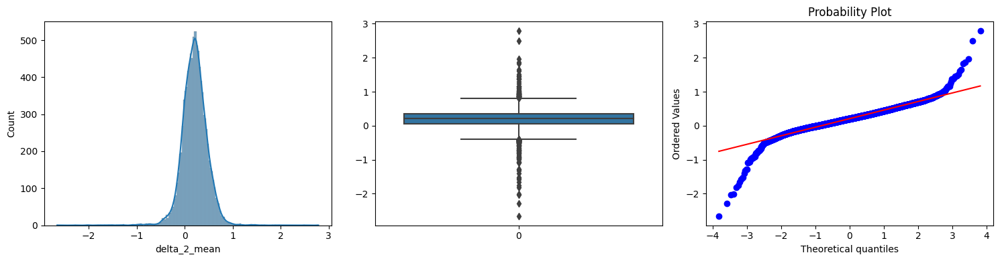

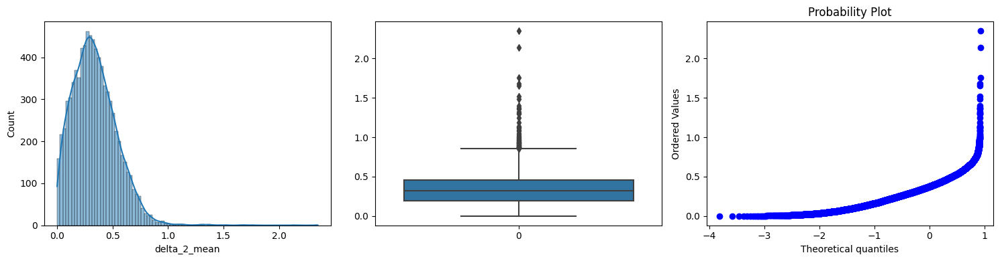

In [202]:
# Applyig Gaussian Transformation:
DELTA_2_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='delta_2_mean', 
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='delta_2_mean')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_2_MEAN_TRANSFORMED).visualize_feature(feature='delta_2_mean')

In [203]:
# Counting Outliers:
DELTA_2_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('delta_2_mean')
DELTA_2_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_2_MEAN_TRANSFORMED).count_outliers('delta_2_mean')
print(f'Number of outliers before Gaussian Transformation: {DELTA_2_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_2_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_2_MEAN_TRANSFORMED['delta_2_mean'].skew()}")
print(f'Number of missing values: {DELTA_2_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 214
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: 0.9720507806258851
Number of missing values: 1794


In [204]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['delta_2_mean'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['delta_2_mean'])

### 54. delta_2_median:
- __Applied Method:__ No method:

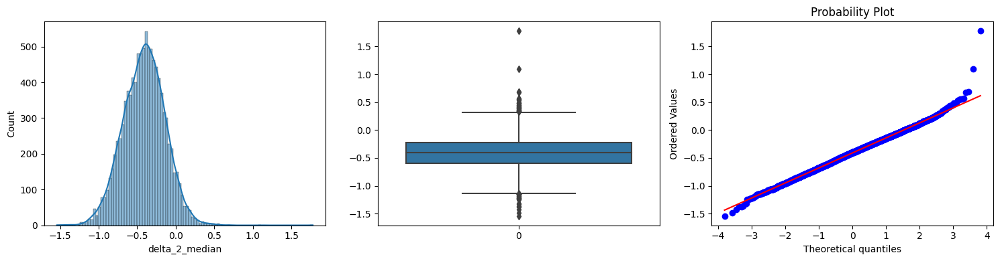

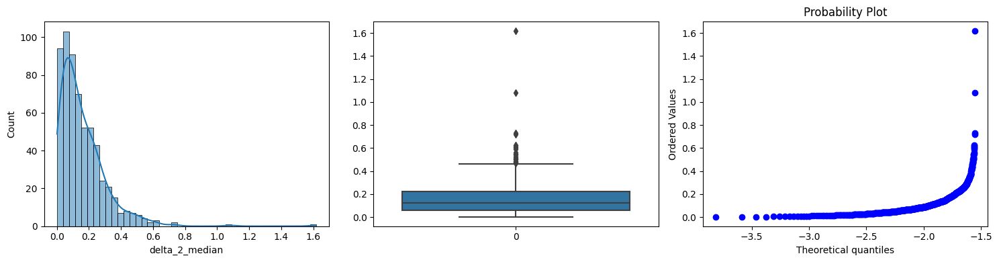

In [205]:
# Applyig Gaussian Transformation:
DELTA_2_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='delta_2_median', 
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='delta_2_median')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_2_MEDIAN_TRANSFORMED).visualize_feature(feature='delta_2_median')

In [206]:
# Counting Outliers:
DELTA_2_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('delta_2_median')
DELTA_2_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_2_MEDIAN_TRANSFORMED).count_outliers('delta_2_median')
print(f'Number of outliers before Gaussian Transformation: {DELTA_2_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_2_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_2_MEDIAN_TRANSFORMED['delta_2_median'].skew()}")
print(f'Number of missing values: {DELTA_2_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 71
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: 2.9267363561438327
Number of missing values: 9481


In [207]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['delta_2_median'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['delta_2_median'])

### 55. delta_2_std:
- __Applied Method:__:
- square_root => 36 outliers but Normal Distribution
- exponential => 32 outliers but skewed

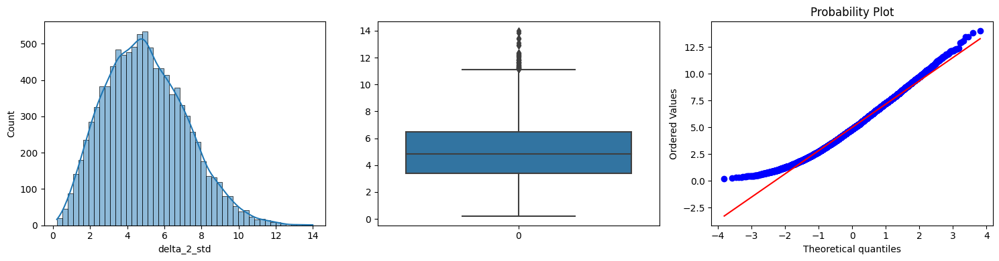

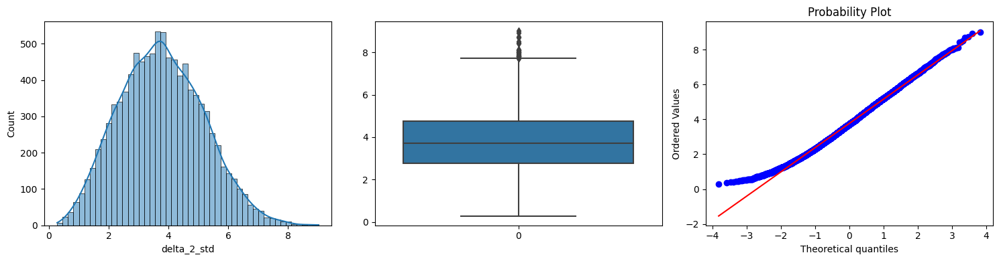

In [208]:
# Applyig Gaussian Transformation:
DELTA_2_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='delta_2_std', 
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='delta_2_std')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_2_STD_TRANSFORMED).visualize_feature(feature='delta_2_std')

In [209]:
# Counting Outliers:
DELTA_2_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('delta_2_std')
DELTA_2_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_2_STD_TRANSFORMED).count_outliers('delta_2_std')
print(f'Number of outliers before Gaussian Transformation: {DELTA_2_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_2_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_2_STD_TRANSFORMED['delta_2_std'].skew()}")
print(f'Number of missing values: {DELTA_2_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 59
Number of outliers after Gaussian Transformation: 32
Outlier Coefficient: 0.20810314433303018
Number of missing values: 0


In [210]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DELTA_2_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='delta_2_std', 
                                                                                               trans_method='exponential')
X_TEST_DELTA_2_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='delta_2_std', 
                                                                                             trans_method='exponential')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DELTA_2_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DELTA_2_STD_TRANSFORMED)

### 56. ca_max:
- __Applied Method:__ cube_root:

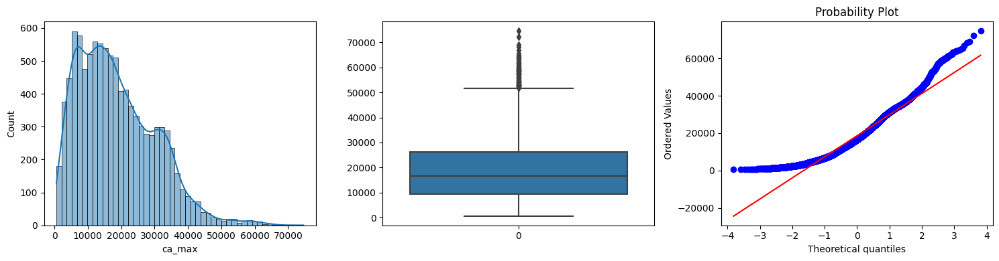

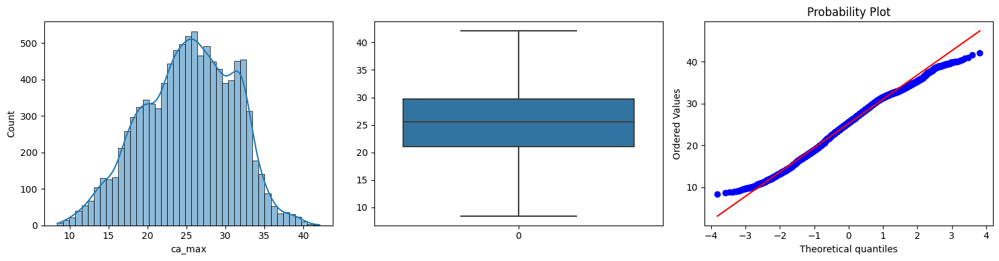

In [211]:
# Applyig Gaussian Transformation:
CA_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ca_max', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ca_max')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CA_MAX_TRANSFORMED).visualize_feature(feature='ca_max')

In [212]:
# Counting Outliers:
CA_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ca_max')
CA_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CA_MAX_TRANSFORMED).count_outliers('ca_max')
print(f'Number of outliers before Gaussian Transformation: {CA_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CA_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CA_MAX_TRANSFORMED['ca_max'].skew()}")
print(f'Number of missing values: {CA_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 112
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: -0.20033832825037182
Number of missing values: 0


In [213]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CA_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ca_max', 
                                                                                               trans_method='cube_root')
X_TEST_CA_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ca_max', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CA_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CA_MAX_TRANSFORMED)

### 57. ca_min:
- __Applied Method:__ cube_root:

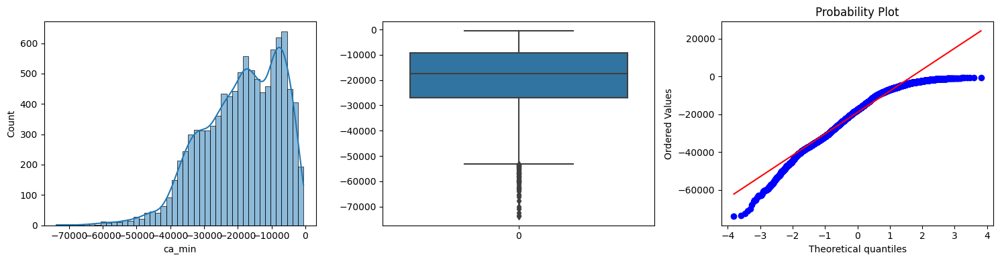

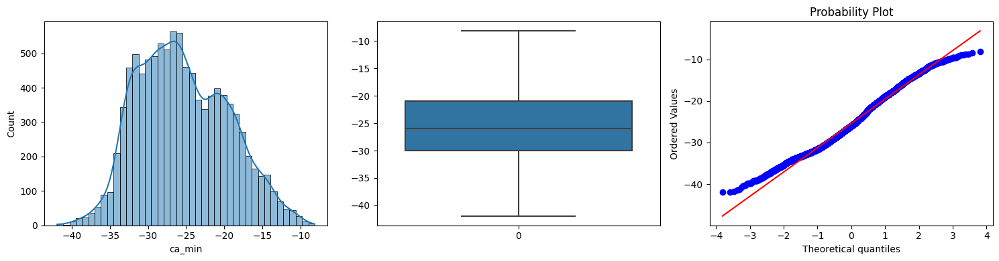

In [214]:
# Applyig Gaussian Transformation:
CA_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ca_min', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ca_min')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CA_MIN_TRANSFORMED).visualize_feature(feature='ca_min')

In [215]:
# Counting Outliers:
CA_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ca_min')
CA_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CA_MIN_TRANSFORMED).count_outliers('ca_min')
print(f'Number of outliers before Gaussian Transformation: {CA_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CA_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CA_MIN_TRANSFORMED['ca_min'].skew()}")
print(f'Number of missing values: {CA_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 67
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: 0.27676972924776994
Number of missing values: 0


In [216]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CA_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ca_min', 
                                                                                               trans_method='cube_root')
X_TEST_CA_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ca_min', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CA_MIN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CA_MIN_TRANSFORMED)

### 58. ca_mean:
- __Applied Method:__ cube_root:

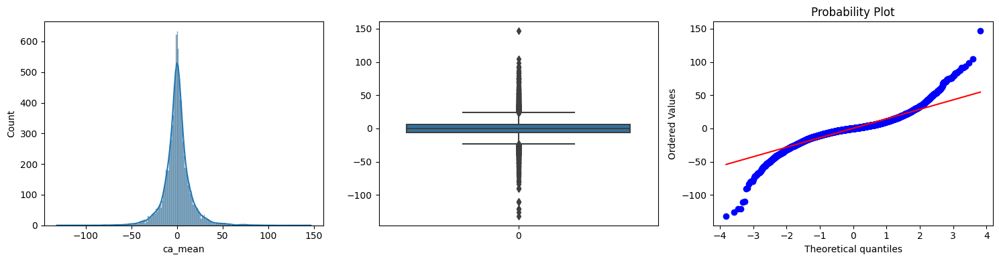

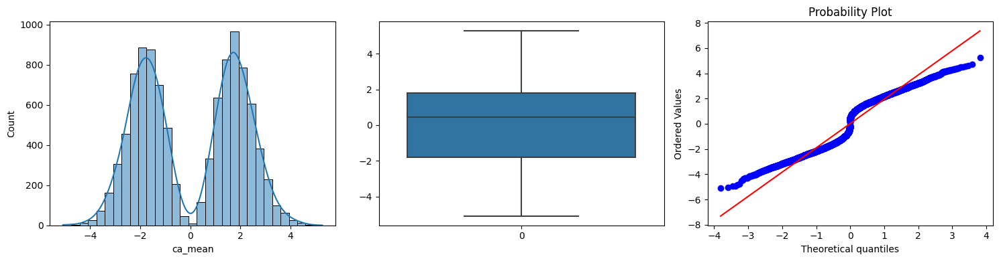

In [217]:
# Applyig Gaussian Transformation:
CA_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ca_mean', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ca_mean')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CA_MEAN_TRANSFORMED).visualize_feature(feature='ca_mean')

In [218]:
# Counting Outliers:
CA_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ca_mean')
CA_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CA_MEAN_TRANSFORMED).count_outliers('ca_mean')
print(f'Number of outliers before Gaussian Transformation: {CA_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CA_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CA_MEAN_TRANSFORMED['ca_mean'].skew()}")
print(f'Number of missing values: {CA_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 940
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: -0.008401580963133782
Number of missing values: 0


In [219]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CA_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ca_mean', 
                                                                                               trans_method='cube_root')
X_TEST_CA_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ca_mean', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CA_MEAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CA_MEAN_TRANSFORMED)

### 59. ca_median:
- __Applied Method:__ cube_root:

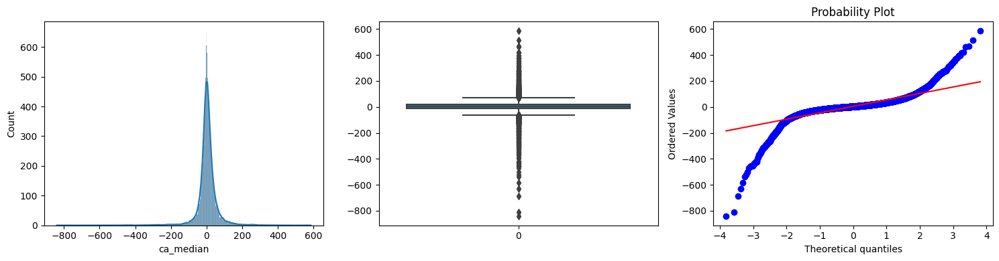

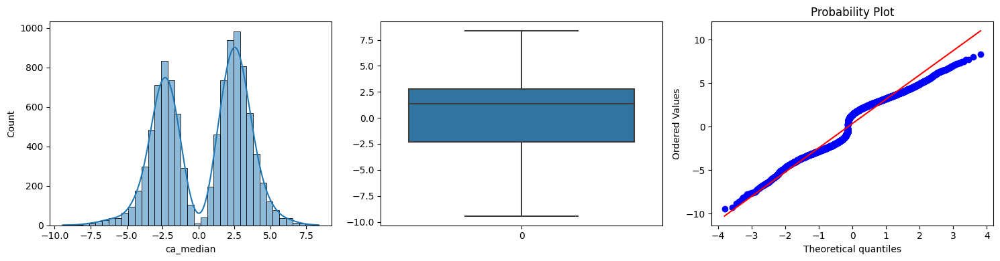

In [220]:
# Applyig Gaussian Transformation:
CA_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ca_median', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ca_median')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CA_MEDIAN_TRANSFORMED).visualize_feature(feature='ca_median')

In [221]:
# Counting Outliers:
CA_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ca_median')
CA_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CA_MEDIAN_TRANSFORMED).count_outliers('ca_median')
print(f'Number of outliers before Gaussian Transformation: {CA_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CA_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CA_MEDIAN_TRANSFORMED['ca_median'].skew()}")
print(f'Number of missing values: {CA_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 1053
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: -0.20539662756064606
Number of missing values: 0


In [222]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CA_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ca_median', 
                                                                                               trans_method='cube_root')
X_TEST_CA_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ca_median', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CA_MEDIAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CA_MEDIAN_TRANSFORMED)

### 60. ca_std:
- __Applied Method:__ cube_root

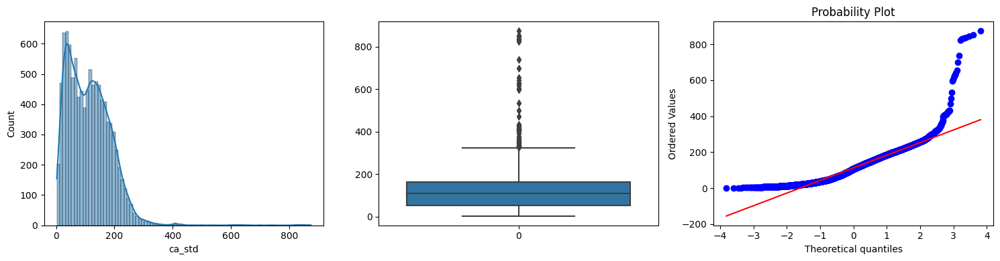

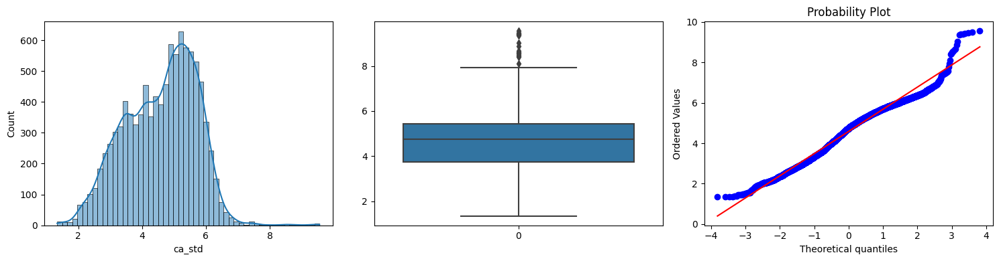

In [223]:
# Applyig Gaussian Transformation:
CA_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ca_std', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ca_std')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CA_STD_TRANSFORMED).visualize_feature(feature='ca_std')

In [224]:
# Counting Outliers:
CA_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ca_std')
CA_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CA_STD_TRANSFORMED).count_outliers('ca_std')
print(f'Number of outliers before Gaussian Transformation: {CA_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CA_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CA_STD_TRANSFORMED['ca_std'].skew()}")
print(f'Number of missing values: {CA_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 59
Number of outliers after Gaussian Transformation: 17
Outlier Coefficient: -0.22076623661857386
Number of missing values: 0


In [225]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CA_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ca_std', 
                                                                                               trans_method='cube_root')
X_TEST_CA_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ca_std', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CA_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CA_STD_TRANSFORMED)

### 61. cd_max:
- __Applied Method:__ cube_root

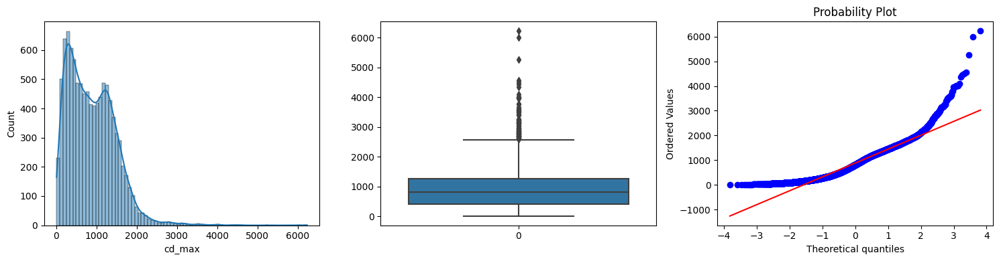

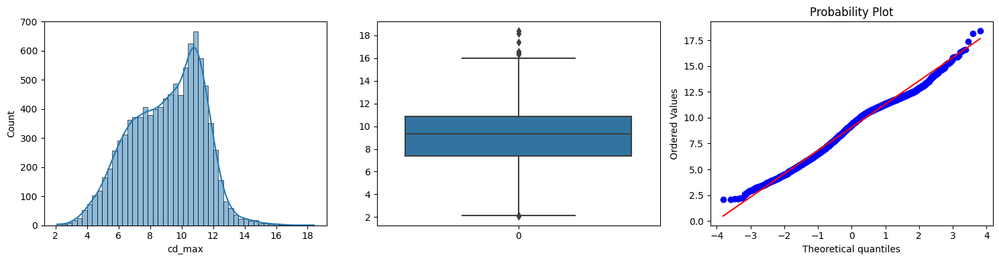

In [226]:
# Applyig Gaussian Transformation:
CD_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='cd_max', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='cd_max')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CD_MAX_TRANSFORMED).visualize_feature(feature='cd_max')

In [227]:
# Counting Outliers:
CD_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('cd_max')
CD_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CD_MAX_TRANSFORMED).count_outliers('cd_max')
print(f'Number of outliers before Gaussian Transformation: {CD_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CD_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CD_MAX_TRANSFORMED['cd_max'].skew()}")
print(f'Number of missing values: {CD_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 99
Number of outliers after Gaussian Transformation: 9
Outlier Coefficient: -0.23657883082193354
Number of missing values: 0


In [228]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CD_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='cd_max', 
                                                                                               trans_method='cube_root')
X_TEST_CD_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='cd_max', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CD_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CD_MAX_TRANSFORMED)

### 62. cd_min:
- __Applied Method:__ cube_root

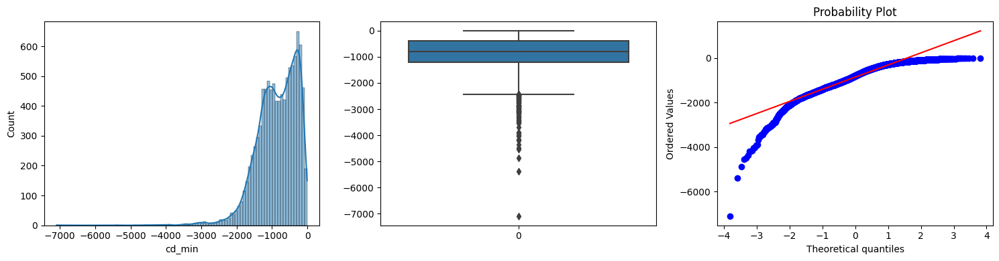

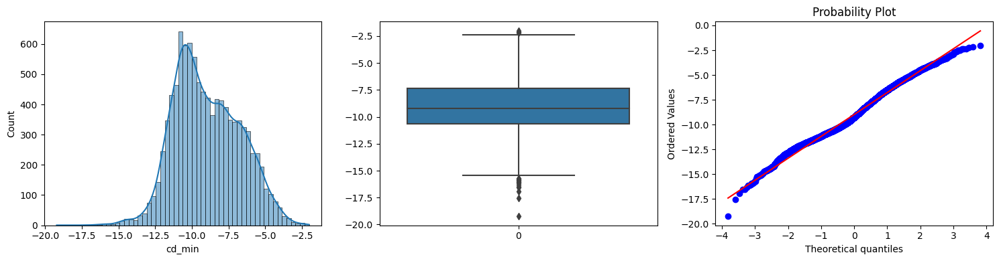

In [229]:
# Applyig Gaussian Transformation:
CD_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='cd_min', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='cd_min')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CD_MIN_TRANSFORMED).visualize_feature(feature='cd_min')

In [230]:
# Counting Outliers:
CD_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('cd_min')
CD_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CD_MIN_TRANSFORMED).count_outliers('cd_min')
print(f'Number of outliers before Gaussian Transformation: {CD_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CD_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CD_MIN_TRANSFORMED['cd_min'].skew()}")
print(f'Number of missing values: {CD_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 122
Number of outliers after Gaussian Transformation: 18
Outlier Coefficient: 0.19983290962664005
Number of missing values: 0


In [231]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CD_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='cd_min', 
                                                                                               trans_method='cube_root')
X_TEST_CD_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='cd_min', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CD_MIN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CD_MIN_TRANSFORMED)

### 63. cd_mean:
- __Applied Method:__ cube_root

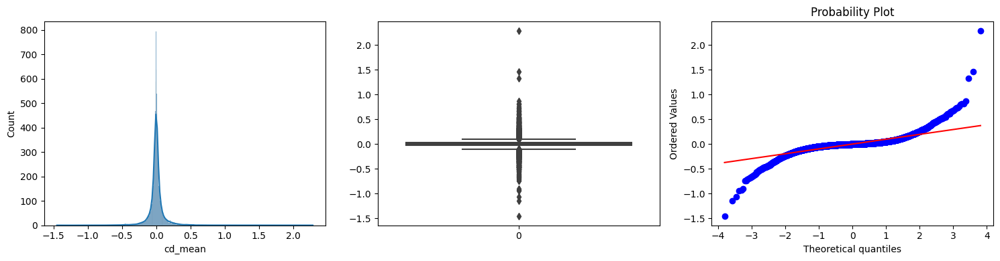

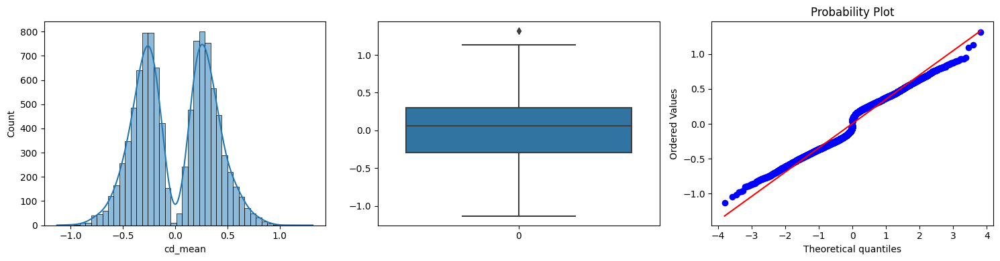

In [232]:
# Applyig Gaussian Transformation:
CD_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='cd_mean', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='cd_mean')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CD_MEAN_TRANSFORMED).visualize_feature(feature='cd_mean')

In [233]:
# Counting Outliers:
CD_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('cd_mean')
CD_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CD_MEAN_TRANSFORMED).count_outliers('cd_mean')
print(f'Number of outliers before Gaussian Transformation: {CD_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CD_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CD_MEAN_TRANSFORMED['cd_mean'].skew()}")
print(f'Number of missing values: {CD_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 1620
Number of outliers after Gaussian Transformation: 1
Outlier Coefficient: 0.014599641729163861
Number of missing values: 0


In [234]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CD_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='cd_mean', 
                                                                                               trans_method='cube_root')
X_TEST_CD_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='cd_mean', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CD_MEAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CD_MEAN_TRANSFORMED)

### 64. cd_median:
- __Applied Method:__ cube_root

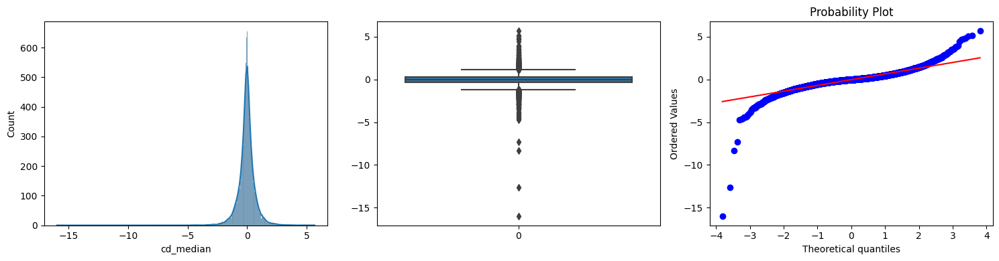

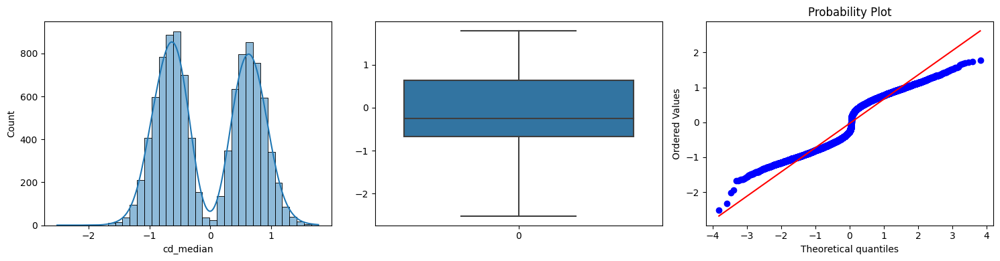

In [235]:
# Applyig Gaussian Transformation:
CD_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='cd_median', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='cd_median')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CD_MEDIAN_TRANSFORMED).visualize_feature(feature='cd_median')

In [236]:
# Counting Outliers:
CD_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('cd_median')
CD_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CD_MEDIAN_TRANSFORMED).count_outliers('cd_median')
print(f'Number of outliers before Gaussian Transformation: {CD_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CD_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CD_MEDIAN_TRANSFORMED['cd_median'].skew()}")
print(f'Number of missing values: {CD_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 844
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: 0.05547942144138833
Number of missing values: 0


In [237]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CD_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='cd_median', 
                                                                                               trans_method='cube_root')
X_TEST_CD_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='cd_median', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CD_MEDIAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CD_MEDIAN_TRANSFORMED)

### 65. cd_std:
- __Applied Method:__ cube_root

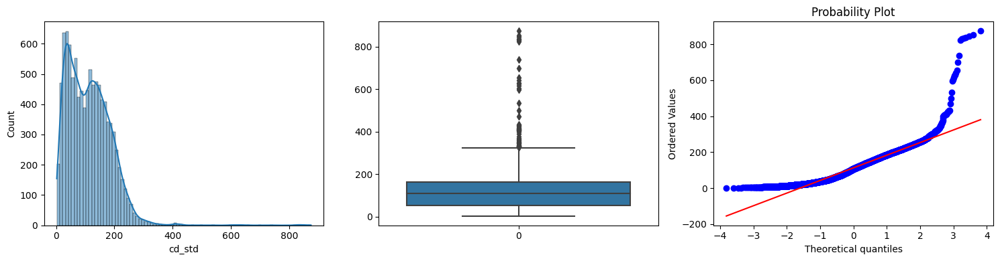

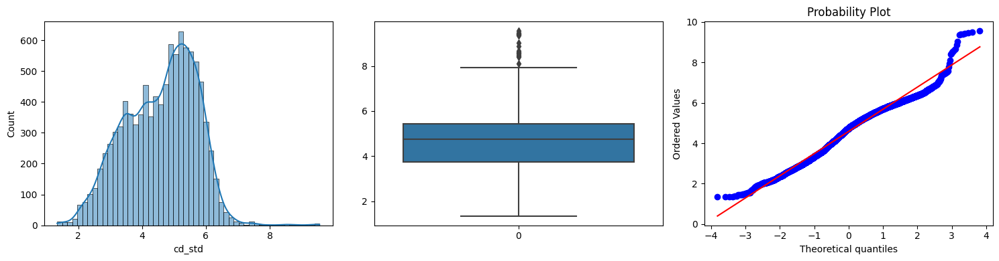

In [238]:
# Applyig Gaussian Transformation:
CD_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='cd_std', 
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='cd_std')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CD_STD_TRANSFORMED).visualize_feature(feature='cd_std')

In [239]:
# Counting Outliers:
CD_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('cd_std')
CD_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CD_STD_TRANSFORMED).count_outliers('cd_std')
print(f'Number of outliers before Gaussian Transformation: {CD_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CD_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CD_STD_TRANSFORMED['cd_std'].skew()}")
print(f'Number of missing values: {CD_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 59
Number of outliers after Gaussian Transformation: 17
Outlier Coefficient: -0.22076623661857386
Number of missing values: 0


In [240]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CD_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='cd_std', 
                                                                                               trans_method='cube_root')
X_TEST_CD_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='cd_std', 
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CD_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CD_STD_TRANSFORMED)

In [241]:
# Creating a new DataFrame including all the transformed data:
X_TRAIN_TRANSFORMED = pd.concat(X_TRAIN_TRANSFORMED_FEATURES, axis=1)
X_TEST_TRANSFORMED = pd.concat(X_TEST_TRANSFORMED_FEATURES, axis=1)

In [242]:
X_TRAIN_TRANSFORMED.head()

,ds_max,ds_min,ds_mean,ds_median,ds_std,ds_std,ae_mean,ae_median,ae_std,rm_max,rm_min,rm_mean,rm_median,rm_std,zcr,zcr_max,zcr_min,zcr_mean,zcr_median,zcr_std,peak_amplitude,peak_frequency,ber_max,ber_min,ber_mean,ber_median,ber_std,sc_max,sc_min,sc_mean,sc_median,sc_std,sb_max,sb_min,sb_mean,sb_median,sb_std,mfcc_max,mfcc_min,mfcc_mean,mfcc_median,mfcc_std,delta_1_max,delta_1_min,delta_1_mean,delta_1_median,delta_1_std,delta_2_max,delta_2_min,delta_2_mean,delta_2_median,delta_2_std,ca_max,ca_min,ca_mean,ca_median,ca_std,cd_max,cd_min,cd_mean,cd_median,cd_std
0,28.860275,-28.114686,-2.618284,-3.505109,15.105004,15.105004,24.167062,25.122018,18.263473,16.758516,8.813742,14.892363,15.243728,9.675131,0.126175,16.758516,6.528936,14.892363,15.243728,9.675131,14.632801,3.561446,34.693172,8.014493,31.761707,29.521462,32.796766,4.148078,41.788583,46.320536,45.749726,1.251856,69.107480,16.853569,24.316623,22.216445,3.006702,236.834356,-47.995235,8.771836,4.408040,13.247563,2.359530,-2.233409,-0.349926,-0.553865,1.683419,6.747568,-4.953616,-0.132255,-0.287971,2.595028,32.338876,-31.533791,-2.912859,-3.904737,5.655997,11.683345,-10.986212,0.075988,-0.815765,5.655997
1,18.232176,-18.196588,1.710801,-2.509307,9.705076,9.705076,16.358922,16.794816,11.659660,10.788335,7.479362,9.540674,9.675988,6.340493,0.125922,10.788335,6.036443,9.540674,9.675988,6.340493,13.386734,3.648458,35.200955,5.701935,31.708196,29.455828,33.042198,4.439863,40.964491,47.678099,45.935926,1.984270,99.737123,15.607812,24.948430,21.281605,3.959115,242.088668,-46.860879,8.188552,0.397573,12.485832,3.282181,-3.013076,-0.656101,0.608560,2.496882,15.337628,-9.338394,0.426557,-0.746641,5.334079,20.450041,-20.417768,1.963353,-2.751841,3.638939,6.854097,-6.353401,0.248622,0.478840,3.638939
2,22.359974,-21.122992,-1.256525,2.348968,11.120326,11.120326,17.201927,15.970129,13.447379,13.438067,8.274835,10.906580,10.754945,7.396313,0.168964,13.438067,6.339657,10.906580,10.754945,7.396313,13.326027,4.312541,32.894686,5.913573,30.122518,28.386612,31.011085,4.576365,41.672354,55.903800,53.018406,2.275980,89.711818,21.060047,28.899359,26.416590,3.311138,267.053048,-61.776970,8.508572,8.936676,13.042790,3.366450,-3.116111,-0.817617,0.608811,2.689425,12.465742,-7.686054,0.408325,-0.338393,4.666851,24.975805,-23.682662,-1.093239,2.563678,5.241295,9.948558,-9.910883,0.303815,0.445479,5.241295
3,24.498470,-23.801605,1.514942,-0.715082,12.302449,12.302449,20.454768,20.032050,15.495119,14.199549,6.208594,12.023474,12.226091,8.397004,0.141131,14.199549,5.477803,12.023474,12.226091,8.397004,13.867523,3.496908,35.237179,3.932404,32.563957,30.581940,33.337862,4.814731,41.104092,51.500562,50.278539,2.289839,123.201241,17.728051,25.095441,21.495065,3.818968,239.363997,-56.923303,8.309815,3.325830,12.899354,2.684041,-2.663804,-0.441961,0.409744,2.084900,10.531411,-6.008045,0.271395,-0.271314,3.721787,27.488772,-26.540902,1.756285,1.466361,4.946859,10.412861,-10.291257,-0.271719,-0.191093,4.946859
4,21.268241,-19.417835,1.419145,1.064059,11.183437,11.183437,18.967693,18.990570,11.811768,12.167327,8.325813,11.038981,11.108996,6.584628,0.160116,12.167327,6.358082,11.038981,11.108996,6.584628,13.522422,3.951644,34.853095,7.989766,31.642784,29.321306,32.868718,4.354290,42.226982,54.870801,55.187149,1.559671,63.100507,20.178729,24.485209,23.572373,2.460502,236.616851,-60.118241,8.334458,8.327948,12.676435,3.259551,-2.785270,0.600361,0.761409,2.307736,10.263691,-6.846871,0.199481,-0.755867,3.994456,23.844472,-21.781735,1.501533,-1.467203,4.993132,9.556521,-9.448032,-0.306410,-0.396870,4.993132


In [243]:
X_TEST_TRANSFORMED.head()

,ds_max,ds_min,ds_mean,ds_median,ds_std,ds_std,ae_mean,ae_median,ae_std,rm_max,rm_min,rm_mean,rm_median,rm_std,zcr,zcr_max,zcr_min,zcr_mean,zcr_median,zcr_std,peak_amplitude,peak_frequency,ber_max,ber_min,ber_mean,ber_median,ber_std,sc_max,sc_min,sc_mean,sc_median,sc_std,sb_max,sb_min,sb_mean,sb_median,sb_std,mfcc_max,mfcc_min,mfcc_mean,mfcc_median,mfcc_std,delta_1_max,delta_1_min,delta_1_mean,delta_1_median,delta_1_std,delta_2_max,delta_2_min,delta_2_mean,delta_2_median,delta_2_std,ca_max,ca_min,ca_mean,ca_median,ca_std,cd_max,cd_min,cd_mean,cd_median,cd_std
0,25.598838,-26.315177,-1.529499,2.168896,14.388265,14.388265,22.665086,22.704846,15.499660,16.224124,7.963620,14.148349,14.263684,9.473843,0.172524,16.224124,6.224651,14.148349,14.263684,9.473843,14.465872,3.567112,33.004521,4.749533,31.037338,29.816888,31.548170,4.671183,43.992975,53.384887,48.925704,2.417433,112.756649,19.014391,28.175617,22.638838,4.217536,277.762966,-51.402379,8.723810,1.925869,13.647604,3.571014,-3.016018,-0.595239,0.255505,2.538701,16.081663,-10.999939,0.393350,-0.922817,5.712487,28.727653,-29.309125,-1.518620,2.183727,5.641492,11.344332,-9.699212,0.441722,0.761771,5.641492
1,15.925591,-16.262540,0.727898,2.547014,8.977010,8.977010,13.576612,13.404613,10.186836,10.284864,6.561182,8.784612,8.442967,6.144406,0.097755,10.284864,5.643512,8.784612,8.442967,6.144406,12.943621,3.288802,33.184706,4.360389,30.710229,29.458702,31.322315,4.676880,31.399042,39.925166,37.265701,2.503031,126.680333,18.969493,27.514417,21.560303,4.458694,254.389923,-40.720331,8.431811,9.912753,12.294849,3.649319,-3.261484,-0.854061,0.524256,2.875746,13.619590,-9.612891,0.413069,-0.686131,5.370277,17.879095,-18.062226,-0.846129,2.718450,2.995625,6.287308,-6.600001,0.165168,-0.687094,2.995625
2,29.776036,-30.316798,1.500980,1.988613,16.079033,16.079033,25.273060,27.443589,20.543538,18.014444,9.558609,15.445255,16.663474,12.288840,0.128691,18.014444,6.772327,15.445255,16.663474,12.288840,15.112561,3.572746,35.984279,4.194244,32.870705,29.338899,34.002625,4.808505,36.824014,47.192483,42.330453,2.695320,116.866142,14.314526,26.999327,22.757089,4.478753,288.470203,-39.967233,8.884014,3.636553,13.843654,3.342975,-3.057378,-0.394187,0.647362,2.584757,14.188362,-8.577275,0.437611,-0.578630,5.087291,33.419669,-34.015648,0.999025,1.670751,5.377814,11.157072,-11.036782,0.572789,-0.682789,5.377814
3,33.223727,-31.101681,3.244647,-3.862650,17.218540,17.218540,27.354010,29.337871,23.238176,19.964673,9.817352,16.616333,17.551416,12.857237,0.080451,19.964673,6.852454,16.616333,17.551416,12.857237,15.097905,3.091443,37.833774,6.962199,33.813228,29.232417,35.649271,4.082636,23.535622,33.506176,32.452841,1.713754,90.604304,15.647056,22.441512,19.656425,3.444816,249.718923,-38.749008,9.136398,5.786885,13.511560,1.787493,-2.190029,-0.533203,0.711155,1.623308,6.790804,-4.748969,0.091493,-0.388362,2.492039,37.270614,-34.905450,3.662040,-4.039760,5.760858,12.906205,-13.383952,0.190562,-0.612059,5.760858
4,23.470284,-23.007605,-1.636431,-2.288477,14.091616,14.091616,21.294304,21.256039,13.150958,15.933351,11.238038,13.881616,13.945023,8.717380,0.152871,15.933351,7.257913,13.881616,13.945023,8.717380,14.493356,3.567112,35.494336,4.712696,31.856822,29.091626,33.378562,4.725400,45.521567,57.825445,57.744640,2.127551,109.615354,19.777235,26.747902,23.239299,3.739581,282.506472,-61.773172,8.535686,2.941904,13.614379,3.683641,-3.102380,-0.655103,0.479731,2.816344,12.408416,-8.724940,0.277477,-0.413702,4.402408,26.307611,-25.037004,-1.665727,-2.429262,6.269615,11.440889,-11.147185,-0.544023,-0.360740,6.269615


### Checking Train and Test sets after applying Gaussian Transformation:
- In some cases, Gaussian Transformation creates NaN Values.
- In this part, Train and Test datasets are checked if they contain any missing values.
- If there are missing values, then they are replced with the median.

In [244]:
print(f'Number of missing values in X_TRAIN_TRANSFORMED:{X_TRAIN_TRANSFORMED.isna().sum().sum()}')
print(f'Number of missing values in X_TEST_TRANSFORMED:{X_TEST_TRANSFORMED.isna().sum().sum()}')

Number of missing values in X_TRAIN_TRANSFORMED:1
Number of missing values in X_TEST_TRANSFORMED:0


In [245]:
# Replacing Missing Value with the Median:
X_TRAIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN_TRANSFORMED).replace_missing_values(feature='delta_1_max', replace_method='median')

### 2.2.2. Normalization:
- Using 'MinMaxScaler' on all Features so that all values are between 0 and 1.
- fit_transform and transform are used for X_train and X_test respectively to make sure that the normalization parameters of the X_train are applied on the X_test and therefore it leads to avoid Data Leakage.

__Note:__
- For Demonistration purpose, Normalization is applied on a complete Dataset. But in data-preparation.py, Normalization is applied on Train and Test sets separately.

In [246]:
X_TRAIN_NORMALIZED, X_TEST_NORMALIZED = FeatureEngineeringTabular(dataset=DATASET).normalize_data(x_train=X_TRAIN_TRANSFORMED, x_test=X_TEST_TRANSFORMED)

In [247]:
# Displaying X_TRAIN_NORMALIZED:
X_TRAIN_NORMALIZED.describe()

,ds_max,ds_min,ds_mean,ds_median,ds_std,ds_std,ae_mean,ae_median,ae_std,rm_max,rm_min,rm_mean,rm_median,rm_std,zcr,zcr_max,zcr_min,zcr_mean,zcr_median,zcr_std,peak_amplitude,peak_frequency,ber_max,ber_min,ber_mean,ber_median,ber_std,sc_max,sc_min,sc_mean,sc_median,sc_std,sb_max,sb_min,sb_mean,sb_median,sb_std,mfcc_max,mfcc_min,mfcc_mean,mfcc_median,mfcc_std,delta_1_max,delta_1_min,delta_1_mean,delta_1_median,delta_1_std,delta_2_max,delta_2_min,delta_2_mean,delta_2_median,delta_2_std,ca_max,ca_min,ca_mean,ca_median,ca_std,cd_max,cd_min,cd_mean,cd_median,cd_std
count,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10086.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000,10087.000000
mean,0.498210,0.486095,0.497225,0.562535,0.373012,0.373012,0.463933,0.517829,0.453935,0.396463,0.336394,0.370268,0.427214,0.363673,0.480727,0.396463,0.774532,0.370268,0.427214,0.363673,0.580884,0.466339,0.410062,0.382051,0.366441,0.420999,0.394115,0.520204,0.538033,0.549979,0.578843,0.525365,0.511574,0.595732,0.551243,0.699351,0.510628,0.568036,0.298024,0.626543,0.391192,0.566199,0.464424,0.367024,0.436634,0.613101,0.505212,0.419410,0.633060,0.525964,0.340884,0.399540,0.500079,0.488891,0.493354,0.550600,0.394647,0.427691,0.595314,0.464347,0.577683,0.394647
std,0.171668,0.174235,0.193497,0.160951,0.127147,0.127147,0.149986,0.142526,0.171171,0.140303,0.100369,0.123949,0.116163,0.136845,0.181615,0.140303,0.061287,0.123949,0.116163,0.136845,0.133075,0.214626,0.132092,0.143185,0.128025,0.131865,0.130840,0.134086,0.164198,0.153165,0.145277,0.150115,0.209259,0.114364,0.117018,0.096146,0.181577,0.146850,0.139879,0.110906,0.128680,0.125826,0.126681,0.160294,0.164845,0.209940,0.142118,0.162655,0.137530,0.047605,0.081172,0.159847,0.172926,0.173814,0.193434,0.162040,0.134866,0.139023,0.129325,0.145229,0.168372,0.134866
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.375137,0.351299,0.320714,0.414675,0.282826,0.282826,0.352527,0.411544,0.334656,0.294084,0.266863,0.282983,0.344796,0.266088,0.358598,0.294084,0.737768,0.282983,0.344796,0.266088,0.501100,0.331823,0.316028,0.279178,0.276297,0.336505,0.301280,0.421817,0.448332,0.470333,0.502341,0.423357,0.353570,0.540126,0.479961,0.653464,0.379346,0.470091,0.205565,0.562122,0.303510,0.491111,0.387687,0.244525,0.299126,0.386555,0.410983,0.307355,0.543995,0.498050,0.285541,0.283336,0.376625,0.354718,0.316601,0.401732,0.290988,0.322890,0.497448,0.343410,0.428083,0.290988
50%,0.507774,0.467694,0.533738,0.621270,0.375279,0.375279,0.474700,0.524076,0.453713,0.401088,0.322865,0.371069,0.426878,0.361627,0.495957,0.401088,0.775236,0.371069,0.426878,0.361627,0.585378,0.501935,0.400357,0.369021,0.352817,0.414008,0.382349,0.507771,0.557085,0.561732,0.590387,0.516103,0.515924,0.608597,0.553319,0.707917,0.512113,0.569277,0.281786,0.624718,0.384462,

In [248]:
# Displaying X_TEST_NORMALIZED:
X_TEST_NORMALIZED.describe()

,ds_max,ds_min,ds_mean,ds_median,ds_std,ds_std,ae_mean,ae_median,ae_std,rm_max,rm_min,rm_mean,rm_median,rm_std,zcr,zcr_max,zcr_min,zcr_mean,zcr_median,zcr_std,peak_amplitude,peak_frequency,ber_max,ber_min,ber_mean,ber_median,ber_std,sc_max,sc_min,sc_mean,sc_median,sc_std,sb_max,sb_min,sb_mean,sb_median,sb_std,mfcc_max,mfcc_min,mfcc_mean,mfcc_median,mfcc_std,delta_1_max,delta_1_min,delta_1_mean,delta_1_median,delta_1_std,delta_2_max,delta_2_min,delta_2_mean,delta_2_median,delta_2_std,ca_max,ca_min,ca_mean,ca_median,ca_std,cd_max,cd_min,cd_mean,cd_median,cd_std
count,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000,2522.000000
mean,0.496475,0.490504,0.497798,0.562859,0.370986,0.370986,0.461918,0.515636,0.452224,0.394303,0.337049,0.368404,0.425227,0.360572,0.476183,0.394303,0.774610,0.368404,0.425227,0.360572,0.578171,0.461706,0.409974,0.378194,0.365799,0.420315,0.393789,0.520301,0.534932,0.547445,0.576754,0.526206,0.517170,0.596389,0.552150,0.699195,0.515691,0.568679,0.298091,0.625341,0.393416,0.564612,0.465870,0.361693,0.432442,0.615854,0.510962,0.423352,0.630394,0.526226,0.340737,0.403794,0.498219,0.493322,0.493413,0.551313,0.393207,0.426609,0.594467,0.463899,0.577211,0.393207
std,0.174133,0.176249,0.191832,0.160627,0.128489,0.128489,0.151187,0.143435,0.173623,0.142646,0.100720,0.125226,0.117306,0.138841,0.181531,0.142646,0.063104,0.125226,0.117306,0.138841,0.133351,0.213488,0.130415,0.139799,0.126472,0.131905,0.129349,0.133987,0.162548,0.151714,0.142937,0.149221,0.204860,0.115618,0.117726,0.092603,0.175990,0.145428,0.137422,0.111177,0.128494,0.126993,0.127605,0.162563,0.165753,0.208288,0.145515,0.163386,0.139022,0.051339,0.082820,0.161175,0.175373,0.175666,0.191552,0.161808,0.136348,0.140771,0.131760,0.145825,0.166659,0.136348
min,-0.046501,0.044568,0.058168,-0.021953,-0.022515,-0.022515,-0.031107,0.059099,-0.024793,-0.002395,0.020385,-0.027277,0.049950,-0.009067,0.012959,-0.002395,0.274181,-0.027277,0.049950,-0.009067,0.066814,0.008904,-0.098567,0.012934,-0.120939,-0.057278,-0.107215,0.067430,-0.003288,0.000590,0.063231,0.076291,0.015409,0.002852,0.041096,0.244453,-0.015072,0.014924,-0.026064,-0.019827,0.048350,-0.048785,0.057623,-0.045884,-0.004815,0.096482,0.067568,0.002619,-0.232490,-0.024217,-0.006756,0.002710,-0.047063,0.045749,0.045656,-0.058157,0.004288,0.008217,0.114162,0.093540,0.126868,0.004288
25%,0.363285,0.352874,0.322130,0.415834,0.277044,0.277044,0.342771,0.403075,0.325528,0.288965,0.267751,0.275705,0.341621,0.259054,0.347779,0.288965,0.738419,0.275705,0.341621,0.259054,0.497846,0.323530,0.319440,0.274570,0.278107,0.335013,0.301698,0.425833,0.446925,0.470718,0.501785,0.427659,0.362676,0.543450,0.485188,0.656168,0.391984,0.468685,0.209589,0.558722,0.304369,0.481763,0.387164,0.237484,0.296826,0.388461,0.415763,0.309339,0.539070,0.499399,0.287048,0.286111,0.364686,0.355521,0.319813,0.403722,0.282969,0.312761,0.493992,0.344608,0.427671,0.282969
50%,0.506418,0.476395,0.532869,0.622292,0.373001,0.373001,0.474209,0.524398,0.452905,0.397302,0.323967,0.368097,0.422678,0.354264,0.491517,0.397302,0.775908,0.368097,0.422678,0.354264,0.579536,0.501935,0.400233,0.367161,0.351525,0.413162,0.380734,0.507964,0.555264,0.560092,0.588869,0.518136,0.524370,0.610155,0.553949,0.706385,0.520774,0.566408,0.283090,0.623711,0.387183,0.586635,0.453843,0.347248,0.35438

## 2.3. Balancing Datasets:
- Balancing Dataset so that the number of subject per classes are equal.
- It is applied only on Train Dataset.

__Note:__
- For demonstration purpose, balancing train set is applied only on Holdout Cross-Validation.
- In data-preparation.py, Balancing train sets are applied on all Folds of the Cross-Validation.

In [249]:
X_TRAIN_RESAMPLED, Y_TRAIN_RESAMPLED = FeatureEngineeringTabular(dataset=DATASET).balance_dataset(x_train=X_TRAIN_NORMALIZED,
                                                                                           y_train=Y_TRAIN,
                                                                                           rand_state=c.RANDOM_STATE)
print(f'Length before sampling: {len(X_TRAIN_NORMALIZED)}')
print(f'Length after sampling: {len(X_TRAIN_RESAMPLED)}')

ValueError: Input X contains NaN.
SMOTE does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

# Conclusion:
In this section, different Feature Engineering Technique are applied as follows:
1. __Stratified K-Fold Cross-Validation__ to generate 6 Folds and to provide us an accurate view of the performance of the Machine Learning Model.
2. __Gaussian transformation__ tools such as (Log, Square-Root, Cube-Root, Exponential) are applied on each feature separately to correct the skewness and reduce the outliers.
3. __Normalization__ is applied to rescale the values of each feature between 0 and 1 to reduce the computational power of training the model as well as for better performance.
4. __Balancing Dataset (SMOTE Over-Sampling)__ is applied on Train set only for balacning the dataset and therefore avoid model bias.

__Note__:
- All these methods are applied on Train and Test sets separately.

# 3. Feature Selection:
- Checking of mean of a feature sample compared to the mean of the whole population.
- Checking the relationship between the feature (Continuous Numeric Feature) with the output target (Categorical Feature).
- Checking the relationship between features (2 Contonuous Numeric Features).
- It is conducted using Hypothesis Testing.

### Hypothesis Testing:
__Methodlogy:__
1. Formulate the Hypothesis Statements for each feature with the output target (H0, H1).
2. Determine the significance level (5% or 0.05).
3. Determine the type of test (Based on the type of Data).
4. Calculate the Test Statistic values and the p values
5. Make Decision to accept or reject Null Hypothesis (in other words: to select the feature or not).

__Note:__
- In case of 1 Feature (1 Continuous Feature), **One Sample T-Test** is conducted.
- In case of 2 Features (1 Continuous Feature and 1 Categorical Target), **Independent Samples T-Test** is conducted.
- In case of 2 Features (2 Continuous Features), **Pearson’s Correlation Coefficient** is conducted.

## 3.1. Checking the mean of a Sample from a Feature compared to the mean of the Population:
#### Steps:
1. **Hypothesis Statements:**
- H0: There is no difference between the mean of the population and the mean of the sample.
- H1: There is difference between the mean of the population and the mean of the sample.
2. **Significance Level:** 5% or 0.05
3. **Test Type:** One Sample T-Test
4. **Decision:** Accept or reject the Null Hypothesis.

__Note:__
- The steps mentioned above are applied on each feature individually.

In [ ]:
X_TRAIN_SELECTED, X_TEST_SELECTED, DROPPED_FEATURES = FeatureSelectionTabular(x_train=X_TRAIN_RESAMPLED,
                                                                              x_test=X_TEST,
                                                                              y_train=Y_TRAIN_RESAMPLED,
                                                                              y_test=Y_TEST).conduct_one_sample_ttest(*FEATURES, 
                                                                                                                      sample_size=2000)

In [ ]:
X_TRAIN_SELECTED

In [ ]:
X_TEST_SELECTED

In [ ]:
DROPPED_FEATURES

## 3.2. Correlation between Input Feature and Output Target:
### 3.2.1. Chi-Squred:

In [ ]:
FeatureSelectionTabular(x_train=X_TRAIN_RESAMPLED, 
                        x_test=X_TEST, 
                        y_train=Y_TRAIN_RESAMPLED, 
                        y_test=Y_TEST).get_top_features(method='chi2', num_features=10, plot=True)

### 3.2.2. Mutual Information:

In [ ]:
FeatureSelectionTabular(x_train=X_TRAIN_RESAMPLED, 
                        x_test=X_TEST, 
                        y_train=Y_TRAIN_RESAMPLED, 
                        y_test=Y_TEST).get_top_features(method='mutual_info', num_features=10, plot=True)

### 3.2.3. Feature Importance:

In [ ]:
FeatureSelectionTabular(x_train=X_TRAIN_RESAMPLED, 
                        x_test=X_TEST, 
                        y_train=Y_TRAIN_RESAMPLED, 
                        y_test=Y_TEST).get_top_features(method='feature_importance', num_features=10, plot=True)

In [ ]:
# Getting the Top Ranked Features:
TOP_RANKED_FEATURES = FeatureSelectionTabular(x_train=X_TRAIN_RESAMPLED, 
                                              x_test=X_TEST, 
                                              y_train=Y_TRAIN_RESAMPLED, 
                                              y_test=Y_TEST).get_top_features(method='mutual_info', num_features=10)

## 3.3. Correlation between two Input Features:
- In this part, the correlation of every 2 features is calculated.
- If the correlation is greater than 0.95, then it detects that the pair has high correlation.
- Based on the pair of features, the feature with higher skewness is dropped from the DataFrame.

In [ ]:
TOP_RANKED_FEATURES

In [ ]:
TOP_FEATURES = list(TOP_RANKED_FEATURES.iloc[:, 0])
X_TRAIN_SELECTED, X_TEST_SELECTED, CORRELATED_FEATURES = FeatureSelectionTabular(x_train=X_TRAIN_RESAMPLED,
                                                                                 x_test=X_TEST,
                                                                                 y_train=Y_TRAIN_RESAMPLED,
                                                                                 y_test=Y_TEST).drop_correlated_features(threshold=0.8,
                                                                                                                         top_features=TOP_FEATURES,
                                                                                                                         drop=True)

In [ ]:
len(CORRELATED_FEATURES)

In [ ]:
X_TRAIN_SELECTED

# Conclusion:
- In this section, the output dataset from Feature Engineering section has been examined with different techniques in order to select the most important features for the Machine Learning Model.
- Reducing the number of features helps to avoid overfitting of the model as it reduces the dementionality.
- All techniques are applied to X_TRAIN and X_TEST separately.

__Techniques used:__
1. Using one of the three methods (Chi-Squared, Mutual Information, Feature Importance) to check the correlation between the input feature (continuous numeric variable) and the output target( categorical variable).
2. Using Correlation technique to check the correlation between all the features and if both features have high correlation, then the one with lower skewness is dropped and not in the top_features.

__Output:__
- Features is reduced to 31 Features.